## Initialization

In [19]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "last_expr" ## "all"
%matplotlib inline  
## qt
%load_ext autoreload
%autoreload 2

import numpy as np
import cv2, glob, pickle, sys, os , pprint, winsound 
from datetime import datetime, time
from classes.pipeline import ALFPipeline
from main import main, project_overrides, challenge_overrides, harder_challenge_overrides
from common.utils import display_one, display_two

pp = pprint.PrettyPrinter(indent=2, width=100)
print('Current working dir: ', os.getcwd())

try:
    user_paths = os.environ['PYTHONPATH'].split(os.pathsep)
except KeyError:
    user_paths = []

if '.' not in sys.path:
    print("appending '.' to sys.path")
    sys.path.append('.')

sampleVideos = glob.glob('./test_videos/*.mp4')
# sampleCount = len(sampleVideos)
# sampleIndexes = range(sampleCount)
print()
print(datetime.now().strftime("%m-%d-%Y @ %H:%M:%S"))
print()
print(' Sample Videos Filenames: ')
print(' ----------------------- ')
for fn in sampleVideos:
    print('', fn)
    

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Current working dir:  E:\Users\kevin\OneDrive\git_projs\CarND-Advanced-Lane-Lines

05-29-2020 @ 11:29:34

 Sample Videos Filenames: 
 ----------------------- 
 ./test_videos\challenge_video.mp4
 ./test_videos\harder_challenge_video.mp4
 ./test_videos\project_video.mp4


## Create Pipeline

### Adjust Starting Frame 

In [3]:
# Pipeline.inVideo.setNextFrame(638)
 
# print(inVideo.currFrameNum, inVideo.fromFrame, inVideo.toFrame)

# Pipeline.HISTORY

# np_format = {}
# np_format['float'] = lambda x: "%12.6f" % x
# np_format['int']   = lambda x: "%10d" % x
# np.set_printoptions(linewidth=195, precision=4, floatmode='fixed', threshold =100, formatter = np_format)

###  Instantiate Pipeline - Project Video

In [11]:
VIDEO_INPUT = sampleVideos[2]
OUTPUT_PATH = './challenge_output_videos'
# VIDEO_INPUT = 'challenge_video.mp4'
SUFFIX      = '05-29-20_DEV'
FROM_FRAME  = 0; TO_FRAME    = 9999
try: 
    del Pipeline
except:
    pass

pipeline_parms = {
'mode':                       1,
'history':                    8,
'RoI_x_adj':                 30,

## specfic settings for project video -----------
'y_src_top':                480,
'y_src_bot':                690,
'displayRegionTop':         480,
'displayRegionBot':         690,
'lowlight_threshold':      'cmb_rgb_lvl_sat',

'rgb_mean_threshold':       175,
'init_window_search_margin': 65,
'window_search_margin':      65,
'poly_search_margin':        50,
'pixel_ratio_threshold':     30,
'offcntr_roi_threshold':     80
}

Pipeline    = main(input_file = VIDEO_INPUT, output_path = OUTPUT_PATH, from_frame = FROM_FRAME, to_frame = TO_FRAME, suffix = SUFFIX, **pipeline_parms)

#  obsolete         normal_threshold      = 'cmb_rgb_lvl_sat',
#  obsolete         lowlight_threshold    = 'cmb_rgb_lvl_sat_mag',
#  obsolete         pixel_ratio_threshold =  30,

project_overrides(Pipeline)
Pipeline.display_thresholds()

--> main routine started at: 05-29-2020 @ 11:04:10
 kwargs:  {'mode': 1, 'history': 8, 'RoI_x_adj': 30, 'y_src_top': 480, 'y_src_bot': 690, 'displayRegionTop': 480, 'displayRegionBot': 690, 'lowlight_threshold': 'cmb_rgb_lvl_sat', 'rgb_mean_threshold': 175, 'init_window_search_margin': 65, 'window_search_margin': 65, 'poly_search_margin': 50, 'pixel_ratio_threshold': 30, 'offcntr_roi_threshold': 80}
     Input File is   : ./test_videos\project_video.mp4

 Camera calibration file loaded ...

 Camera Calibration Matrix :
 ---------------------------
[[ 1157.778183     0.000000   667.113857]
 [    0.000000  1152.822174   386.124583]
 [    0.000000     0.000000     1.000000]]
1  cond:  xhigh
      thr :  ksize     7
      thr :  x_thr     (30, 255)
      thr :  y_thr     (70, 255)
      thr :  mag_thr     (35, 255)
      thr :  dir_thr     (40, 65)
      thr :  sat_thr     (110, 255)
      thr :  lvl_thr     (205, 255)
      thr :  rgb_thr     (205, 255)
      thr :  hue_thr     None
1  co

###  Instantiate Pipeline - Challenge Video

In [83]:
##----------------------------------------------------------                       
## challenge video 
##----------------------------------------------------------
#                         mode                  =   2,
#                         normal_threshold      = 'cmb_rgb_lvl_sat',
#                         lowlight_threshold    = 'cmb_rgb_lvl_sat_mag',
#                         rgb_mean_threshold    = 120,         
#                         window_search_margin  =  65,                       
#                         poly_search_margin    =  60,
#                         pixel_ratio_threshold =  30,
#                         offcntr_roi_threshold =  150

Current working dir:  E:\Users\kevin\OneDrive\git_projs\CarND-Advanced-Lane-Lines


In [104]:
VIDEO_INPUT = sampleVideos[0]    ## challenge_video.mp4
OUTPUT_PATH = './challenge_output_videos'

SUFFIX      = datetime.now().strftime("%m-%d-%Y_DEV")
FROM_FRAME  = 0; TO_FRAME    = 9999
try: 
    del Pipeline
except:
    pass

pipeline_parms = {
'mode':                       1,
'history':                    8,
'RoI_x_adj':                 30,     ## Default   25
'y_src_top':                480,     ## default  480
'y_src_bot':                700,     ## default  720
'displayRegionTop':         480,     ## default  480
'displayRegionBot':         700,     ## default  720
'window_search_margin':      40,     ## default   65 <- 55
'poly_search_margin':        40,     ## default   50 <- 45 
'off_center_roi_threshold':  50      ## default   60 - original  80     
}
Pipeline    = main(input_file = VIDEO_INPUT, output_path = OUTPUT_PATH, from_frame = FROM_FRAME, to_frame = TO_FRAME, suffix = SUFFIX, **pipeline_parms)
                        
#  obsolete         normal_threshold      = 'cmb_rgb_lvl_sat',
#  obsolete         lowlight_threshold    = 'cmb_rgb_lvl_sat_mag',
#  obsolete         pixel_ratio_threshold =  30,

challenge_overrides(Pipeline)
Pipeline.display_thresholds()

--> main routine started at: 05-30-2020 @ 10:53:40
 kwargs:  {'mode': 1, 'history': 8, 'RoI_x_adj': 30, 'y_src_top': 480, 'y_src_bot': 700, 'displayRegionTop': 480, 'displayRegionBot': 700, 'window_search_margin': 40, 'poly_search_margin': 40, 'off_center_roi_threshold': 50}
     Input File is   : ./test_videos\challenge_video.mp4

 Camera calibration file loaded ...

 Camera Calibration Matrix :
 ---------------------------
[[ 1157.778183     0.000000   667.113857]
 [    0.000000  1152.822174   386.124583]
 [    0.000000     0.000000     1.000000]]
1  cond:  xhigh
      thr :  ksize     7
      thr :  x_thr     (30, 255)
      thr :  y_thr     (70, 255)
      thr :  mag_thr     (35, 255)
      thr :  dir_thr     (40, 65)
      thr :  sat_thr     (110, 255)
      thr :  lvl_thr     (205, 255)
      thr :  rgb_thr     (205, 255)
      thr :  hue_thr     None
1  cond:  high
      thr :  ksize     7
      thr :  x_thr     (30, 255)
      thr :  y_thr     (70, 255)
      thr :  mag_thr    

### Instantiate Pipeline - Harder Challenge Video

In [16]:
# VIDEO_INPUT = sampleVideos[2] 
VIDEO_INPUT = 'harder_challenge_video.mp4'
OUTPUT_PATH = './challenge_output_videos'
SUFFIX      = '05-11-20_DEV'
FROM_FRAME  = 0; TO_FRAME    = 2500
try: 
    del Pipeline
except:
    pass
pipeline_parms = {
   'mode'                     :   1, 
   'history'                  :   5,
   'RoI_x_adj'                :  30,
   'y_src_top'                : 520,
   'y_src_bot'                : 680,
   'displayRegionTop'         : 520,
   'displayRegionBot'         : 680,

   'high_thresholding'        : 'cmb_hue_mag_lvl_x',
   'normal_thresholding'      : 'cmb_hue_mag_lvl_x',
   'low_thresholding'         : 'cmb_hue_lvl_x',
   'vlow_thresholding'        : 'cmb_mag_x',
   'hisat_thresholding'       : 'cmb_mag_x', 
   'lowsat_thresholding'      : 'cmb_hue_x',

   'poly_search_margin'       :   48,
   'window_search_margin'     :   45,
   'lane_ratio_threshold'     :  2.0,
   'lane_ratio_low_threshold' :  8.0,
   'lane_ratio_high_threshold': 75.0,
   'image_ratio_threshold'    :   30,
   'rse_threshold'            :   80,  ## Changed from 120 to 80 3-10-20 
   'lane_count_threshold'     : 1300,  ## changed from 3000
   'off_center_roi_threshold' :   50
}
#                      init_window_search_margin =   65,
Pipeline    = main(input_file = VIDEO_INPUT, output_path = OUTPUT_PATH, from_frame = FROM_FRAME, to_frame = TO_FRAME, suffix = SUFFIX, **pipeline_parms)

harder_challenge_overrides(Pipeline)
Pipeline.display_thresholds()

--> main routine started at: 05-11-2020 @ 20:35:12
 kwargs:  {'mode': 1, 'history': 5, 'RoI_x_adj': 30, 'y_src_top': 520, 'y_src_bot': 680, 'displayRegionTop': 520, 'displayRegionBot': 680, 'high_thresholding': 'cmb_hue_mag_lvl_x', 'normal_thresholding': 'cmb_hue_mag_lvl_x', 'low_thresholding': 'cmb_hue_lvl_x', 'vlow_thresholding': 'cmb_mag_x', 'hisat_thresholding': 'cmb_mag_x', 'lowsat_thresholding': 'cmb_hue_x', 'poly_search_margin': 48, 'window_search_margin': 45, 'lane_ratio_threshold': 2.0, 'lane_ratio_low_threshold': 8.0, 'lane_ratio_high_threshold': 75.0, 'image_ratio_threshold': 30, 'rse_threshold': 80, 'lane_count_threshold': 1300, 'off_center_roi_threshold': 50}
     Input File is   : ./test_videos\project_video.mp4

 Camera calibration file loaded ...

 Camera Calibration Matrix :
 ---------------------------
[[ 1157.778183     0.000000   667.113857]
 [    0.000000  1152.822174   386.124583]
 [    0.000000     0.000000     1.000000]]
1  cond:  xhigh
      thr :  ksize     7


In [5]:
##----------------------------------------------------------
## harder challlenge video 
##----------------------------------------------------------
# VIDEO_INPUT = sampleVideos[1]
# OUTPUT_PATH = './challenge_output_videos'
# SUFFIX      = '03-15-20_DEV'
# FROM_FRAME  = 0
# TO_FRAME    = 1200
 
# Pipeline = ALFPipeline(cameraConfig,
#                         mode                  =   1, 
#                         history               =   5,
#                         RoI_x_adj             =  30,
#                         y_src_top             = 520,
#                         displayRegionTop      = 520,
#                         y_src_bot             = 680,
#                         displayRegionBot      = 680,

#                         high_thresholding     = 'cmb_hue_mag_lvl_x',
#                         normal_thresholding   = 'cmb_hue_mag_lvl_x',
#                         low_thresholding      = 'cmb_hue_lvl_x',
#                         vlow_thresholding     = 'cmb_mag_x',
#                         hisat_thresholding    = 'cmb_mag_x', 
#                         lowsat_thresholding   = 'cmb_hue_x',
                        
#                         window_search_margin  =   45,
#                         poly_search_margin    =   45,
#                         image_ratio_threshold =   30,
#                         lane_ratio_threshold  = 7.00,
#                         lane_count_threshold  = 1000,
#                         rse_threshold         =   80,  ## Changed from 120 to 80 3-10-20 
#                         off_center_roi_threshold =   60
# #                      init_window_search_margin = 65,  
# )
# Pipeline.inVideo  = VideoFile(VIDEO_INPUT, mode = 'input', fromFrame = FROM_FRAME, toFrame = TO_FRAME)
# Pipeline.outVideo = VideoFile(VIDEO_INPUT, mode = 'output', outputPath = OUTPUT_PATH, suffix = SUFFIX, like = Pipeline.inVideo)

##----------------------------------------------------------
## harder challlenge video - Mode 1
##----------------------------------------------------------
# Pipeline.LOWLIGHT_THRESHOLDING = 'cmb_mag_x'
# Pipeline.POLY_SRCH_MRGN = 60
# Pipeline.XHIGH_SAT_THRESHOLD =  120 
# Pipeline.HIGH_SAT_THRESHOLD =  65                       
# Pipeline.LOW_SAT_THRESHOLD  =  30

# Pipeline.HIGH_RGB_THRESHOLD =  205
# Pipeline.MED_RGB_THRESHOLD  =  170
# Pipeline.LOW_RGB_THRESHOLD  =  120
# Pipeline.VLOW_RGB_THRESHOLD =   90              


# Pipeline.thresholdMethods[1]['xhigh']  =  'cmb_hue_mag_lvl_x'             ## HISAT_THRESHOLDING     205 < avg
# Pipeline.thresholdMethods[1]['high']   =  'cmb_hue_mag_lvl_x'     ## HIGH_THRESHOLDING      170 < avg < 205
# Pipeline.thresholdMethods[1]['med']    =  'cmb_hue_mag_lvl_x'         ## NORMAL_THRESHOLDING  - 100 < avg < 170
# Pipeline.thresholdMethods[1]['low']    =  'cmb_hue_mag_x'         ## LOW_THRESHOLDING     -  35 < avg < 130
# # Pipeline.thresholdMethods[1]['vlow']   =  'cmb_hue_mag_x'             ## VLOW_THRESHOLDING    -       avg <  35
# Pipeline.thresholdMethods[1]['vlow']   =  'cmb_mag_x'             ## VLOW_THRESHOLDING    -       avg <  35


# Pipeline.thresholdMethods[1]['hisat']  =  'cmb_mag_x'             ## HISAT_THRESHOLDING
# Pipeline.thresholdMethods[1]['lowsat'] =  'cmb_hue_mag_sat'             ## LOWSAT_THRESHOLDING


# Pipeline.ImageThresholds[1]['xhigh']  = {
#     'ksize'      : 7         ,
#     'x_thr'      : (45,255)  ,
#     'y_thr'      : None      ,
#     'mag_thr'    : (35,255)  ,
#     'dir_thr'    : (40,65)   ,
#     'sat_thr'    : None ,
#     'lvl_thr'    : None ,  ## (205,255),
#     'rgb_thr'    : None ,   ## (205,255),
#     'hue_thr'    : ( 15, 25)
# }
# Pipeline.ImageThresholds[1]['high']  = {
#     'ksize'      : 7         ,
#     'x_thr'      : ( 45,255)  ,
#     'y_thr'      : None  ,
#     'mag_thr'    : ( 45,255)  ,
#     'dir_thr'    : ( 40, 65)   ,
#     'sat_thr'    : None ,
#     'lvl_thr'    : (250,255) ,  ## (205,255),
#     'rgb_thr'    : (250,255),   ## (205,255),
#     'hue_thr'    : ( 20, 65)
# }        
# Pipeline.ImageThresholds[1]['lowsat']= {
#     'ksize'      : 7         ,
#     'x_thr'      : ( 65,255)  ,
#     'y_thr'      : None      ,
#     'mag_thr'    : ( 55,255)      ,   ### (25,250)  ,
#     'dir_thr'    : ( 40, 65)      ,
#     'sat_thr'    : None      ,
#     'lvl_thr'    : None      ,
#     'rgb_thr'    : None      ,
#     'hue_thr'    : ( 20, 35)
# }
# Pipeline.ImageThresholds[1]['lowsat']= {
#     'ksize'      : 7         ,
#     'x_thr'      : ( 65,255)  ,
#     'y_thr'      : None      ,
#     'mag_thr'    : ( 55,255)      ,   ### (25,250)  ,
#     'dir_thr'    : ( 40, 65)      ,
#     'sat_thr'    : ( 50,255)  ,
#     'lvl_thr'    : (150,255) ,
#     'rgb_thr'    : None      ,
#     'hue_thr'    : ( 10, 35)
# }

# Pipeline.ImageThresholds[1]['xhigh']  = {
#     'ksize'      : 7         ,
#     'x_thr'      : ( 60,255)  ,
#     'y_thr'      : None  ,
#     'mag_thr'    : ( 60,255)  ,
#     'dir_thr'    : ( 40, 65)   ,
#     'sat_thr'    : None ,
#     'lvl_thr'    : (252, 255) ,  ## (205,255),
#     'rgb_thr'    : None ,   ## (205,255),
#     'hue_thr'    : ( 25, 50)
# }   
# Pipeline.ImageThresholds[1]['high']  = {
#     'ksize'      : 7         ,
#     'x_thr'      : ( 60,255)  ,
#     'y_thr'      : None  ,
#     'mag_thr'    : ( 60,255)  ,
#     'dir_thr'    : ( 40, 65)   ,
#     'sat_thr'    : None ,
#     'lvl_thr'    : (250,255) ,  ## (205,255),
#     'rgb_thr'    : None ,   ## (205,255),
#     'hue_thr'    : ( 20, 65)
# }        
# Pipeline.ImageThresholds[1]['med']  = {
#     'ksize'      : 7         ,
#     'x_thr'      : (45,255)  ,
#     'y_thr'      : None  ,
#     'mag_thr'    : (45,255)  ,
#     'dir_thr'    : (40,65)   ,
#     'sat_thr'    : None ,
#     'lvl_thr'    : (250,255) ,  ## (205,255),
#     'rgb_thr'    : None ,   ## (205,255),
#     'hue_thr'    : ( 20, 65)
# }        
# Pipeline.ImageThresholds[1]['low']  = {
#     'ksize'      : 7         ,
#     'x_thr'      : (65,255)  ,
#     'y_thr'      : None      ,
#     'mag_thr'    : (55,255)  ,
#     'dir_thr'    : (40,65)   ,
#     'sat_thr'    : None ,
#     'lvl_thr'    : (250, 255) ,  ## (205,255),
#     'rgb_thr'    : None ,   ## (205,255),
#     'hue_thr'    : (25, 35)  ## 0,25  
# }        
# Pipeline.ImageThresholds[1]['lowsat']= {
#     'ksize'      : 7         ,
#     'x_thr'      : ( 55,255)  ,
#     'y_thr'      : None      ,
#     'mag_thr'    : ( 45,255)      ,   ### (25,250)  ,
#     'dir_thr'    : ( 40, 65)      ,
#     'sat_thr'    : None      ,
#     'lvl_thr'    : (140,255) ,
#     'rgb_thr'    : None      ,
#     'hue_thr'    : ( 20, 35)
# }
# Pipeline.ImageThresholds[1]['vlow']  = {
#     'ksize'      : 7         ,
#     'x_thr'      : (35,255)  ,
#     'y_thr'      : None      ,
#     'mag_thr'    : (35,255)  ,
#     'dir_thr'    : (40,65)   ,
#     'sat_thr'    : None ,
#     'lvl_thr'    : None ,  ## (205,255),
#     'rgb_thr'    : None ,   ## (205,255),
#     'hue_thr'    : (20,35)    
# }
# Pipeline.ImageThresholds[1]['hisat']  = {
#     'ksize'      : 7         ,
#     'x_thr'      : (50,255)  ,
#     'y_thr'      : None      ,
#     'mag_thr'    : (50,255)  ,
#     'dir_thr'    : (40,65)   ,
#     'sat_thr'    : None ,
#     'lvl_thr'    : None ,  ## (205,255),
#     'rgb_thr'    : None ,   ## (205,255),
#     'hue_thr'    : (20,35)
# }
# Pipeline.itStr = {1: {} , 2: {} }
# for mode in [1,2]:
#     for cond in Pipeline.ImageThresholds[mode].keys():
#         Pipeline.itStr[mode][cond] = {}
#         for thr in Pipeline.ImageThresholds[mode][cond].keys():
#             Pipeline.itStr[mode][cond][thr] = str(Pipeline.ImageThresholds[mode][cond][thr]) if Pipeline.ImageThresholds[mode][cond][thr] else 'None'

# Pipeline.IMAGE_RATIO_HIGH_THRESHOLD = 30
# Pipeline.IMAGE_RATIO_LOW_THRESHOLD  =  2
# Pipeline.LANE_RATIO_THRESHOLD       =  7.00
# Pipeline.POLY_SRCH_MRGN             = 40
# Pipeline.OFF_CENTER_ROI_THRESHOLD   = 50


# print( ' Thresholds:  HIGH RGB: {}    MED RGB: {}   LOW RGB: {}  VLOW RGB: {}   XHIGH SAT: {}   HIGH SAT: {}   LOW SAT: {} '.format(
#         Pipeline.HIGH_RGB_THRESHOLD, Pipeline.MED_RGB_THRESHOLD, Pipeline.LOW_RGB_THRESHOLD, Pipeline.VLOW_RGB_THRESHOLD, 
#         Pipeline.XHIGH_SAT_THRESHOLD, Pipeline.HIGH_SAT_THRESHOLD, Pipeline.LOW_SAT_THRESHOLD))

# Pipeline.display_thresholds()

##  A - Process ONE frame  

###  one frame

Frame:    9 - 300.3 ms - Image RGB: 124  (117,124,132)         WARPED RGB: 142  HLS:  65   H:  44   L: 142   S:   9    MED   - cmb_rgb_lvl_sat
 Thresholds:  HIGH RGB: 205    MED RGB: 170   LOW RGB: 120  VLOW RGB: 90   X-HIGH SAT: 120  HIGH SAT: 65   LOW SAT: 30 

   x_top_disp     : 60             x_src_center    : 670            x_bot_disp     : 375  
   x_src_top_left : (627, 480)     x_src_top_right : (740, 480)     x_src_bot_left : (308, 700)     x_src_bot_right : (1082, 700) 
   y_src_top_left : (300, 0)       y_src_top_right : (1000, 0)      y_src_bot_left : (300, 719)     y_src_bot_right : (1000, 719) 


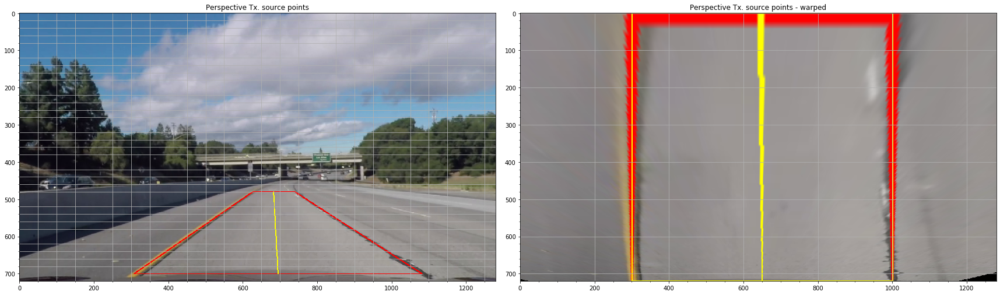

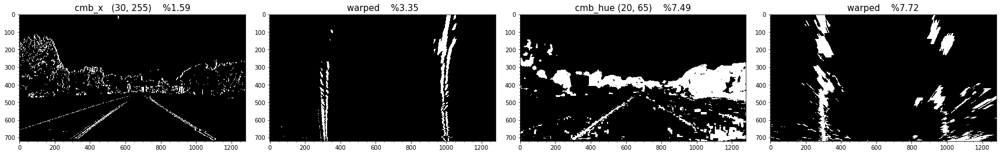

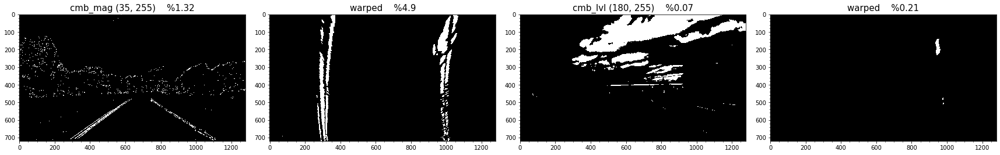

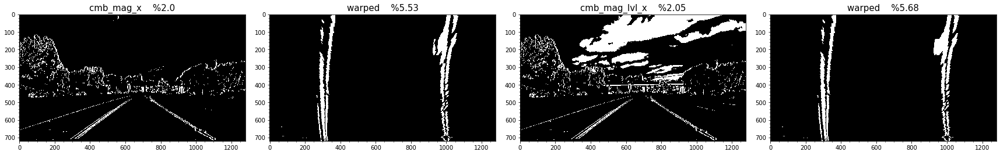

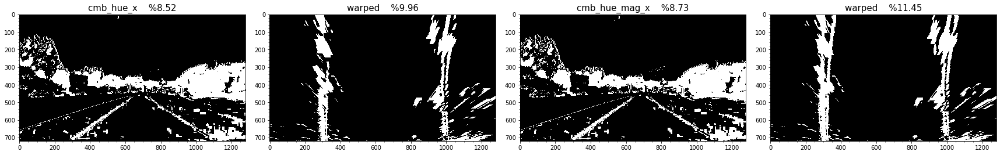

...

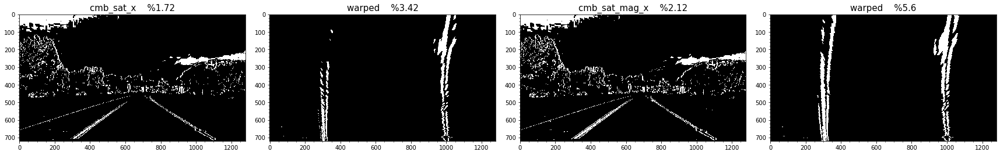

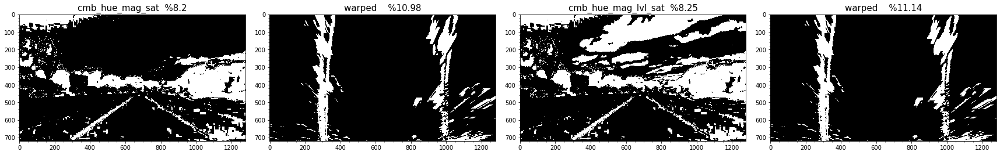

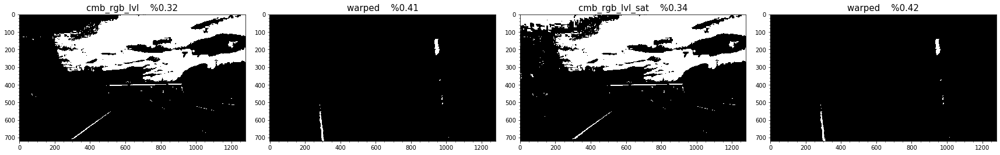

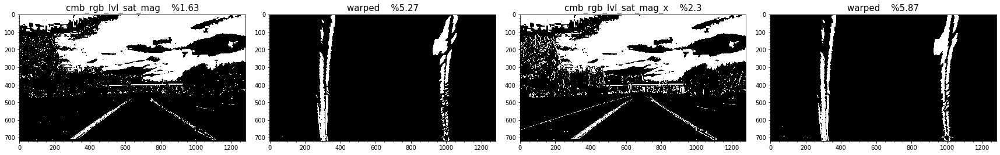

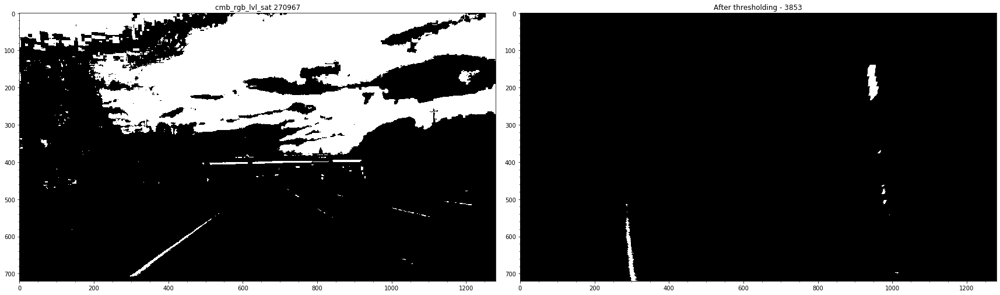

Search_around_poly()
--------------------
   Search margin       : 20     
   Histogram max   Left: 294     Right: 977
   Prev-1   X Base Left: 296     Right: 1001
   Previous X Base Left: 296     Right: 1001

   ttl pixels in image          :   921600    NZ pixels in image         :     3853   imgPixelRatio   : %    0.42
   ttl pixels in search region  :    57600    NZ pixels in search region :     1972   NztoSrchNzRatio : %    3.42
   ttl non-zero pixels in image :     3853    NZ pixels in search region :     1972   NztoImageNzRatio: %   51.17
   Detected Pixel Count    Left :     1729    Right:      243 
   Detected Pixel Ratio    Left :     6.00    Right:     0.84 
  NZ pixels  - in image  :     3853   search reg:     1972      Nz to imgPixel Ratio: % 0.42    Nz to SrchRegion Ratio : % 3.42    Nz to ImageNz Ratio: %51.17
  Detected Pixel Count L :     1729   R         :      243      Detected Pixel Ratio  L: % 6.00    R: % 0.84 

assess_lane_detections()
---------------------------

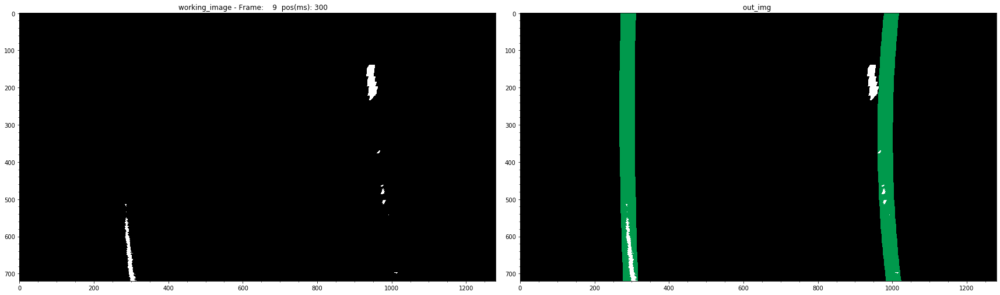

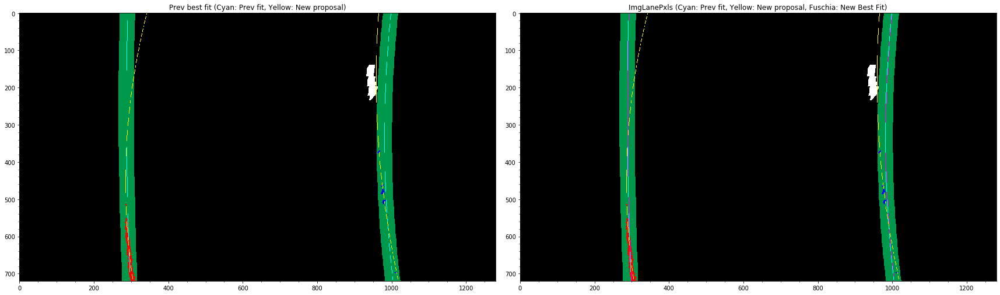



Display fitting info for  Frame:    9  pos(ms): 300    

Proposed Polynomial      left :  [    0.00    -0.02   290.43]    right : [    0.00    -0.10   997.81] 
Best Fit Polynomial      left :  [    0.00    -0.02   290.43]    right : [    0.00    -0.10   997.81] 
Diff(proposed,best_fit)  left :  [    0.00     0.00     0.00]    right : [    0.00     0.00     0.00] 
RSE(Proposed,best fit):  left :  51.147                            right : 33.727                         


Best Fit Polynomials:
----------------------------------------
left[-1]    : [    0.00    -0.02   290.43]    right[-1]     : [    0.00    -0.10   997.81] 
left[-2]    : [    0.00    -0.02   290.43]    right[-2]     : [    0.00    -0.10   997.81] 
left[-3]    : [    0.00    -0.02   290.43]    right[-3]     : [    0.00    -0.10   997.81] 
left[-4]    : [    0.00    -0.02   290.43]    right[-4]     : [    0.00    -0.10   997.81] 
left[-5]    : [    0.00    -0.02   290.43]    right[-5]     : [    0.00    -0.10   997.81] 


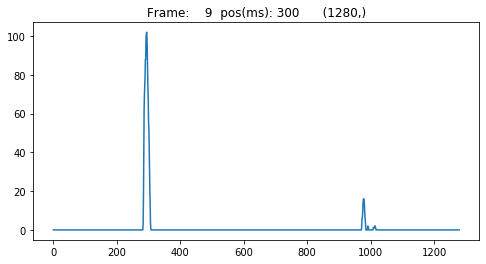

buildResultImage()
---------------
  Hist LLane :  [1150.73, 1833.91, 2646.54, 3998.03, 4062.03, 3751.27, 3751.27, 3751.27, 3751.27, 3751.27]
  Hist RLane :  [1059.09, 1088.96, 1142.18, 1099.46, 1079.54, 1076.0, 1076.0, 1076.0, 1076.0, 1076.0]
  Avg  LLane : [-5:] :     3751    [-10:] :     3245 
  Avg  RLane : [-5:] :     1076    [-10:] :     1085 
 Original disp_start :      510      end:      700 
       Min avg radius:     1076
 Modified disp start :      510      end:      700

adjust_RoI_window() - FirstFrame: False  AcceptPolynomial: False
-----------------------------------------------------------------
                 x_base :   Left:   296.00    Right:  1001.00  
     Image Pixel Ratios :   Left:     6.00    Right:     0.84    Total:     0.42
      off center pixels :   -9.00  History: [-34.0, -8.0, -8.0, -8.0, -9.0, -9.0, -9.0, -9.0, -9.0, -9.0] 
     diff(dyn_src, src) :    2.00  History: [17, 0, 1, 2, 2, 2, 2, 2, 2, 2] 
    Pixel ratio - Left  :    6.00  History: [38.34, 

<Figure size 1800x3024 with 0 Axes>

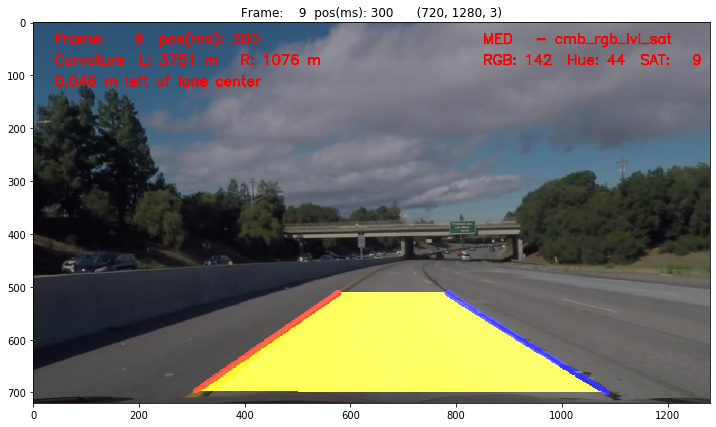

In [75]:
Pipeline.process_one_frame(read_next = True)

In [70]:
# Pipeline.ImageThresholds[1]['low']['lvl_thr'] = None
# Pipeline.ImageThresholds[1]['vlow']['x_thr'] = (45,255)
# print(Pipeline.ImageThresholds[1]['vlow']['x_thr'])
# print(Pipeline.ImageThresholds[1]['vlow']['mag_thr'] )
# print(Pipeline.ImageThresholds[1]['low']['lvl_thr'])
# Pipeline.ImageThresholds[1]['med']['rgb_thr']  = (180,255)
# Pipeline.ImageThresholds[1]['med']['sat_thr']  ##  = (180,255)
# Pipeline.thresholds_to_str()

Pipeline.thresholdMethods[1]['med'] = 'cmb_rgb_lvl_sat'
Pipeline.thresholdMethods[1]['med']
# Pipeline.thresholdMethods[1]['low']  = 'cmb_mag_x'
# itStr[1]['vlow']['y_thr']

'cmb_rgb_lvl_sat'

###  second frame

Frame:    7 - 233.57 ms - Image RGB: 124  (117,124,132)         WARPED RGB: 142  HLS:  66   H:  46   L: 143   S:   9    MED   - cmb_rgb_lvl_sat
 Thresholds:  HIGH RGB: 205    MED RGB: 170   LOW RGB: 120  VLOW RGB: 90   X-HIGH SAT: 120  HIGH SAT: 65   LOW SAT: 30 

   x_top_disp     : 60             x_src_center    : 670            x_bot_disp     : 375  
   x_src_top_left : (627, 480)     x_src_top_right : (740, 480)     x_src_bot_left : (308, 700)     x_src_bot_right : (1082, 700) 
   y_src_top_left : (300, 0)       y_src_top_right : (1000, 0)      y_src_bot_left : (300, 719)     y_src_bot_right : (1000, 719) 


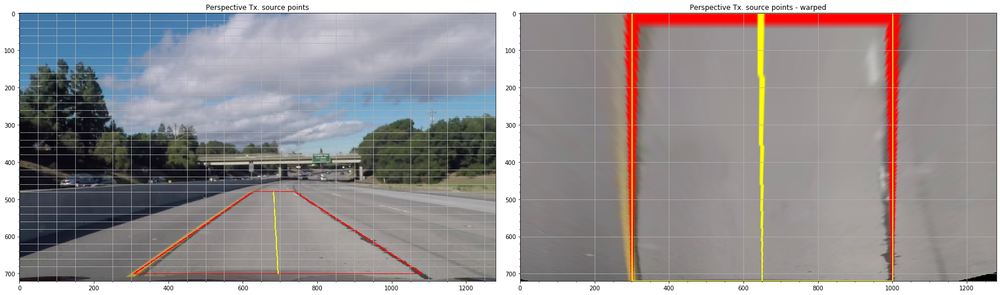

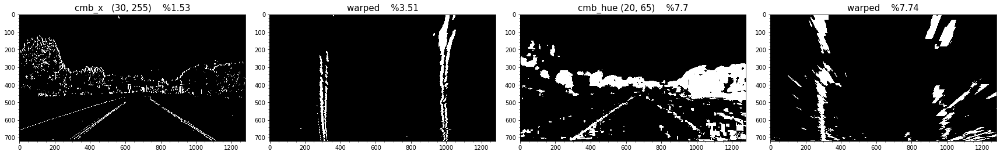

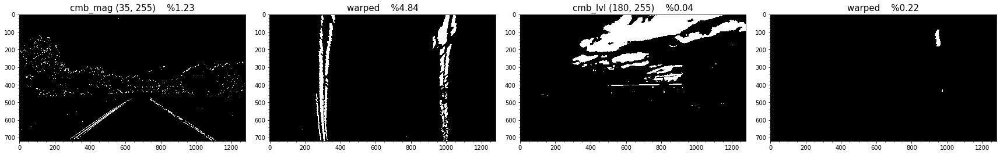

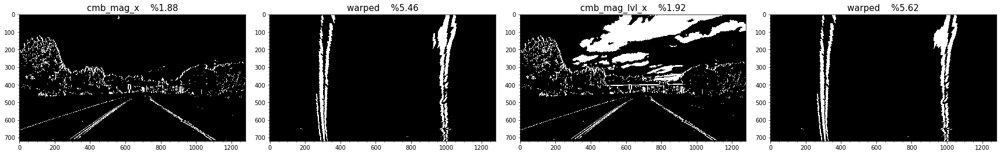

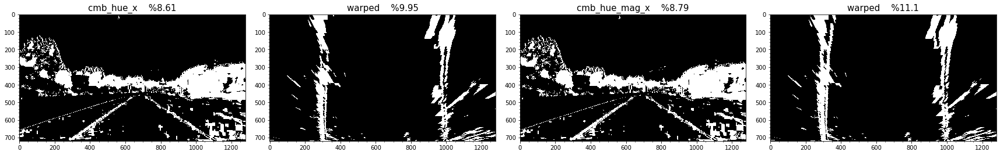

...

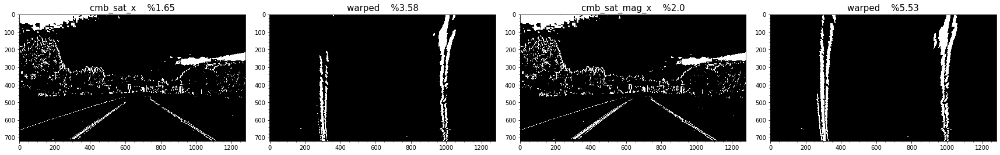

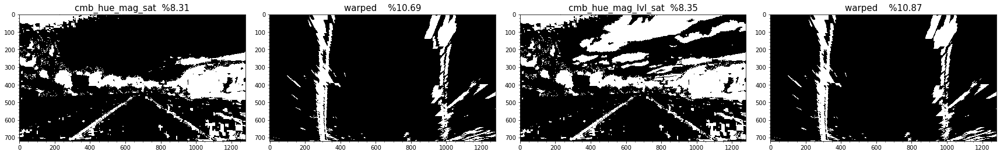

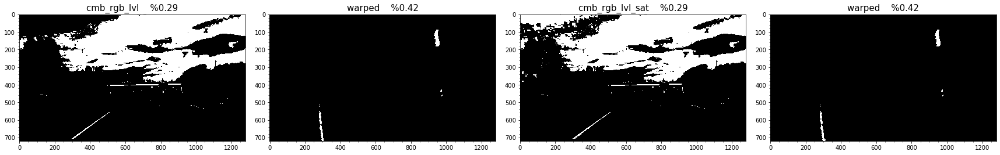

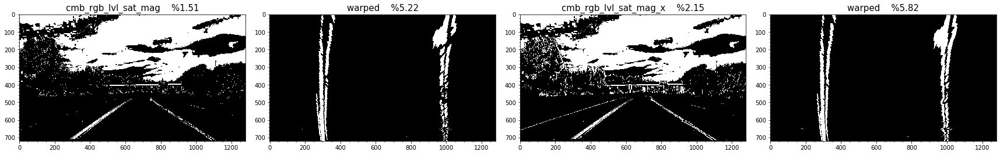

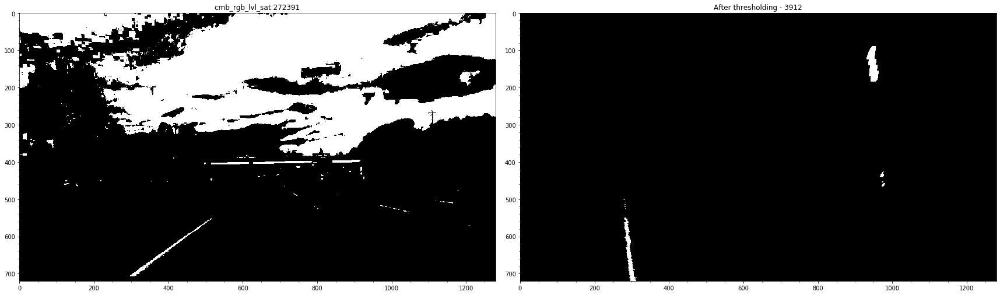

Search_around_poly()
--------------------
   Search margin       : 20     
   Histogram max   Left: 291     Right: 640
   Prev-1   X Base Left: 296     Right: 1001
   Previous X Base Left: 296     Right: 1001

   ttl pixels in image          :   921600    NZ pixels in image         :     3912   imgPixelRatio   : %    0.42
   ttl pixels in search region  :    57600    NZ pixels in search region :     1998   NztoSrchNzRatio : %    3.47
   ttl non-zero pixels in image :     3912    NZ pixels in search region :     1998   NztoImageNzRatio: %   51.06
   Detected Pixel Count    Left :     1841    Right:      157 
   Detected Pixel Ratio    Left :     6.39    Right:     0.55 
  NZ pixels  - in image  :     3912   search reg:     1998      Nz to imgPixel Ratio: % 0.42    Nz to SrchRegion Ratio : % 3.47    Nz to ImageNz Ratio: %51.06
  Detected Pixel Count L :     1841   R         :      157      Detected Pixel Ratio  L: % 6.39    R: % 0.55 

assess_lane_detections()
---------------------------

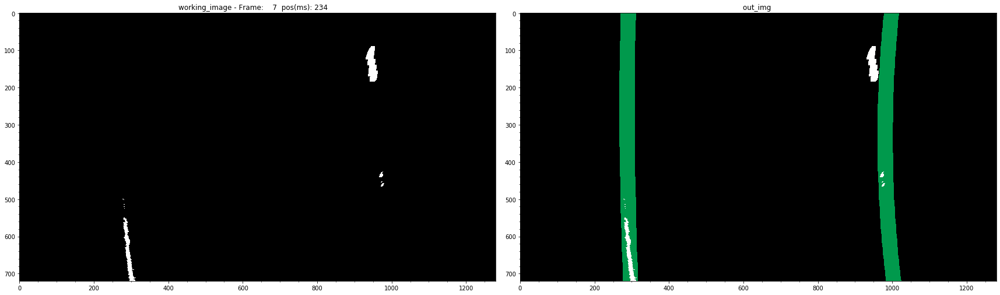

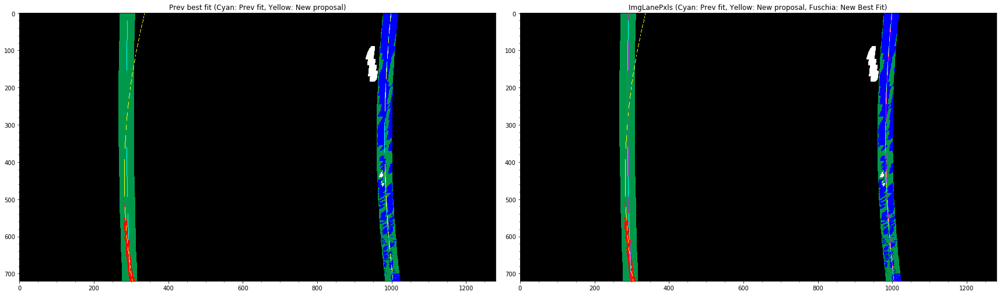



Display fitting info for  Frame:    7  pos(ms): 234    

Proposed Polynomial      left :  [    0.00    -0.02   290.43]    right : [    0.00    -0.10   997.81] 
Best Fit Polynomial      left :  [    0.00    -0.02   290.43]    right : [    0.00    -0.10   997.81] 
Diff(proposed,best_fit)  left :  [    0.00     0.00     0.00]    right : [    0.00     0.00     0.00] 
RSE(Proposed,best fit):  left :  45.434                            right : 0.000                          


Best Fit Polynomials:
----------------------------------------
left[-1]    : [    0.00    -0.02   290.43]    right[-1]     : [    0.00    -0.10   997.81] 
left[-2]    : [    0.00    -0.02   290.43]    right[-2]     : [    0.00    -0.10   997.81] 
left[-3]    : [    0.00    -0.02   290.43]    right[-3]     : [    0.00    -0.10   997.81] 
left[-4]    : [    0.00    -0.02   288.53]    right[-4]     : [    0.00    -0.10   998.28] 
left[-5]    : [    0.00    -0.02   288.36]    right[-5]     : [    0.00    -0.10   999.41] 


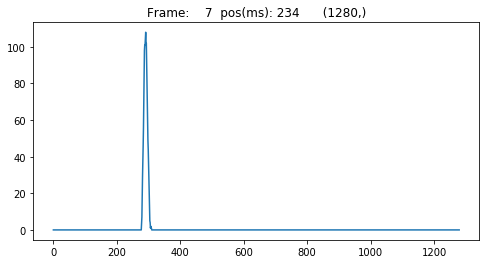

buildResultImage()
---------------
  Hist LLane :  [1150.73, 1833.91, 2646.54, 3998.03, 4062.03, 3751.27, 3751.27, 3751.27]
  Hist RLane :  [1059.09, 1088.96, 1142.18, 1099.46, 1079.54, 1076.0, 1076.0, 1076.0]
  Avg  LLane : [-5:] :     3863    [-10:] :     3118 
  Avg  RLane : [-5:] :     1081    [-10:] :     1087 
 Original disp_start :      510      end:      700 
       Min avg radius:     1081
 Modified disp start :      510      end:      700

adjust_RoI_window() - FirstFrame: False  AcceptPolynomial: False
-----------------------------------------------------------------
                 x_base :   Left:   296.00    Right:  1001.00  
     Image Pixel Ratios :   Left:     6.39    Right:     0.55    Total:     0.42
      off center pixels :   -9.00  History: [-34.0, -8.0, -8.0, -8.0, -9.0, -9.0, -9.0, -9.0] 
     diff(dyn_src, src) :    2.00  History: [17, 0, 1, 2, 2, 2, 2, 2] 
    Pixel ratio - Left  :    6.39  History: [38.34, 41.01, 57.06, 59.32, 59.42, 58.66, 7.12, 6.39] 
    

<Figure size 1800x3024 with 0 Axes>

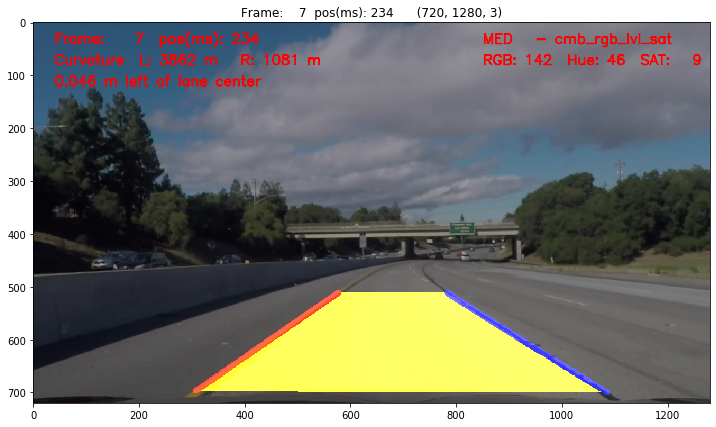

In [72]:
Pipeline.process_one_frame(read_next = True)

In [67]:
Pipeline.ImageThresholds[1]['med']['rgb_thr']  = (180,255)
Pipeline.ImageThresholds[1]['med']['lvl_thr']  = (180,255)

Pipeline.ImageThresholds[1]['med']['sat_thr']  ##  = (180,255)
Pipeline.thresholds_to_str()
print(Pipeline.ImageThresholds[1]['med']['rgb_thr'], Pipeline.ImageThresholds[1]['med']['lvl_thr'],Pipeline.ImageThresholds[1]['med']['sat_thr'])

1  cond:  xhigh
      thr :  ksize     7
      thr :  x_thr     (60, 255)
      thr :  y_thr     None
      thr :  mag_thr     (60, 255)
      thr :  dir_thr     (40, 65)
      thr :  sat_thr     None
      thr :  lvl_thr     (252, 255)
      thr :  rgb_thr     None
      thr :  hue_thr     (25, 50)
1  cond:  high
      thr :  ksize     7
      thr :  x_thr     (60, 255)
      thr :  y_thr     None
      thr :  mag_thr     (60, 255)
      thr :  dir_thr     (40, 65)
      thr :  sat_thr     None
      thr :  lvl_thr     (252, 255)
      thr :  rgb_thr     None
      thr :  hue_thr     (25, 65)
1  cond:  med
      thr :  ksize     7
      thr :  x_thr     (30, 255)
      thr :  y_thr     (70, 255)
      thr :  mag_thr     (35, 255)
      thr :  dir_thr     (40, 65)
      thr :  sat_thr     (110, 255)
      thr :  lvl_thr     (180, 255)
      thr :  rgb_thr     (180, 255)
      thr :  hue_thr     (20, 65)
1  cond:  low
      thr :  ksize     7
      thr :  x_thr     (65, 255)
      thr :

### third frame

Frame:    8 - 266.93 ms - Image RGB: 124  (117,124,132)         WARPED RGB: 142  HLS:  66   H:  47   L: 142   S:   9    MED   - cmb_rgb_lvl_sat
 Thresholds:  HIGH RGB: 205    MED RGB: 170   LOW RGB: 120  VLOW RGB: 90   X-HIGH SAT: 120  HIGH SAT: 65   LOW SAT: 30 

   x_top_disp     : 60             x_src_center    : 670            x_bot_disp     : 375  
   x_src_top_left : (627, 480)     x_src_top_right : (740, 480)     x_src_bot_left : (308, 700)     x_src_bot_right : (1082, 700) 
   y_src_top_left : (300, 0)       y_src_top_right : (1000, 0)      y_src_bot_left : (300, 719)     y_src_bot_right : (1000, 719) 


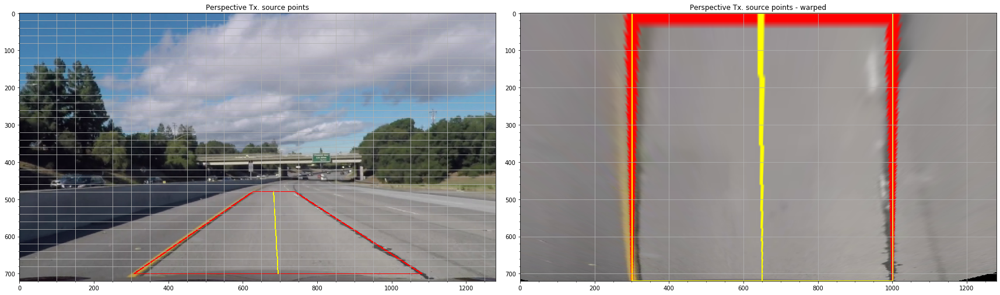

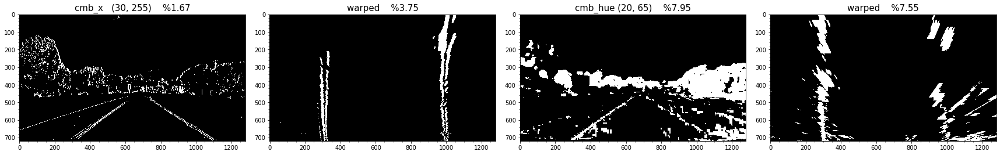

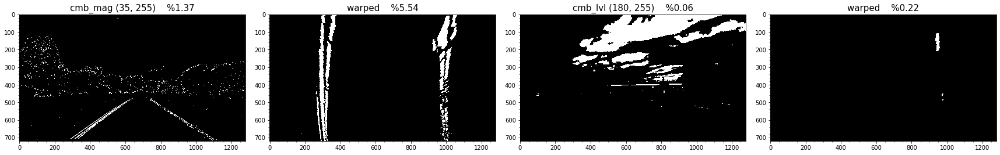

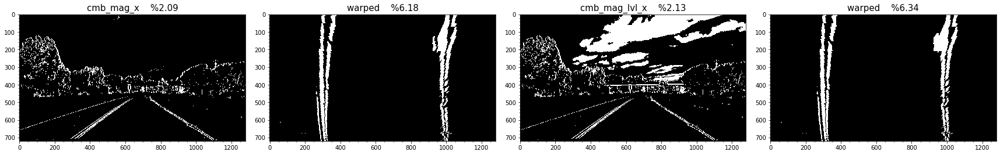

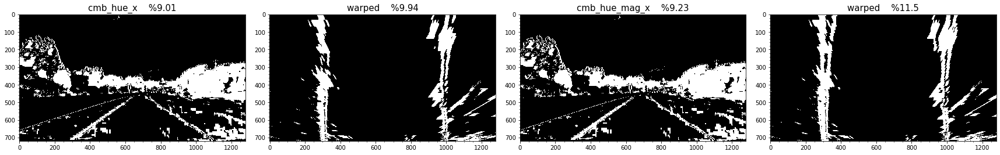

...

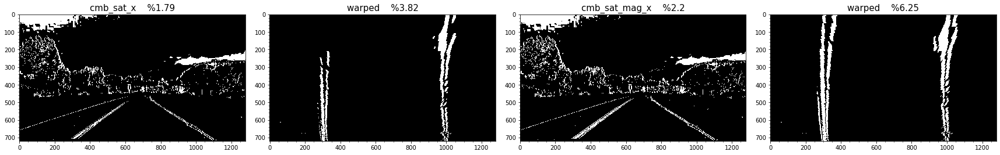

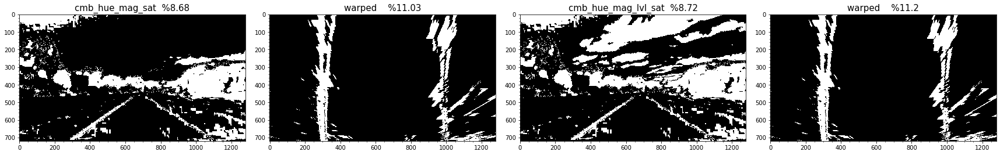

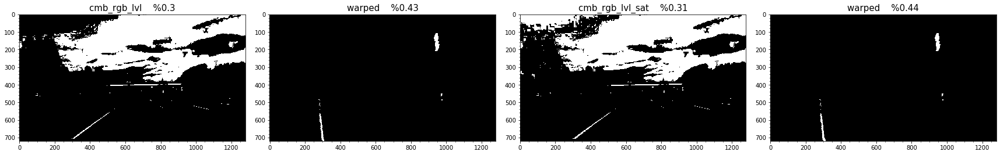

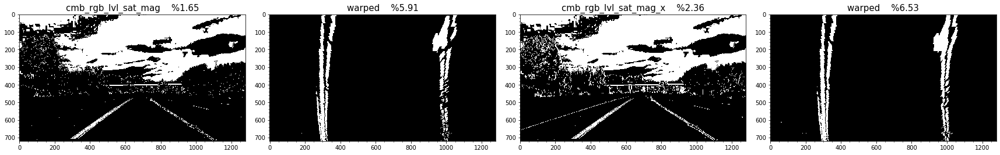

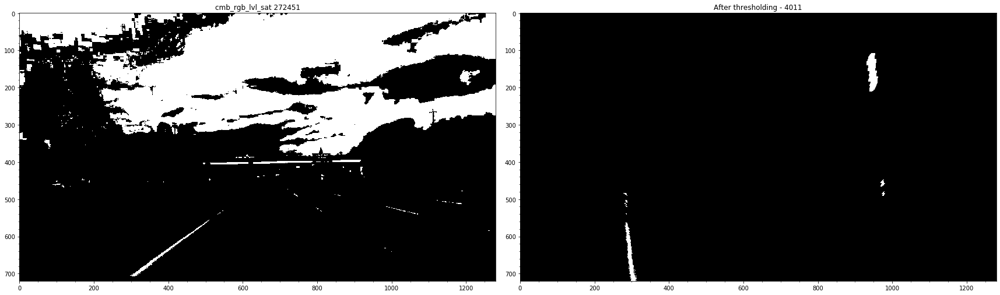

Search_around_poly()
--------------------
   Search margin       : 20     
   Histogram max   Left: 293     Right: 975
   Prev-1   X Base Left: 296     Right: 1001
   Previous X Base Left: 296     Right: 1001

   ttl pixels in image          :   921600    NZ pixels in image         :     4011   imgPixelRatio   : %    0.44
   ttl pixels in search region  :    57600    NZ pixels in search region :     1956   NztoSrchNzRatio : %    3.40
   ttl non-zero pixels in image :     4011    NZ pixels in search region :     1956   NztoImageNzRatio: %   48.75
   Detected Pixel Count    Left :     1777    Right:      179 
   Detected Pixel Ratio    Left :     6.17    Right:     0.62 
  NZ pixels  - in image  :     4011   search reg:     1956      Nz to imgPixel Ratio: % 0.44    Nz to SrchRegion Ratio : % 3.40    Nz to ImageNz Ratio: %48.75
  Detected Pixel Count L :     1777   R         :      179      Detected Pixel Ratio  L: % 6.17    R: % 0.62 

assess_lane_detections()
---------------------------

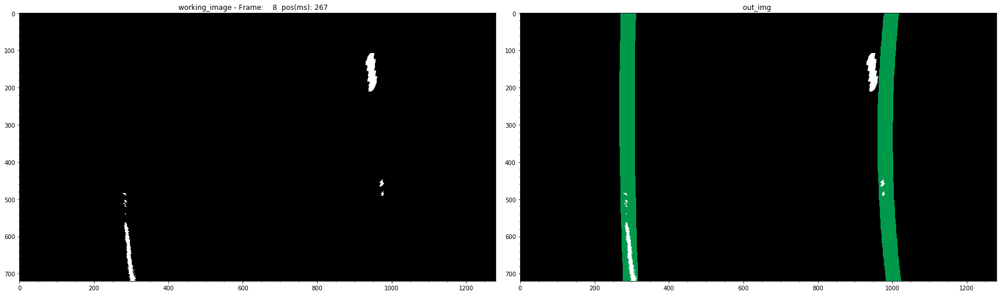

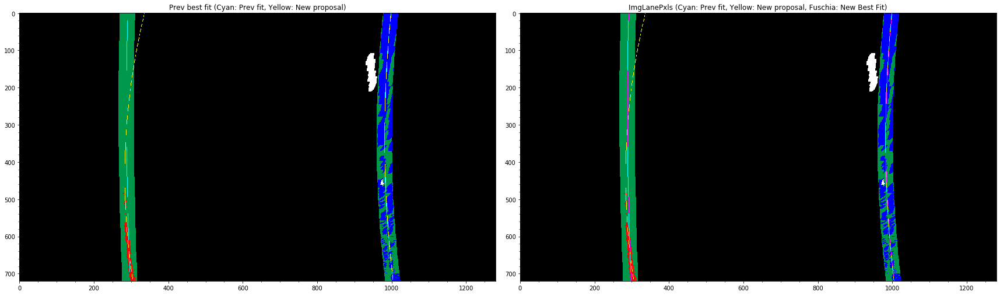



Display fitting info for  Frame:    8  pos(ms): 267    

Proposed Polynomial      left :  [    0.00    -0.02   290.43]    right : [    0.00    -0.10   997.81] 
Best Fit Polynomial      left :  [    0.00    -0.02   290.43]    right : [    0.00    -0.10   997.81] 
Diff(proposed,best_fit)  left :  [    0.00     0.00     0.00]    right : [    0.00     0.00     0.00] 
RSE(Proposed,best fit):  left :  44.663                            right : 0.000                          


Best Fit Polynomials:
----------------------------------------
left[-1]    : [    0.00    -0.02   290.43]    right[-1]     : [    0.00    -0.10   997.81] 
left[-2]    : [    0.00    -0.02   290.43]    right[-2]     : [    0.00    -0.10   997.81] 
left[-3]    : [    0.00    -0.02   290.43]    right[-3]     : [    0.00    -0.10   997.81] 
left[-4]    : [    0.00    -0.02   290.43]    right[-4]     : [    0.00    -0.10   997.81] 
left[-5]    : [    0.00    -0.02   288.53]    right[-5]     : [    0.00    -0.10   998.28] 


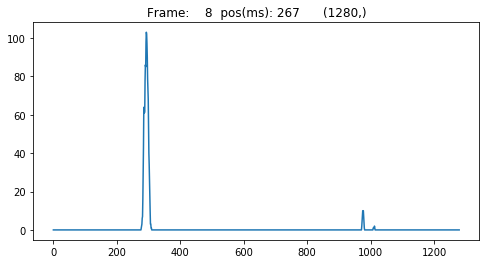

buildResultImage()
---------------
  Hist LLane :  [1150.73, 1833.91, 2646.54, 3998.03, 4062.03, 3751.27, 3751.27, 3751.27, 3751.27]
  Hist RLane :  [1059.09, 1088.96, 1142.18, 1099.46, 1079.54, 1076.0, 1076.0, 1076.0, 1076.0]
  Avg  LLane : [-5:] :     3813    [-10:] :     3188 
  Avg  RLane : [-5:] :     1077    [-10:] :     1086 
 Original disp_start :      510      end:      700 
       Min avg radius:     1077
 Modified disp start :      510      end:      700

adjust_RoI_window() - FirstFrame: False  AcceptPolynomial: False
-----------------------------------------------------------------
                 x_base :   Left:   296.00    Right:  1001.00  
     Image Pixel Ratios :   Left:     6.17    Right:     0.62    Total:     0.44
      off center pixels :   -9.00  History: [-34.0, -8.0, -8.0, -8.0, -9.0, -9.0, -9.0, -9.0, -9.0] 
     diff(dyn_src, src) :    2.00  History: [17, 0, 1, 2, 2, 2, 2, 2, 2] 
    Pixel ratio - Left  :    6.17  History: [38.34, 41.01, 57.06, 59.32, 59.42

<Figure size 1800x3024 with 0 Axes>

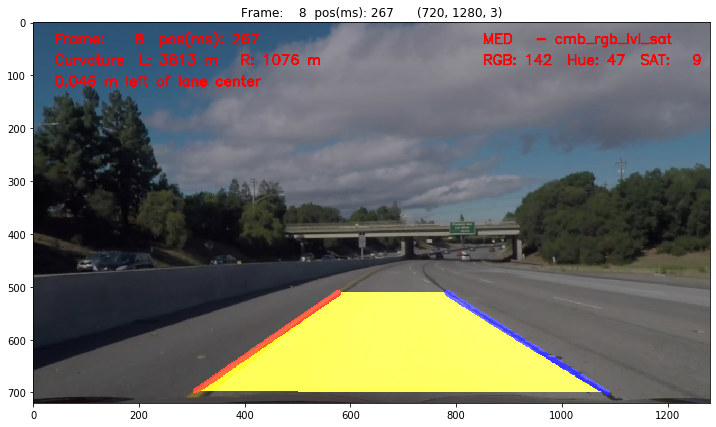

In [73]:
Pipeline.process_one_frame(read_next = True)

In [ ]:
Pipeline.outVideo.closeVideoFile()

In [74]:
# Pipeline.LANE_COUNT_THRESHOLD = 1000
# Pipeline.LANE_RATIO_THRESHOLD = 2.0 
# Pipeline.LANE_RATIO_LOW_THRESHOLD 

# Pipeline.LANE_RATIO_HIGH_THRESHOLD = 95

# Pipeline.IMAGE_RATIO_LOW_THRESHOLD =1.0
# a = np.copy(Pipeline.LeftLane.best_fit)
# Pipeline.RightLane.best_fit = np.concatenate(([0.0], a))
# Pipeline.working_image.shape
# Pipeline.POLY_SRCH_MRGN 
# Pipeline.LANE_COUNT_THRESHOLD = 2700
Pipeline.POLY_SEARCH_MARGIN = 30
# Pipeline.display_thresholds()
# Pipeline.ImageThresholds[1]['high']['hue_thr'] = (25,65)
# print(Pipeline.ImageThresholds[1]['high']['lvl_thr'] , Pipeline.itStr[1]['high']['lvl_thr'])
# Pipeline.thresholds_to_str()
# Pipeline.imgCondHistory.count(-20)
# Pipeline.acceptHistory[-5:]
# Pipeline.SrcAdjustment_history[-2:]
# Pipeline.itStr[1]

# Pipeline.LANE_RATIO_LOW_THRESHOLD = 8.0

### Misc 

In [ ]:
# rc1= Pipeline.inVideo.getNextFrame()  
# if rc1:
#     outputImage, disp = Pipeline(displayResults = True, debug = True, debug2 = False)
#     Pipeline.outVideo.saveFrameToVideo(outputImage, debug = False)        
#     display_one(outputImage, size=(15,7), title = Pipeline.frameTitle)
#     winsound.MessageBeep(type=winsound.MB_ICONHAND)

In [ ]:
# print(max(Pipeline.LeftLane.RMSE_history), min(Pipeline.LeftLane.RMSE_history))
# print(max(Pipeline.RightLane.RMSE_history), min(Pipeline.RightLane.RMSE_history))
# Pipeline.RightLane.avg_pixelRatio = 0
# Pipeline.IMAGE_RATIO_HIGH_THRESHOLD = 30

In [ ]:
#### 

# Pipeline.POLY_SRCH_MRGN = 40
# Pipeline.PARALLEL_LINES_MARGIN =50
# for i in range(-1,-6,-1):
#     print(Pipeline.RightLane.best_fit_history[i])

# Pipeline.debugInfo_DetectionInfo()
# Pipeline.RED_DETECTION_LIMIT = 50
# print(Pipeline.acceptHistory[-10:])
print(Pipeline.imgCondHistory[-10:])
# print(Pipeline.slidingWindowBootstrap)
# Pipeline.acceptHistory[-1] = -20
# Pipeline.slidingWindowBootstrap  = True
print(Pipeline.imgCondHistory.count(-20))


In [ ]:
binary_warped = np.copy(Pipeline.working_image)
img_height = binary_warped.shape[0]
img_width  = binary_warped.shape[1]
histWidthRange  = Pipeline.HISTOGRAM_WIDTH_RANGE
histDepthRange  = Pipeline.HISTOGRAM_DEPTH_RANGE
histLeft  = max(img_width//2 - histWidthRange, 0)  
histRight = min(img_width//2 + histWidthRange, img_width)  
# histTop   = min(histDepthRange, img_height)
histTop   = 0
histBot   = Pipeline.y_src_bot 
print( ' Width range: ', histWidthRange, '   Depth range:', histDepthRange)
print( ' histLeft   : ', histLeft      , '   histRight  :', histRight)
print( ' histTop    : ', histTop       , '   histBot    :', histBot)

histogram = np.sum(binary_warped[histTop : histBot, histLeft : histRight], axis=0)
histogram = np.pad(histogram, (histLeft, binary_warped.shape[1]-histRight))
avg = histogram.mean()
print(' historgram avg: ', avg)
midpoint  = np.int(histogram.shape[0]//2)
win_xleft_center  =  np.argmax(histogram[:midpoint]) 
win_xright_center =  np.argmax(histogram[midpoint:]) + midpoint
ttl = ' Search window center X - Left: {:6d}    Right: {:6d}'.format(win_xleft_center  , win_xright_center)

display_one(binary_warped, cmap = 'gray')
display_one(histogram, title = ttl)    
print(ttl)

##  B - Process RANGE of video frames 

From :  0.0  To: 120
Frame:    0 - 0.0 ms - Image RGB: 125  (117,124,133)         WARPED RGB: 141  HLS:  62   H:  37   L: 142   S:   9    MED   - cmb_rgb_lvl_sat
 reset_x_base  True
  NZ pixels  - in image  :     5358   search reg:     5355      Nz to imgPixel Ratio: % 0.58    Nz to SrchRegion Ratio : % 4.65    Nz to ImageNz Ratio: %99.93
  Detected Pixel Count L :     3287   R         :     2068      Detected Pixel Ratio  L: % 5.71    R: % 3.59 
  Perspective transform source points -  OffCtr Pxls: -42.0    max_diffs: 13    imgPxlRatio: 0.58  acceptCode: 0
  Adjust perspective transform source points -  OffCtr Pxls: -42.0    max_diffs: 13    imgPxlRatio: 0.58 


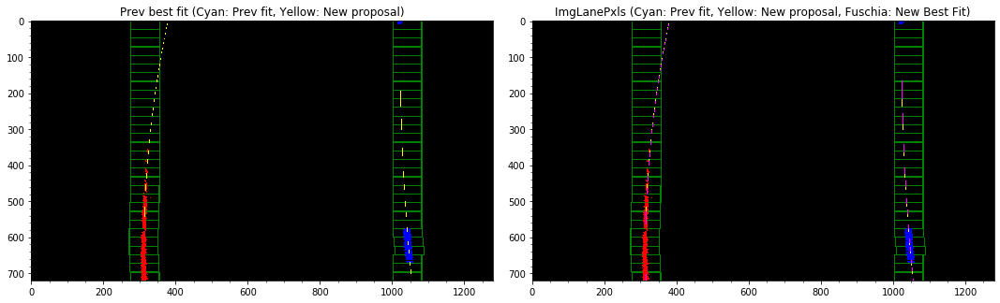

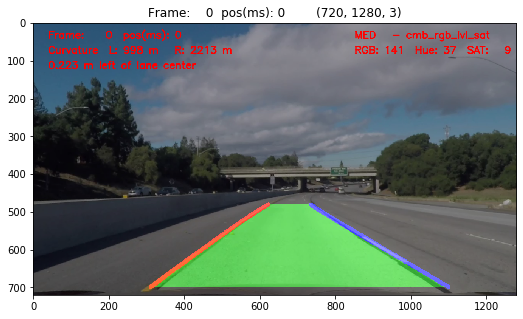

Frame:    1 - 33.37 ms - Image RGB: 125  (117,124,133)         WARPED RGB: 142  HLS:  64   H:  40   L: 142   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     5578   search reg:     5574      Nz to imgPixel Ratio: % 0.61    Nz to SrchRegion Ratio : % 4.84    Nz to ImageNz Ratio: %99.91
  Detected Pixel Count L :     2871   R         :     2703      Detected Pixel Ratio  L: % 4.98    R: % 4.69 
  Perspective transform source points -  OffCtr Pxls: -9.0    max_diffs: 2    imgPxlRatio: 0.61  acceptCode: 0
Frame:    2 - 66.73 ms - Image RGB: 125  (117,124,133)         WARPED RGB: 142  HLS:  64   H:  41   L: 142   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     6004   search reg:     5985      Nz to imgPixel Ratio: % 0.65    Nz to SrchRegion Ratio : % 5.20    Nz to ImageNz Ratio: %99.67
  Detected Pixel Count L :     2806   R         :     3179      Detected Pixel Ratio  L: % 4.87    R: % 5.52 
  Perspective transform source points -  OffCtr Pxls: -9.0    max

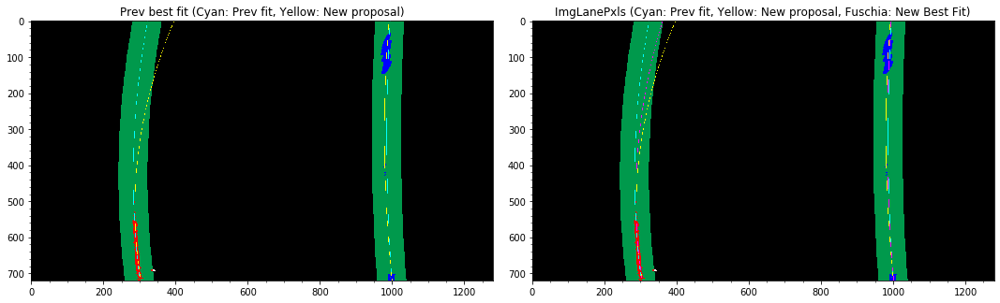

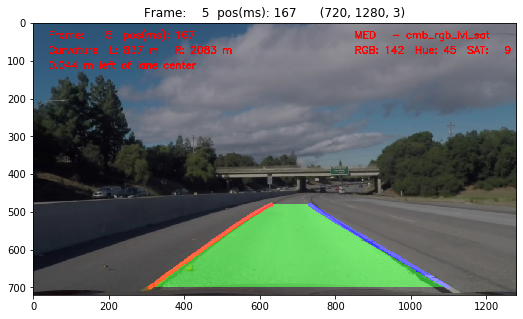

Frame:    6 - 200.2 ms - Image RGB: 124  (117,124,132)         WARPED RGB: 142  HLS:  67   H:  49   L: 142   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     4118   search reg:     4079      Nz to imgPixel Ratio: % 0.45    Nz to SrchRegion Ratio : % 3.54    Nz to ImageNz Ratio: %99.03
  Detected Pixel Count L :     1978   R         :     2101      Detected Pixel Ratio  L: % 3.43    R: % 3.65 
  Perspective transform source points -  OffCtr Pxls: -10.0    max_diffs: 22    imgPxlRatio: 0.45  acceptCode: 0
Frame:    7 - 233.57 ms - Image RGB: 124  (117,124,132)         WARPED RGB: 142  HLS:  66   H:  48   L: 142   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     3891   search reg:     3891      Nz to imgPixel Ratio: % 0.42    Nz to SrchRegion Ratio : % 3.38    Nz to ImageNz Ratio: %99.97
  Detected Pixel Count L :     1732   R         :     2159      Detected Pixel Ratio  L: % 3.01    R: % 3.75 
  Perspective transform source points -  OffCtr Pxls: -6.0    

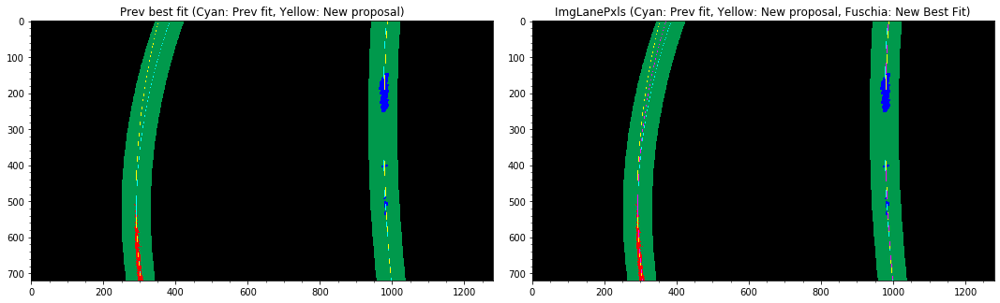

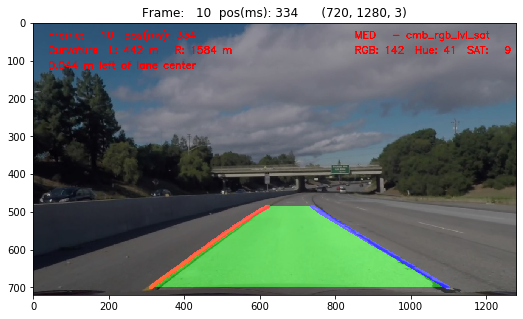

Frame:   11 - 367.03 ms - Image RGB: 124  (117,123,131)         WARPED RGB: 142  HLS:  64   H:  41   L: 142   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     4568   search reg:     4568      Nz to imgPixel Ratio: % 0.50    Nz to SrchRegion Ratio : % 3.97    Nz to ImageNz Ratio: %99.98
  Detected Pixel Count L :     1752   R         :     2816      Detected Pixel Ratio  L: % 3.04    R: % 4.89 
  Perspective transform source points -  OffCtr Pxls: -9.0    max_diffs: 8    imgPxlRatio: 0.5  acceptCode: 0
Frame:   12 - 400.4 ms - Image RGB: 124  (117,123,131)         WARPED RGB: 142  HLS:  66   H:  47   L: 142   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     4548   search reg:     4537      Nz to imgPixel Ratio: % 0.49    Nz to SrchRegion Ratio : % 3.94    Nz to ImageNz Ratio: %99.74
  Detected Pixel Count L :     1596   R         :     2941      Detected Pixel Ratio  L: % 2.77    R: % 5.11 
  Perspective transform source points -  OffCtr Pxls: -8.0    max

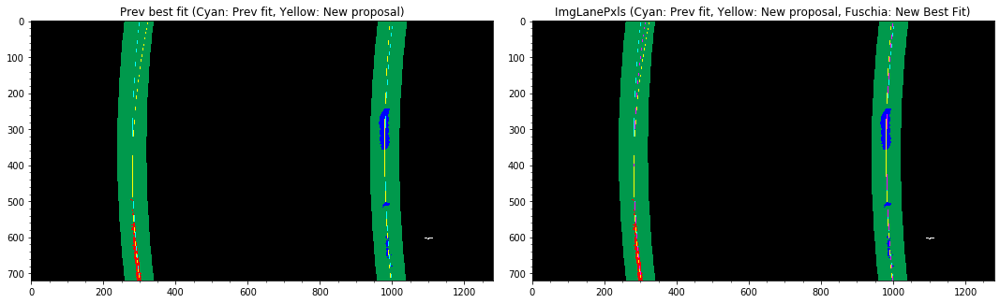

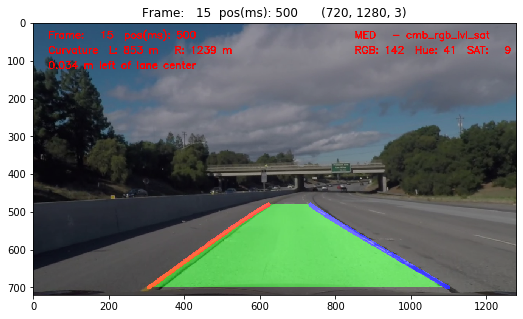

Frame:   16 - 533.87 ms - Image RGB: 124  (117,123,131)         WARPED RGB: 142  HLS:  63   H:  39   L: 142   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     4757   search reg:     4680      Nz to imgPixel Ratio: % 0.52    Nz to SrchRegion Ratio : % 4.06    Nz to ImageNz Ratio: %98.36
  Detected Pixel Count L :     1612   R         :     3068      Detected Pixel Ratio  L: % 2.80    R: % 5.33 
  Perspective transform source points -  OffCtr Pxls: -5.0    max_diffs: 4    imgPxlRatio: 0.52  acceptCode: 0
Frame:   17 - 567.23 ms - Image RGB: 124  (117,123,131)         WARPED RGB: 142  HLS:  61   H:  33   L: 142   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     5195   search reg:     5124      Nz to imgPixel Ratio: % 0.56    Nz to SrchRegion Ratio : % 4.45    Nz to ImageNz Ratio: %98.61
  Detected Pixel Count L :     1561   R         :     3563      Detected Pixel Ratio  L: % 2.71    R: % 6.19 
  Perspective transform source points -  OffCtr Pxls: -4.0    m

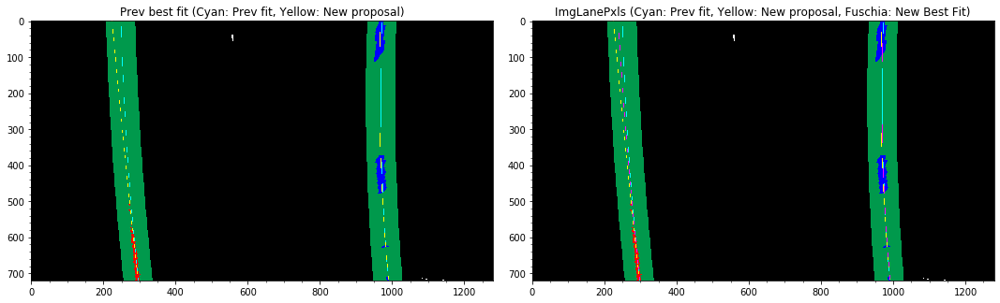

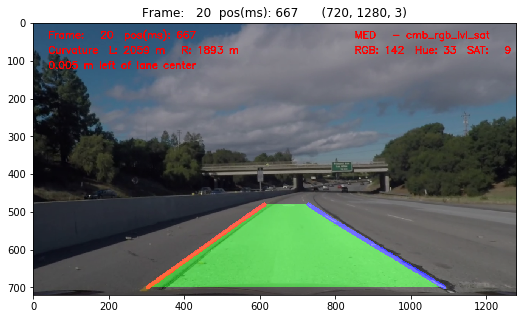

Frame:   21 - 700.7 ms - Image RGB: 124  (117,124,131)         WARPED RGB: 142  HLS:  62   H:  34   L: 142   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     6385   search reg:     6004      Nz to imgPixel Ratio: % 0.69    Nz to SrchRegion Ratio : % 5.21    Nz to ImageNz Ratio: %94.02
  Detected Pixel Count L :     1417   R         :     4587      Detected Pixel Ratio  L: % 2.46    R: % 7.96 
  Perspective transform source points -  OffCtr Pxls: -1.0    max_diffs: 10    imgPxlRatio: 0.69  acceptCode: 0
Frame:   22 - 734.07 ms - Image RGB: 124  (117,124,131)         WARPED RGB: 142  HLS:  62   H:  36   L: 142   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     7462   search reg:     6611      Nz to imgPixel Ratio: % 0.81    Nz to SrchRegion Ratio : % 5.74    Nz to ImageNz Ratio: %88.58
  Detected Pixel Count L :     1694   R         :     4917      Detected Pixel Ratio  L: % 2.94    R: % 8.54 
  Perspective transform source points -  OffCtr Pxls: -0.0    m

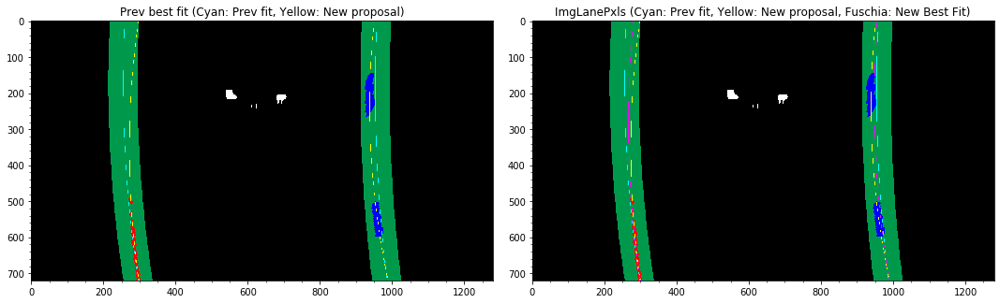

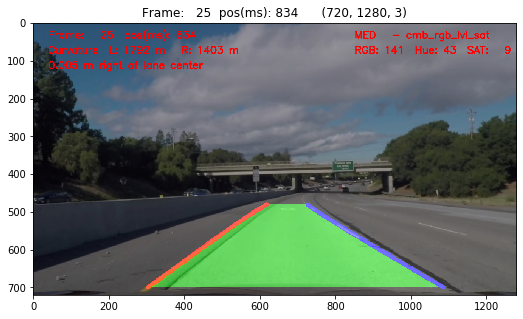

Frame:   26 - 867.53 ms - Image RGB: 124  (118,124,132)         WARPED RGB: 141  HLS:  63   H:  39   L: 141   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     7988   search reg:     6213      Nz to imgPixel Ratio: % 0.87    Nz to SrchRegion Ratio : % 5.39    Nz to ImageNz Ratio: %77.77
  Detected Pixel Count L :     2113   R         :     4100      Detected Pixel Ratio  L: % 3.67    R: % 7.12 
  Perspective transform source points -  OffCtr Pxls: 2.0    max_diffs: 8    imgPxlRatio: 0.87  acceptCode: 0
Frame:   27 - 900.9 ms - Image RGB: 124  (118,124,132)         WARPED RGB: 141  HLS:  63   H:  39   L: 141   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     7795   search reg:     6046      Nz to imgPixel Ratio: % 0.85    Nz to SrchRegion Ratio : % 5.25    Nz to ImageNz Ratio: %77.55
  Detected Pixel Count L :     1956   R         :     4090      Detected Pixel Ratio  L: % 3.40    R: % 7.10 
  Perspective transform source points -  OffCtr Pxls: 3.0    max_

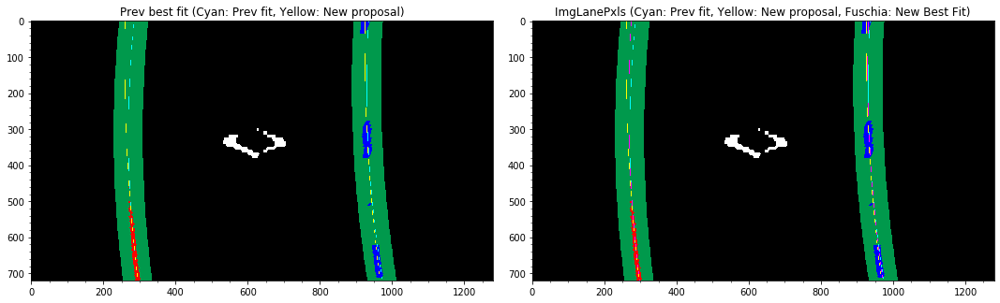

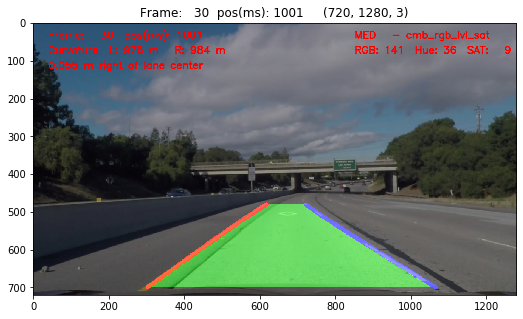

Frame:   31 - 1034.37 ms - Image RGB: 125  (118,125,132)         WARPED RGB: 141  HLS:  63   H:  40   L: 141   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :    10292   search reg:     6672      Nz to imgPixel Ratio: % 1.12    Nz to SrchRegion Ratio : % 5.79    Nz to ImageNz Ratio: %64.82
  Detected Pixel Count L :     1978   R         :     4694      Detected Pixel Ratio  L: % 3.43    R: % 8.15 
  Perspective transform source points -  OffCtr Pxls: 12.0    max_diffs: 12    imgPxlRatio: 1.12  acceptCode: 0
Frame:   32 - 1067.73 ms - Image RGB: 125  (118,124,132)         WARPED RGB: 141  HLS:  64   H:  42   L: 141   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :    10998   search reg:     6623      Nz to imgPixel Ratio: % 1.19    Nz to SrchRegion Ratio : % 5.75    Nz to ImageNz Ratio: %60.21
  Detected Pixel Count L :     1913   R         :     4710      Detected Pixel Ratio  L: % 3.32    R: % 8.18 
  Perspective transform source points -  OffCtr Pxls: 13.0  

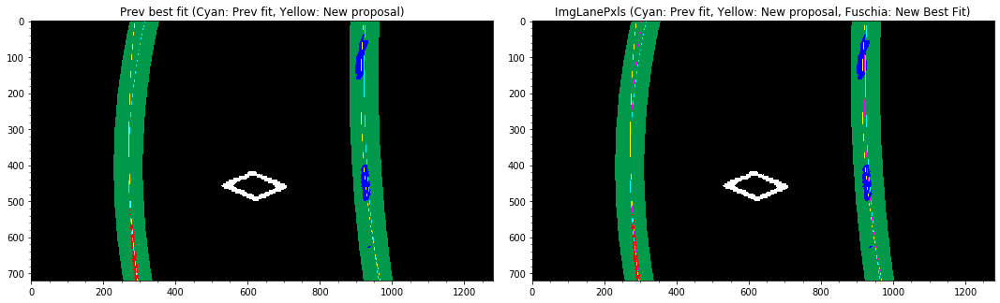

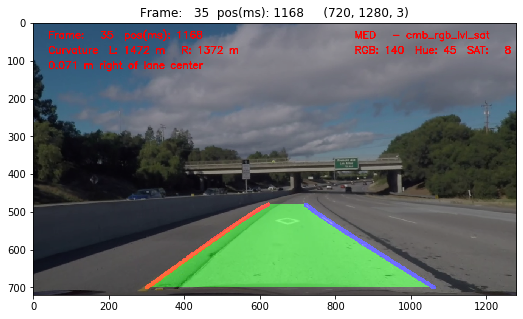

Frame:   36 - 1201.2 ms - Image RGB: 125  (118,124,133)         WARPED RGB: 140  HLS:  64   H:  45   L: 140   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :    10169   search reg:     5746      Nz to imgPixel Ratio: % 1.10    Nz to SrchRegion Ratio : % 4.99    Nz to ImageNz Ratio: %56.50
  Detected Pixel Count L :     1667   R         :     4079      Detected Pixel Ratio  L: % 2.89    R: % 7.08 
  Perspective transform source points -  OffCtr Pxls: 15.0    max_diffs: 13    imgPxlRatio: 1.1  acceptCode: 0
Frame:   37 - 1234.57 ms - Image RGB: 125  (118,124,133)         WARPED RGB: 139  HLS:  64   H:  44   L: 140   S:   8    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     9618   search reg:     5438      Nz to imgPixel Ratio: % 1.04    Nz to SrchRegion Ratio : % 4.72    Nz to ImageNz Ratio: %56.53
  Detected Pixel Count L :     1578   R         :     3860      Detected Pixel Ratio  L: % 2.74    R: % 6.70 
  Perspective transform source points -  OffCtr Pxls: 16.0    

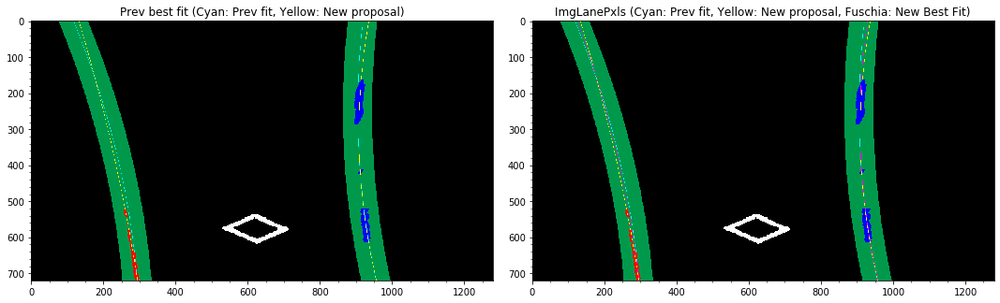

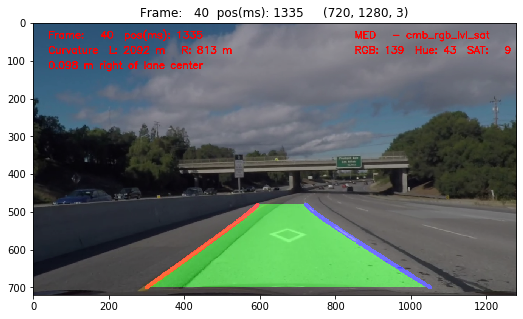

Frame:   41 - 1368.03 ms - Image RGB: 124  (117,124,132)         WARPED RGB: 139  HLS:  63   H:  42   L: 139   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :    10397   search reg:     6095      Nz to imgPixel Ratio: % 1.13    Nz to SrchRegion Ratio : % 5.29    Nz to ImageNz Ratio: %58.62
  Detected Pixel Count L :     1791   R         :     4304      Detected Pixel Ratio  L: % 3.11    R: % 7.47 
  Perspective transform source points -  OffCtr Pxls: 20.0    max_diffs: 20    imgPxlRatio: 1.13  acceptCode: 0
Frame:   42 - 1401.4 ms - Image RGB: 124  (117,124,132)         WARPED RGB: 138  HLS:  64   H:  43   L: 139   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :    10284   search reg:     6116      Nz to imgPixel Ratio: % 1.12    Nz to SrchRegion Ratio : % 5.31    Nz to ImageNz Ratio: %59.47
  Detected Pixel Count L :     1815   R         :     4301      Detected Pixel Ratio  L: % 3.15    R: % 7.47 
  Perspective transform source points -  OffCtr Pxls: 22.0   

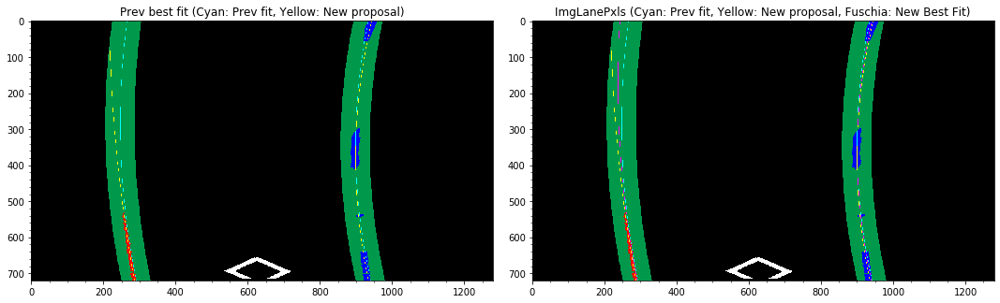

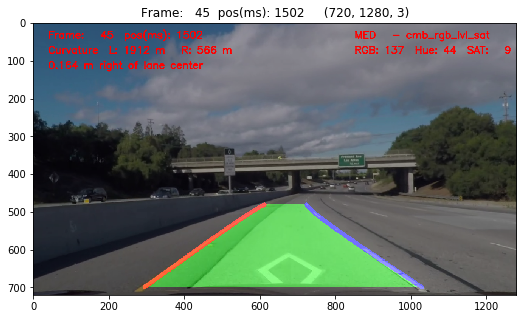

Frame:   46 - 1534.87 ms - Image RGB: 124  (117,123,132)         WARPED RGB: 137  HLS:  64   H:  46   L: 137   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     8001   search reg:     6253      Nz to imgPixel Ratio: % 0.87    Nz to SrchRegion Ratio : % 5.43    Nz to ImageNz Ratio: %78.14
  Detected Pixel Count L :     1539   R         :     4714      Detected Pixel Ratio  L: % 2.67    R: % 8.18 
  Perspective transform source points -  OffCtr Pxls: 34.0    max_diffs: 15    imgPxlRatio: 0.87  acceptCode: 0
Frame:   47 - 1568.23 ms - Image RGB: 124  (117,123,131)         WARPED RGB: 137  HLS:  65   H:  48   L: 137   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     6671   search reg:     6254      Nz to imgPixel Ratio: % 0.72    Nz to SrchRegion Ratio : % 5.43    Nz to ImageNz Ratio: %93.74
  Detected Pixel Count L :     1450   R         :     4804      Detected Pixel Ratio  L: % 2.52    R: % 8.34 
  Perspective transform source points -  OffCtr Pxls: 36.0  

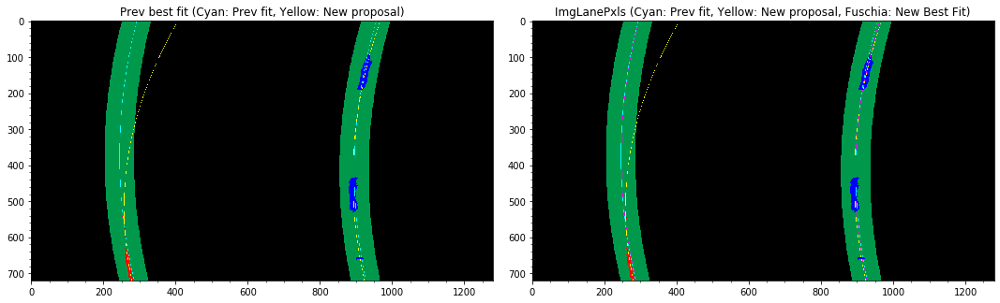

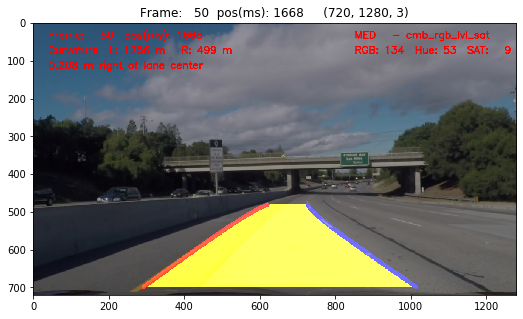

Frame:   51 - 1701.7 ms - Image RGB: 123  (116,122,130)         WARPED RGB: 133  HLS:  66   H:  54   L: 134   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     5036   search reg:     5036      Nz to imgPixel Ratio: % 0.55    Nz to SrchRegion Ratio : % 4.37    Nz to ImageNz Ratio: %99.98
  Detected Pixel Count L :      879   R         :     4157      Detected Pixel Ratio  L: % 1.53    R: % 7.22 
  Perspective transform source points -  OffCtr Pxls: 41.0    max_diffs: 6    imgPxlRatio: 0.55  acceptCode: -10
Frame:   52 - 1735.07 ms - Image RGB: 123  (116,122,130)         WARPED RGB: 133  HLS:  64   H:  49   L: 133   S:   9    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     4784   search reg:     4784      Nz to imgPixel Ratio: % 0.52    Nz to SrchRegion Ratio : % 4.15    Nz to ImageNz Ratio: %99.98
  Detected Pixel Count L :      858   R         :     3926      Detected Pixel Ratio  L: % 1.49    R: % 6.82 
  Perspective transform source points -  OffCtr Pxls: 42.0  

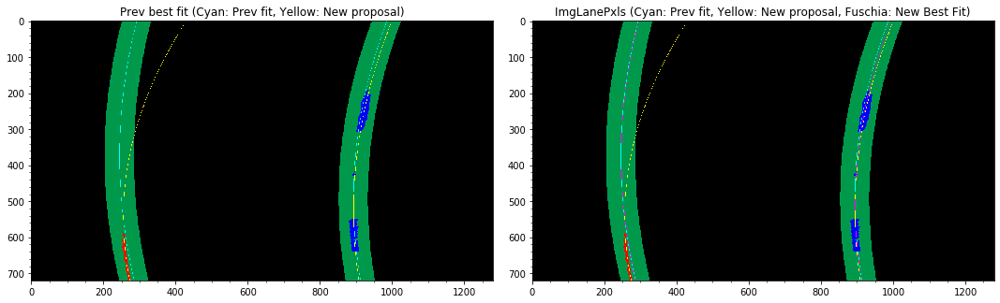

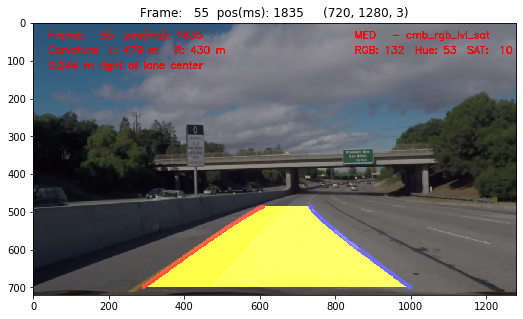

Frame:   56 - 1868.53 ms - Image RGB: 122  (115,121,129)         WARPED RGB: 131  HLS:  64   H:  52   L: 131   S:  10    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     4793   search reg:     4793      Nz to imgPixel Ratio: % 0.52    Nz to SrchRegion Ratio : % 4.16    Nz to ImageNz Ratio: %99.98
  Detected Pixel Count L :      837   R         :     3956      Detected Pixel Ratio  L: % 1.45    R: % 6.87 
  Perspective transform source points -  OffCtr Pxls: 48.0    max_diffs: 2    imgPxlRatio: 0.52  acceptCode: -10
Frame:   57 - 1901.9 ms - Image RGB: 122  (115,121,129)         WARPED RGB: 130  HLS:  65   H:  53   L: 130   S:  10    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     4520   search reg:     4520      Nz to imgPixel Ratio: % 0.49    Nz to SrchRegion Ratio : % 3.92    Nz to ImageNz Ratio: %99.98
  Detected Pixel Count L :      838   R         :     3682      Detected Pixel Ratio  L: % 1.45    R: % 6.39 
  Perspective transform source points -  OffCtr Pxls: 50.0  

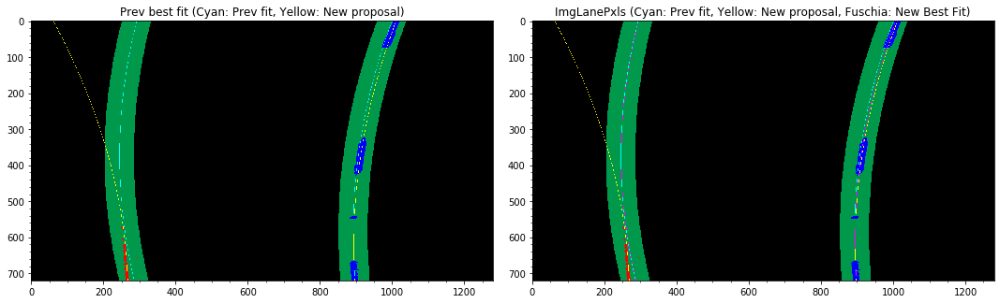

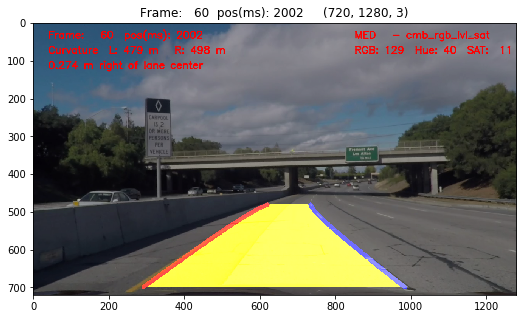

Frame:   61 - 2035.37 ms - Image RGB: 121  (115,121,128)         WARPED RGB: 129  HLS:  60   H:  40   L: 129   S:  11    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     5735   search reg:     5675      Nz to imgPixel Ratio: % 0.62    Nz to SrchRegion Ratio : % 4.93    Nz to ImageNz Ratio: %98.94
  Detected Pixel Count L :      686   R         :     4989      Detected Pixel Ratio  L: % 1.19    R: % 8.66 
  Perspective transform source points -  OffCtr Pxls: 52.0    max_diffs: 2    imgPxlRatio: 0.62  acceptCode: -10
Frame:   62 - 2068.73 ms - Image RGB: 121  (115,120,128)         WARPED RGB: 128  HLS:  61   H:  44   L: 129   S:  11    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     5474   search reg:     5474      Nz to imgPixel Ratio: % 0.59    Nz to SrchRegion Ratio : % 4.75    Nz to ImageNz Ratio: %99.98
  Detected Pixel Count L :      597   R         :     4877      Detected Pixel Ratio  L: % 1.04    R: % 8.47 
  Perspective transform source points -  OffCtr Pxls: 52.0 

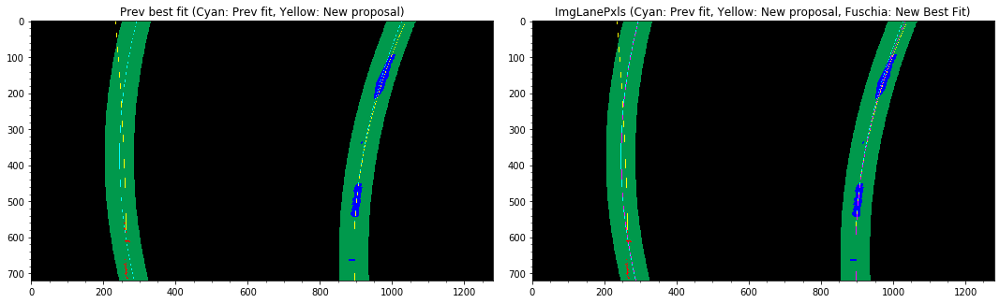

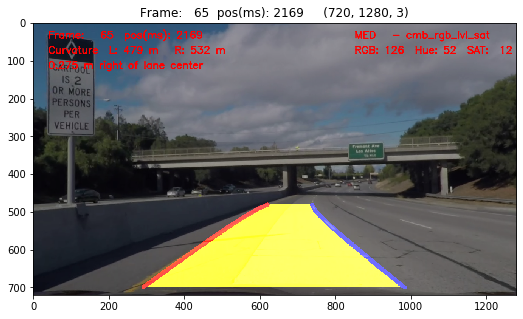

Frame:   66 - 2202.2 ms - Image RGB: 121  (116,120,127)         WARPED RGB: 126  HLS:  63   H:  52   L: 126   S:  13    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     4779   search reg:     4776      Nz to imgPixel Ratio: % 0.52    Nz to SrchRegion Ratio : % 4.15    Nz to ImageNz Ratio: %99.92
  Detected Pixel Count L :      314   R         :     4462      Detected Pixel Ratio  L: % 0.55    R: % 7.75 
  Perspective transform source points -  OffCtr Pxls: 52.0    max_diffs: 5    imgPxlRatio: 0.52  acceptCode: -10
Frame:   67 - 2235.57 ms - Image RGB: 121  (115,120,127)         WARPED RGB: 125  HLS:  64   H:  54   L: 126   S:  13    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     4944   search reg:     4934      Nz to imgPixel Ratio: % 0.54    Nz to SrchRegion Ratio : % 4.28    Nz to ImageNz Ratio: %99.78
  Detected Pixel Count L :      581   R         :     4353      Detected Pixel Ratio  L: % 1.01    R: % 7.56 
  Perspective transform source points -  OffCtr Pxls: 52.0  

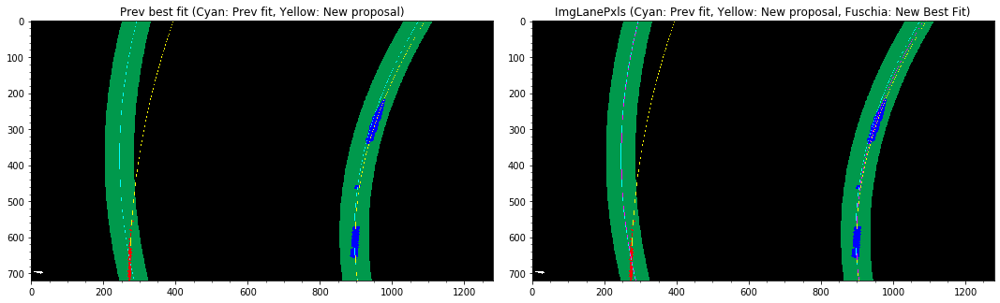

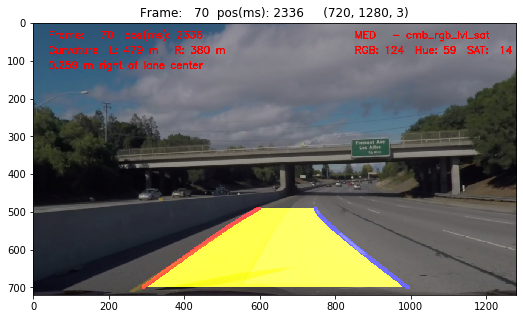

Frame:   71 - 2369.03 ms - Image RGB: 121  (115,120,128)         WARPED RGB: 125  HLS:  66   H:  58   L: 125   S:  14    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     5720   search reg:     5550      Nz to imgPixel Ratio: % 0.62    Nz to SrchRegion Ratio : % 4.82    Nz to ImageNz Ratio: %97.01
  Detected Pixel Count L :     1152   R         :     4398      Detected Pixel Ratio  L: % 2.00    R: % 7.64 
  Perspective transform source points -  OffCtr Pxls: 51.0    max_diffs: 22    imgPxlRatio: 0.62  acceptCode: 0
Frame:   72 - 2402.4 ms - Image RGB: 121  (115,120,128)         WARPED RGB: 125  HLS:  65   H:  56   L: 125   S:  14    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     5585   search reg:     5530      Nz to imgPixel Ratio: % 0.61    Nz to SrchRegion Ratio : % 4.80    Nz to ImageNz Ratio: %99.00
  Detected Pixel Count L :     1239   R         :     4291      Detected Pixel Ratio  L: % 2.15    R: % 7.45 
  Perspective transform source points -  OffCtr Pxls: 52.0   

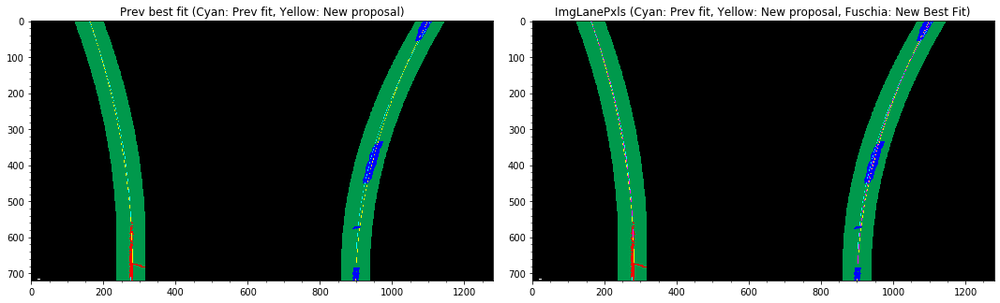

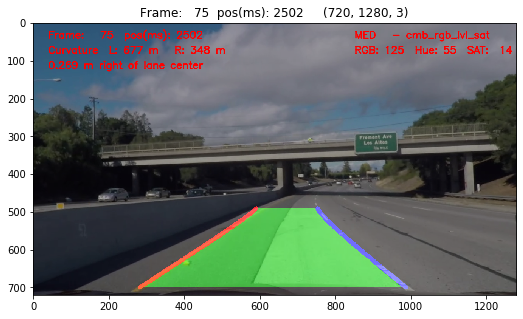

Frame:   76 - 2535.87 ms - Image RGB: 122  (116,121,128)         WARPED RGB: 125  HLS:  65   H:  56   L: 126   S:  14    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     5852   search reg:     5838      Nz to imgPixel Ratio: % 0.63    Nz to SrchRegion Ratio : % 5.07    Nz to ImageNz Ratio: %99.74
  Detected Pixel Count L :     1356   R         :     4482      Detected Pixel Ratio  L: % 2.35    R: % 7.78 
  Perspective transform source points -  OffCtr Pxls: 50.0    max_diffs: 32    imgPxlRatio: 0.63  acceptCode: 0
Frame:   77 - 2569.23 ms - Image RGB: 121  (116,121,128)         WARPED RGB: 125  HLS:  66   H:  58   L: 126   S:  14    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     6239   search reg:     6236      Nz to imgPixel Ratio: % 0.68    Nz to SrchRegion Ratio : % 5.41    Nz to ImageNz Ratio: %99.94
  Detected Pixel Count L :     1032   R         :     5204      Detected Pixel Ratio  L: % 1.79    R: % 9.03 
  Perspective transform source points -  OffCtr Pxls: 54.0  

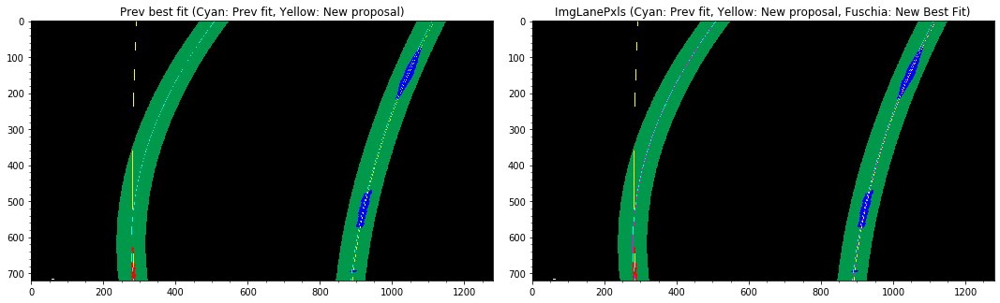

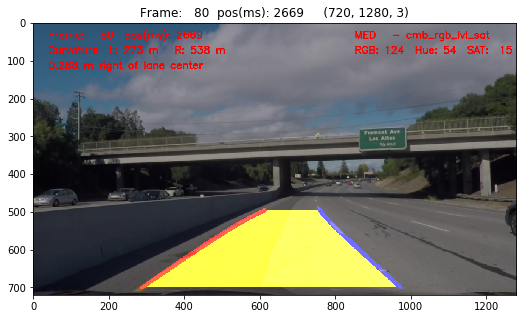

Frame:   81 - 2702.7 ms - Image RGB: 121  (115,120,128)         WARPED RGB: 125  HLS:  65   H:  54   L: 126   S:  14    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     5773   search reg:     5745      Nz to imgPixel Ratio: % 0.63    Nz to SrchRegion Ratio : % 4.99    Nz to ImageNz Ratio: %99.50
  Detected Pixel Count L :      513   R         :     5232      Detected Pixel Ratio  L: % 0.89    R: % 9.08 
  Perspective transform source points -  OffCtr Pxls: 53.0    max_diffs: 32    imgPxlRatio: 0.63  acceptCode: -10
Frame:   82 - 2736.07 ms - Image RGB: 121  (115,120,128)         WARPED RGB: 126  HLS:  64   H:  51   L: 126   S:  14    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     5795   search reg:     5764      Nz to imgPixel Ratio: % 0.63    Nz to SrchRegion Ratio : % 5.00    Nz to ImageNz Ratio: %99.45
  Detected Pixel Count L :      395   R         :     5369      Detected Pixel Ratio  L: % 0.69    R: % 9.32 
  Perspective transform source points -  OffCtr Pxls: 51.0 

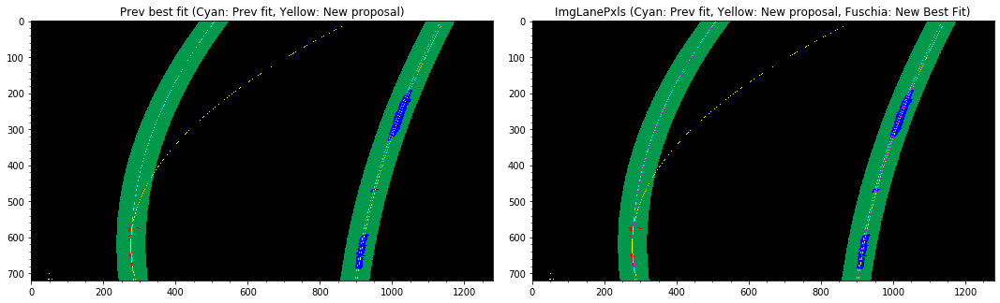

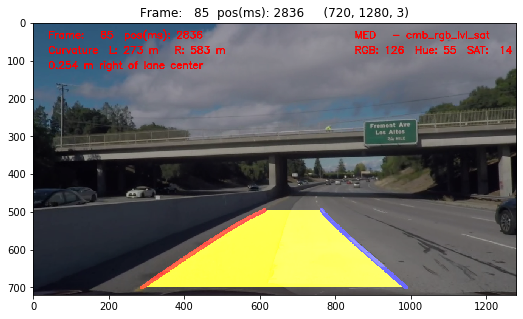

Frame:   86 - 2869.53 ms - Image RGB: 121  (115,120,128)         WARPED RGB: 125  HLS:  65   H:  56   L: 126   S:  14    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     5091   search reg:     5071      Nz to imgPixel Ratio: % 0.55    Nz to SrchRegion Ratio : % 4.40    Nz to ImageNz Ratio: %99.59
  Detected Pixel Count L :      490   R         :     4581      Detected Pixel Ratio  L: % 0.85    R: % 7.95 
  Perspective transform source points -  OffCtr Pxls: 47.0    max_diffs: 32    imgPxlRatio: 0.55  acceptCode: -10
Frame:   87 - 2902.9 ms - Image RGB: 121  (115,120,128)         WARPED RGB: 125  HLS:  66   H:  59   L: 125   S:  15    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     4755   search reg:     4739      Nz to imgPixel Ratio: % 0.52    Nz to SrchRegion Ratio : % 4.11    Nz to ImageNz Ratio: %99.64
  Detected Pixel Count L :      721   R         :     4018      Detected Pixel Ratio  L: % 1.25    R: % 6.98 
  Perspective transform source points -  OffCtr Pxls: 47.0 

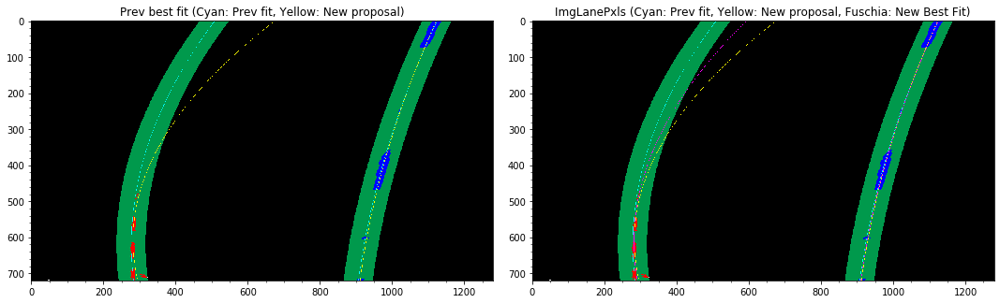

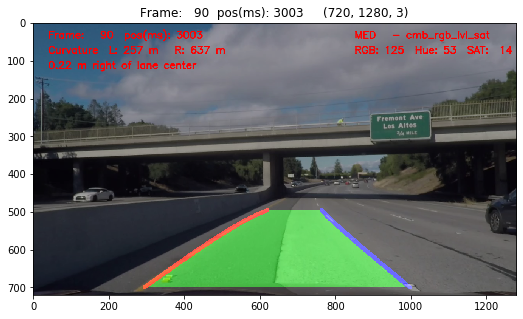

Frame:   91 - 3036.37 ms - Image RGB: 120  (114,119,126)         WARPED RGB: 125  HLS:  65   H:  56   L: 126   S:  14    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     6107   search reg:     6073      Nz to imgPixel Ratio: % 0.66    Nz to SrchRegion Ratio : % 5.27    Nz to ImageNz Ratio: %99.43
  Detected Pixel Count L :      817   R         :     5256      Detected Pixel Ratio  L: % 1.42    R: % 9.12 
  Perspective transform source points -  OffCtr Pxls: 40.0    max_diffs: 45    imgPxlRatio: 0.66  acceptCode: -10
Frame:   92 - 3069.73 ms - Image RGB: 120  (114,119,126)         WARPED RGB: 126  HLS:  66   H:  57   L: 126   S:  14    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     6469   search reg:     6450      Nz to imgPixel Ratio: % 0.70    Nz to SrchRegion Ratio : % 5.60    Nz to ImageNz Ratio: %99.69
  Detected Pixel Count L :      861   R         :     5589      Detected Pixel Ratio  L: % 1.49    R: % 9.70 
  Perspective transform source points -  OffCtr Pxls: 39.0

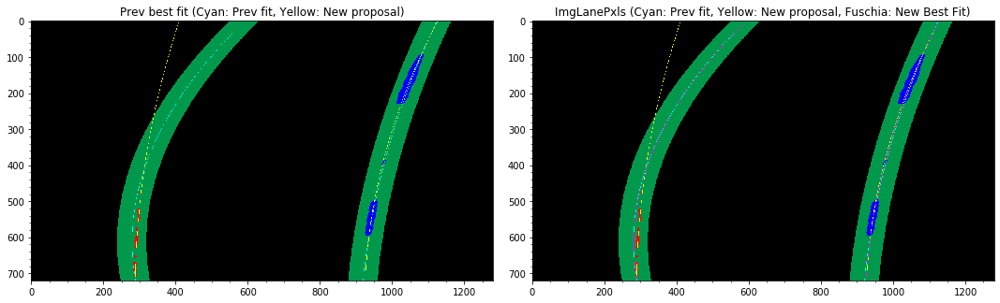

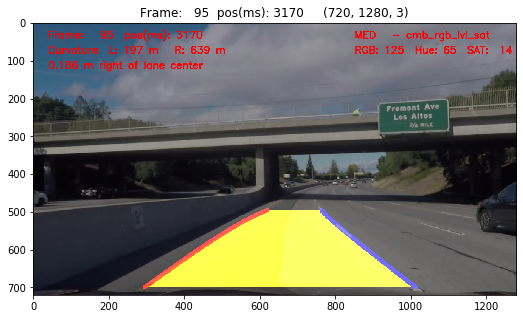

Frame:   96 - 3203.2 ms - Image RGB: 119  (114,118,125)         WARPED RGB: 124  HLS:  67   H:  63   L: 124   S:  15    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     5920   search reg:     5910      Nz to imgPixel Ratio: % 0.64    Nz to SrchRegion Ratio : % 5.13    Nz to ImageNz Ratio: %99.81
  Detected Pixel Count L :     1080   R         :     4830      Detected Pixel Ratio  L: % 1.88    R: % 8.39 
  Perspective transform source points -  OffCtr Pxls: 35.0    max_diffs: 45    imgPxlRatio: 0.64  acceptCode: -10
Frame:   97 - 3236.57 ms - Image RGB: 118  (113,117,125)         WARPED RGB: 123  HLS:  67   H:  61   L: 124   S:  15    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     5716   search reg:     5708      Nz to imgPixel Ratio: % 0.62    Nz to SrchRegion Ratio : % 4.95    Nz to ImageNz Ratio: %99.84
  Detected Pixel Count L :     1143   R         :     4565      Detected Pixel Ratio  L: % 1.98    R: % 7.93 
  Perspective transform source points -  OffCtr Pxls: 35.0 

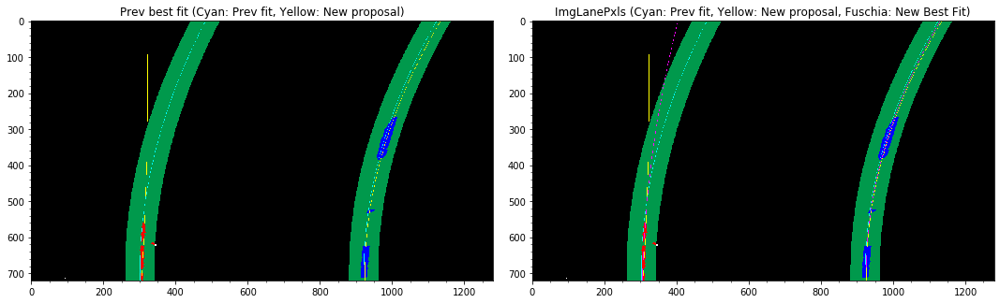

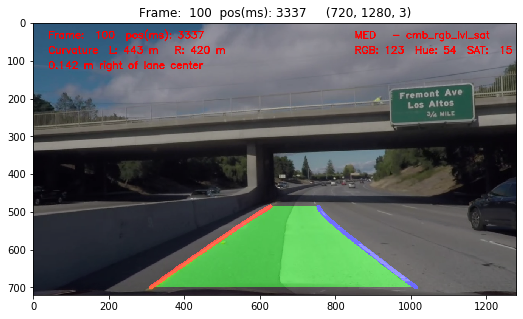

Frame:  101 - 3370.03 ms - Image RGB: 116  (112,115,122)         WARPED RGB: 124  HLS:  63   H:  51   L: 125   S:  15    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     5884   search reg:     5878      Nz to imgPixel Ratio: % 0.64    Nz to SrchRegion Ratio : % 5.10    Nz to ImageNz Ratio: %99.88
  Detected Pixel Count L :     1483   R         :     4395      Detected Pixel Ratio  L: % 2.57    R: % 7.63 
  Perspective transform source points -  OffCtr Pxls: 25.0    max_diffs: 21    imgPxlRatio: 0.64  acceptCode: 0
Frame:  102 - 3403.4 ms - Image RGB: 116  (111,115,121)         WARPED RGB: 125  HLS:  65   H:  56   L: 125   S:  15    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     5562   search reg:     5560      Nz to imgPixel Ratio: % 0.60    Nz to SrchRegion Ratio : % 4.83    Nz to ImageNz Ratio: %99.95
  Detected Pixel Count L :     1609   R         :     3951      Detected Pixel Ratio  L: % 2.79    R: % 6.86 
  Perspective transform source points -  OffCtr Pxls: 24.0   

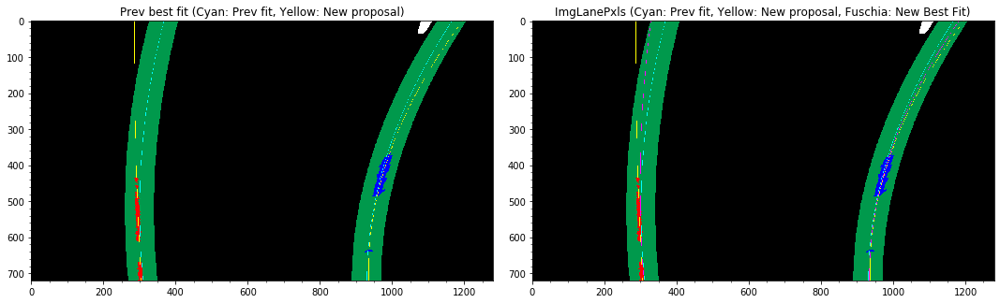

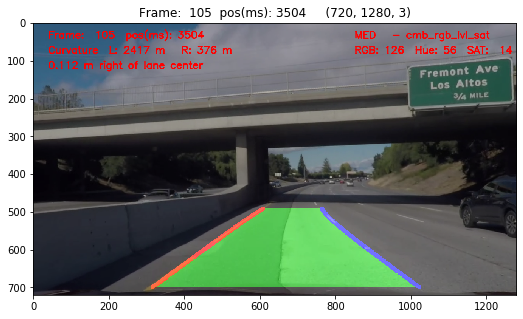

Frame:  106 - 3536.87 ms - Image RGB: 112  (108,111,117)         WARPED RGB: 127  HLS:  66   H:  56   L: 127   S:  14    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     7147   search reg:     4969      Nz to imgPixel Ratio: % 0.78    Nz to SrchRegion Ratio : % 4.31    Nz to ImageNz Ratio: %69.52
  Detected Pixel Count L :     2169   R         :     2800      Detected Pixel Ratio  L: % 3.77    R: % 4.86 
  Perspective transform source points -  OffCtr Pxls: 22.0    max_diffs: 28    imgPxlRatio: 0.78  acceptCode: 0
Frame:  107 - 3570.23 ms - Image RGB: 111  (107,111,116)         WARPED RGB: 126  HLS:  68   H:  62   L: 126   S:  14    MED   - cmb_rgb_lvl_sat
  NZ pixels  - in image  :     8245   search reg:     4602      Nz to imgPixel Ratio: % 0.89    Nz to SrchRegion Ratio : % 3.99    Nz to ImageNz Ratio: %55.81
  Detected Pixel Count L :     2003   R         :     2599      Detected Pixel Ratio  L: % 3.48    R: % 4.51 
  Perspective transform source points -  OffCtr Pxls: 23.0  

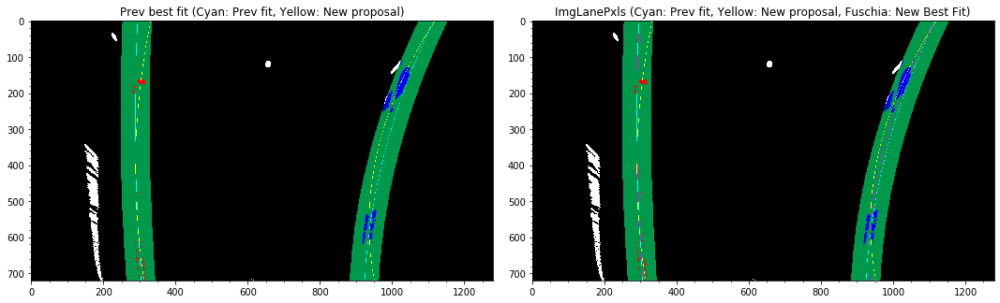

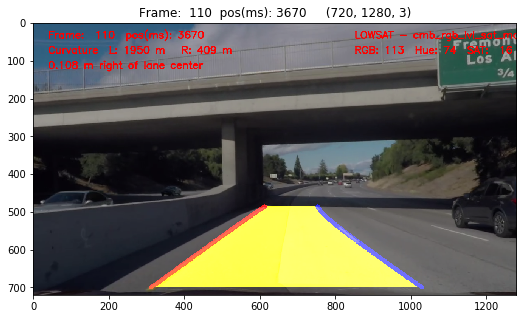

Frame:  111 - 3703.7 ms - Image RGB: 105  (101,104,108)         WARPED RGB: 112  HLS:  68   H:  76   L: 112   S:  17    LOWSAT - cmb_rgb_lvl_sat_mag
  NZ pixels  - in image  :    10645   search reg:     4488      Nz to imgPixel Ratio: % 1.16    Nz to SrchRegion Ratio : % 3.90    Nz to ImageNz Ratio: %42.16
  Detected Pixel Count L :      362   R         :     4126      Detected Pixel Ratio  L: % 0.63    R: % 7.16 
  Perspective transform source points -  OffCtr Pxls: 19.0    max_diffs: 17    imgPxlRatio: 1.16  acceptCode: -10
Frame:  112 - 3737.07 ms - Image RGB: 103  (100,102,106)         WARPED RGB: 106  HLS:  69   H:  80   L: 106   S:  19    LOWSAT - cmb_rgb_lvl_sat_mag
  NZ pixels  - in image  :     9677   search reg:     4166      Nz to imgPixel Ratio: % 1.05    Nz to SrchRegion Ratio : % 3.62    Nz to ImageNz Ratio: %43.05
  Detected Pixel Count L :      526   R         :     3640      Detected Pixel Ratio  L: % 0.91    R: % 6.32 
  Perspective transform source points -  OffCtr P

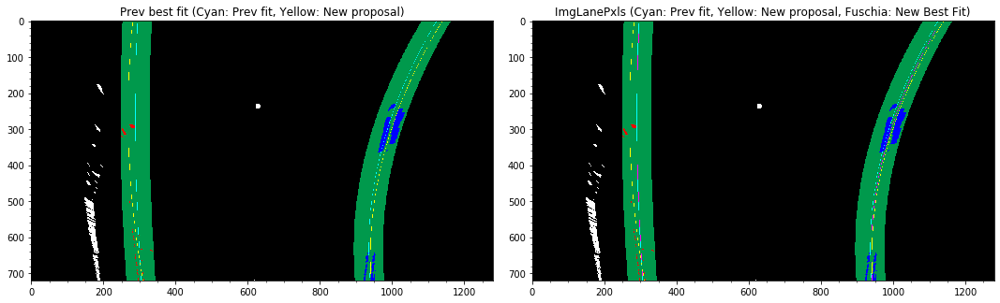

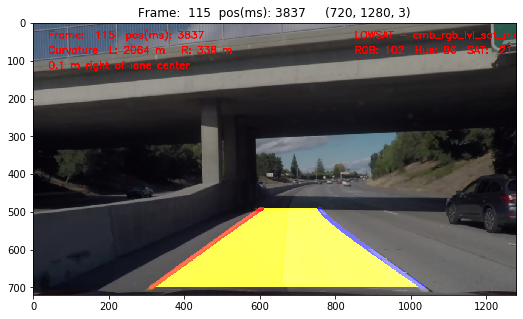

Frame:  116 - 3870.53 ms - Image RGB:  92  ( 92, 91, 94)         WARPED RGB:  97  HLS:  70   H:  89   L:  98   S:  23    LOWSAT - cmb_rgb_lvl_sat_mag
  NZ pixels  - in image  :     7516   search reg:     3580      Nz to imgPixel Ratio: % 0.82    Nz to SrchRegion Ratio : % 3.11    Nz to ImageNz Ratio: %47.63
  Detected Pixel Count L :      273   R         :     3307      Detected Pixel Ratio  L: % 0.47    R: % 5.74 
  Perspective transform source points -  OffCtr Pxls: 19.0    max_diffs: 21    imgPxlRatio: 0.82  acceptCode: -10
Frame:  117 - 3903.9 ms - Image RGB:  91  ( 91, 90, 92)         WARPED RGB:  93  HLS:  70   H:  91   L:  94   S:  25    LOWSAT - cmb_rgb_lvl_sat_mag
  NZ pixels  - in image  :     7496   search reg:     3735      Nz to imgPixel Ratio: % 0.81    Nz to SrchRegion Ratio : % 3.24    Nz to ImageNz Ratio: %49.82
  Detected Pixel Count L :      654   R         :     3081      Detected Pixel Ratio  L: % 1.14    R: % 5.35 
  Perspective transform source points -  OffCtr P

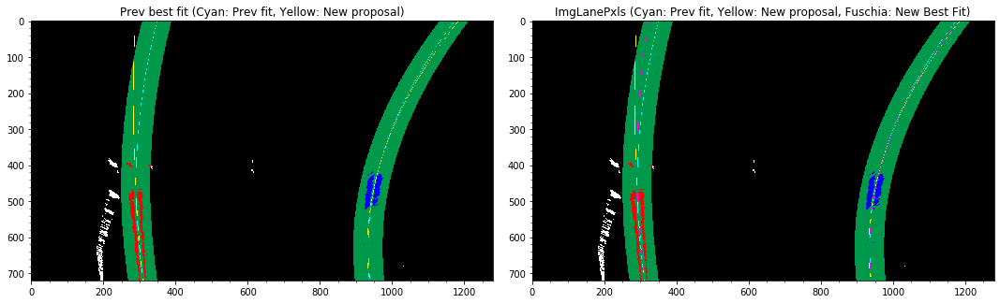

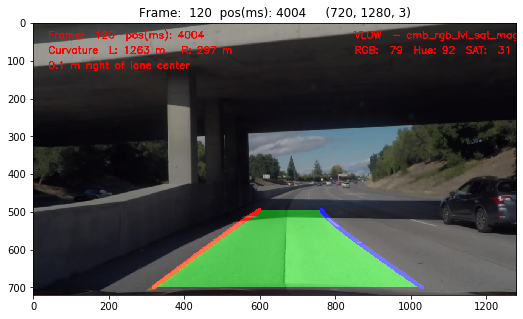

Finshed - Curr frame number : 120


In [105]:
# toFrame = Pipeline.inVideo.currFrameNum + 5

DISPLAY = True; DEBUG   = False; DEBUG2  = False; DEBUG3 = False
SIZE    = (15,5)

toFrame = 120
DISP_INTERVAL = 5
SHOW   = True

Pipeline.process_frame_range(toFrame, disp_interval = DISP_INTERVAL, show = SHOW, exit = 1)

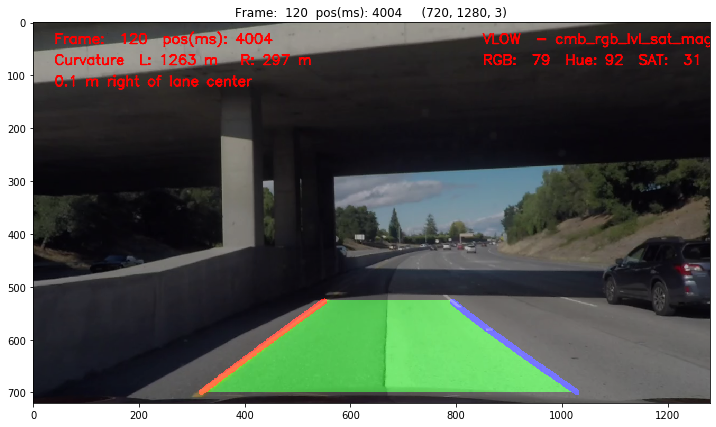

 output video file closed


In [103]:
display_one(Pipeline.resultImage, size=(15,7), title = Pipeline.frameTitle) 

Pipeline.outVideo.closeVideoFile()

### Non Factorized

In [ ]:
# DISPLAY = False; DEBUG   = False; DEBUG2  = False;
# SIZE    = (15,5)
# toFrame = 100
# DISP_INTERVAL = 5
# DEBUG3 = False
# SHOW   = True

# print('From : ', Pipeline.inVideo.currFrameNum, ' To:', toFrame)

# while Pipeline.inVideo.currFrameNum < toFrame  and rc1:    
#     rc1 =  Pipeline.inVideo.getNextFrame()
#     if rc1:
#         output, disp = Pipeline(debug3 = DEBUG3,display_realignment=False)
#         Pipeline.outVideo.saveFrameToVideo(output, debug = False)        

#     if SHOW and (Pipeline.inVideo.currFrameNum % DISP_INTERVAL == 0):      ##  or (110 <=Pipeline.inVideo.currFrameNum <=160) :
        
#         display_two(Pipeline.prevBestFit, Pipeline.imgLanePxls, size = (15,5), title1 = 'Prev best fit (Cyan: Prev fit, Yellow: New proposal)' , 
#                                                             title2 = 'ImgLanePxls (Cyan: Prev fit, Yellow: New proposal, Fuschia: New Best Fit)' )
#         display_one(output, size= SIZE, title = Pipeline.inVideo.frameTitle)        
        
# #     if ( 630 < Pipeline.inVideo.currFrameNum <710):
# #         display_one(output, size= SIZE, title = Pipeline.inVideo.frameTitle)        
        
# print('Curr frame number :', Pipeline.inVideo.currFrameNum)



# display_one(output, size= 12, title = Pipeline.inVideo.frameTitle)
# display_one(output, size= SIZE, title = Pipeline.inVideo.frameTitle)         

In [ ]:
# toFrame = 785
# Pipeline.outVideo.closeVideoFile()     

In [ ]:
# display_one(output,  title = Pipeline.inVideo.frameTitle)    
# print(Pipeline.inVideo.currFrameNum)
# Pipeline.INIT_WINDOW_SRCH_MRGN
# from common.utils import display_one, display_two
# display_two(Pipeline.prevBestFit, Pipeline.imgLanePxls, size = (15,5), title1 = 'Prev best fit (Cyan: Prev fit, Yellow: New proposal)' , 
#                                                             title2 = 'ImgLanePxls (Cyan: Prev fit, Yellow: New proposal, Fuschia: New Best Fit)' )

# display_one(output, size= (10,10), title = Pipeline.inVideo.frameTitle)

In [ ]:
Pipeline.outVideo.closeVideoFile()

## Plot results and errors 

####  plot_1

In [ ]:
# Pipeline.imgUndistStats['RGB'][174:220]
# Pipeline.imgCondHistory

In [90]:
print(Pipeline.SrcAdjustment_history)
idx = -100
print('\n Src/DynPts Diffs: \n',Pipeline.diffsSrcDynPoints[-40:])
print('\n imgPixelRatio      : \n',Pipeline.imgPixelRatio[idx:])
print('\n imgWarpedStats[Sat]: \n',Pipeline.imgWarpedStats['Sat'][idx:])
print('\n imgWarpedStats[RGB]: \n',Pipeline.imgWarpedStats['RGB'][idx:])
print('\n imgCondHistory[RGB]: \n',Pipeline.imgCondHistory[idx:])
print('\n acceptHistory[RGB]: \n',Pipeline.acceptHistory[idx:])

[]

 Src/DynPts Diffs: 
 [13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 18, 18, 18, 20]

 imgPixelRatio      : 
 [0.66, 0.69, 0.62, 0.57, 0.5, 0.45, 0.43, 0.43, 0.42, 0.48, 0.5, 0.5, 0.54, 0.55, 0.55, 0.54, 0.58, 0.61, 0.63, 0.67, 0.68, 0.79, 0.78, 0.76, 0.82, 0.89, 0.87, 0.93, 1.0, 1.16, 1.14, 1.21, 1.22, 1.22, 1.17, 1.14, 1.1, 1.13, 1.13, 1.19, 1.22, 1.23, 1.19, 1.21, 1.15, 0.93, 0.73, 0.61, 0.55, 0.51, 0.55, 0.53, 0.55, 0.59, 0.57, 0.55, 0.53, 0.59, 0.6, 0.62, 0.61, 0.56, 0.5, 0.51, 0.5, 0.51, 0.54, 0.55, 0.59, 0.61, 0.66, 0.65, 0.64, 0.62, 0.67, 0.64, 0.66, 0.71, 0.66, 0.59, 0.62, 0.62, 0.62, 0.61, 0.61, 0.58, 0.55, 0.55, 0.53, 0.61, 0.63, 0.67, 0.71, 0.69, 0.68, 0.65, 0.64, 0.63, 0.63, 0.67]

 imgWarpedStats[Sat]: 
 [9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 9.0, 

 Loading pipeline.py - cwd: E:\Users\kevin\OneDrive\git_projs\CarND-Advanced-Lane-Lines


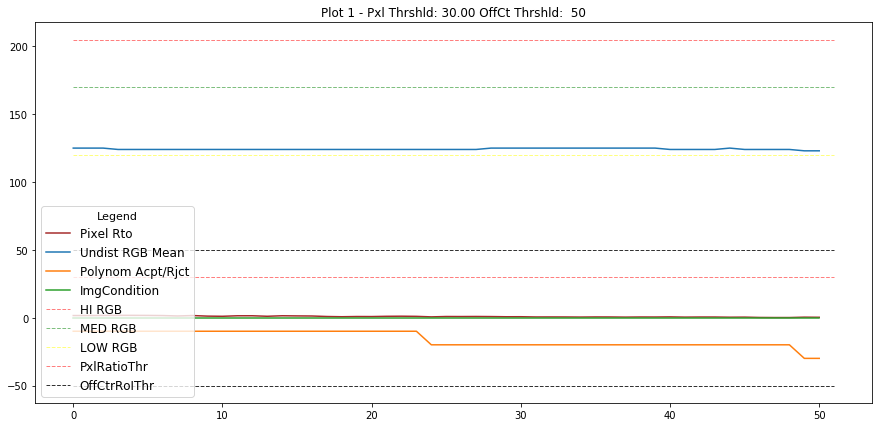

In [41]:
Pipeline.plot_1(legend = 'lower left')

####  plot_3

 Loading pipeline.py - cwd: E:\Users\kevin\OneDrive\git_projs\CarND-Advanced-Lane-Lines


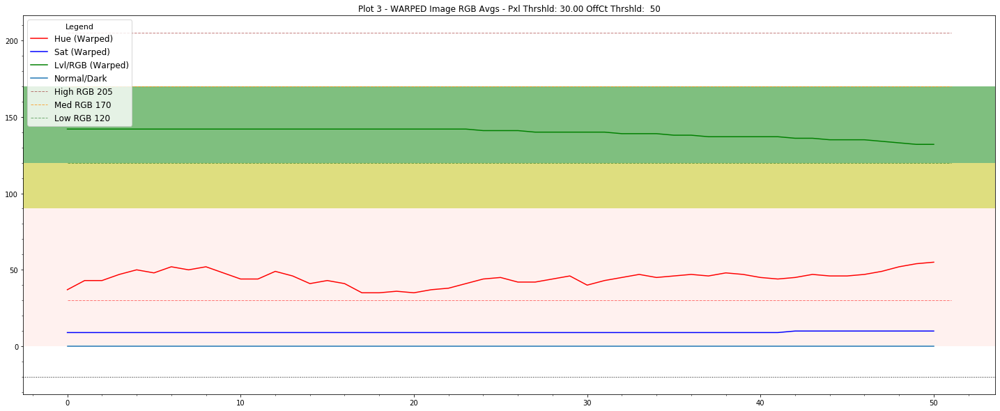

In [44]:
    Pipeline.plot_3(legend = 'upper left', size= (25,10), pxlthr = False)

####  plot_4

 Loading pipeline.py - cwd: E:\Users\kevin\OneDrive\git_projs\CarND-Advanced-Lane-Lines


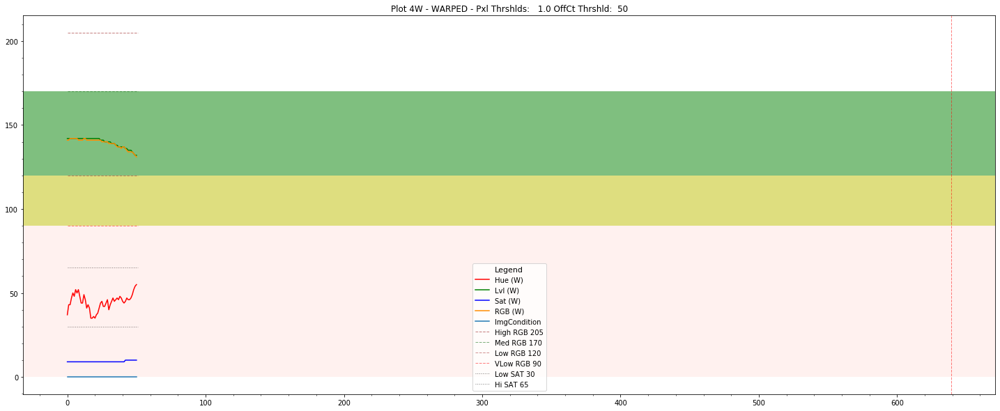

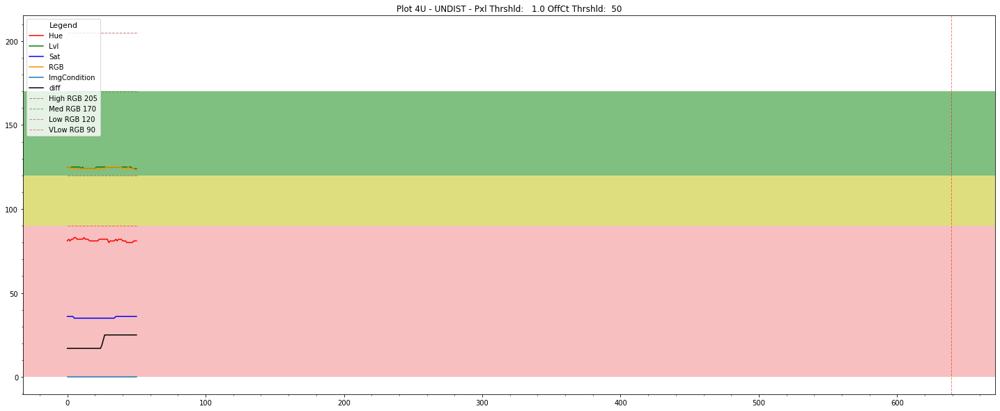

In [48]:
Pipeline.plot_4W(legend = 'best', size = (25,10), start = 0, vmark = 639, pxlthr = False)
Pipeline.plot_4U(legend = 'best', size = (25,10), start = 0, vmark = 639)

####  plot_5

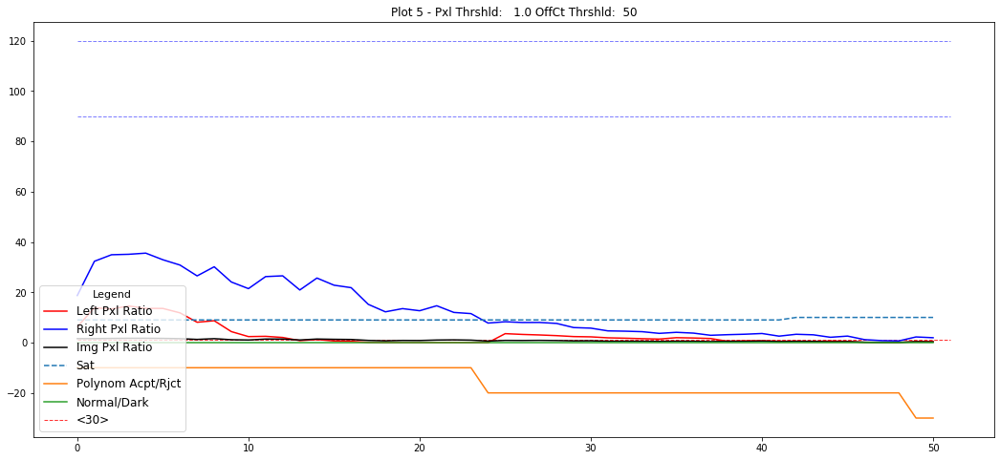

In [49]:
Pipeline.plot_5(legend = 'lower left', size= (18,8))

####  plot_6

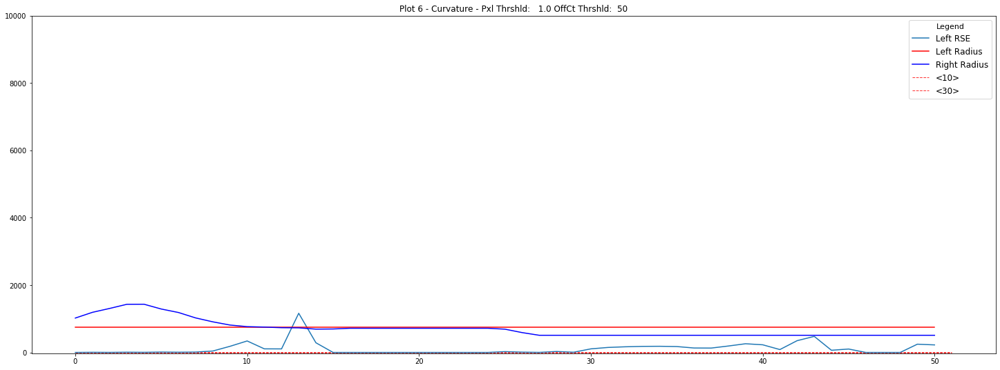

In [50]:
Pipeline.plot_6(size=(25,9) )

In [ ]:
np_format = {}
np_format['float'] = lambda x: "%8.2f" % x
np_format['int']   = lambda x: "%8d" % x
np.set_printoptions(linewidth=195, precision=4, floatmode='fixed', threshold =100, formatter = np_format)


In [ ]:
a = np.histogram(Pipeline.LeftLane.radius_history, bins = 10)
b = np.histogram(Pipeline.RightLane.radius_history, bins = 10)
print('  ',a[0], '\n', a[1])
print('',b[0], '\n', b[1])
# plt.hist(Pipeline.LeftLane.radius_history, bins=20, range=(0,100000) )

In [ ]:
Pipeline.LeftLane.radius_history  = np.clip(Pipeline.LeftLane.radius_history ,0, 6000).tolist()
Pipeline.RightLane.radius_history = np.clip(Pipeline.RightLane.radius_history,0, 6000).tolist()

In [ ]:
type(Pipeline.LeftLane.radius_history)

#### plot_2 

In [ ]:
len(Pipeline.acceptHistory)
len(Pipeline.imgUndistStats['RGB'])

In [ ]:
Pipeline.plot_2(Pipeline.LeftLane )
Pipeline.plot_2(Pipeline.RightLane)

## Applying Multiple Thresholds 

###  T2 Read an image and threshold

####  archive

In [ ]:
# WarpedNormalThresholds = {
#     'ksize'      : 7         , 
#     'x_thr'      : (30,255)  ,
#     'y_thr'      : (70,255)  ,
#     'mag_thr'    : (10,50)   ,
#     'dir_thr'    : (0,30)    ,
#     'sat_thr'    : (60, 255) ,
#     'lvl_thr'    : (180,255) ,
#     'rgb_thr'    : (180,255) 
# }

# WarpedDarkThresholds = {
#     'ksize'      : 7         ,
#     'x_thr'      : (70,255)  ,
#     'y_thr'      : (70,255)  ,
#     'mag_thr'    : (5,100)  ,
#     'dir_thr'    : (0,30)    ,
#     'sat_thr'    : (130,255) ,
#     'lvl_thr'    : (200,255) ,
#     'rgb_thr'    : (200,255)
# }

# ImageNormalThresholds = {
#     'ksize'      : 7         , 
#     'x_thr'      : (30,255)  ,
#     'y_thr'      : (70,255)  ,
#     'mag_thr'    : (10,50)   ,
#     'dir_thr'    : (0,30)    ,
#     'sat_thr'    : (60, 255) ,   ### (80, 255) ,
#     'lvl_thr'    : (180,255) ,
#     'rgb_thr'    : (180,255) 
# }
# ImageDarkThresholds = {
#     'ksize'      : 7         ,
#     'x_thr'      : (30,255)  ,
#     'y_thr'      : (45,255)  ,
#     'mag_thr'    : (55,255)  ,
#     'dir_thr'    : (40,65)   ,
#     'sat_thr'    : (180,255) ,
#     'lvl_thr'    : (205,255),  ## (205,255),
#     'rgb_thr'    : (205,255)   ## (205,255),
# }  

### Thresholds for HARDER CHALLENGE VIDEO

# ImageNormalThresholds = {
#     'ksize'      : 7         , 
#     'x_thr'      : (30,255)  ,
#     'y_thr'      : (70,255)  ,
#     'mag_thr'    : (10,50)   ,
#     'dir_thr'    : (0,30)    ,
#     'sat_thr'    : (60, 255) ,   ### (80, 255) ,
#     'lvl_thr'    : (180,255) ,
#     'rgb_thr'    : (180,255)
# }

# ImageDarkThresholds = {
#     'ksize'      : 7         ,
#     'x_thr'      : (45,255)  ,
#     'y_thr'      : (45,255)  ,
#     'mag_thr'    : (55,255)  ,
#     'dir_thr'    : (40,65)   ,
#     'sat_thr'    : (180,255) ,
#     'lvl_thr'    : (205,255),  ## (205,255),
#     'rgb_thr'    : (205,255)   ## (205,255),
# }
ImageThresholds[1]['hisat']  = {
    'ksize'      : 7         ,
    'x_thr'      : (45,255)  ,
    'y_thr'      : (80,255)  ,
    'mag_thr'    : (35,255)  ,
    'dir_thr'    : (40,65)   ,
    'sat_thr'    : (200,255) ,
    'lvl_thr'    : (250,255) ,  ## (205,255),
    'rgb_thr'    : (250,255) ,   ## (205,255),
    'hue_thr'    : ( 15, 50)
}
ImageThresholds[1]['lowsat']= {
    'ksize'      : 7         ,
    'x_thr'      : (35,255)  ,
    'y_thr'      : None      ,
    'mag_thr'    : None      ,   ### (25,250)  ,
    'dir_thr'    : None      ,
    'sat_thr'    : None      ,
    'lvl_thr'    : None      ,
    'rgb_thr'    : None      ,
    'hue_thr'    : ( 15, 50)
}

####  start

In [ ]:
from common.sobel import *
# ImageThresholds[1]['lowsat']= {
#     'ksize'      : 7         ,
#     'x_thr'      : (35,255)  ,
#     'y_thr'      : None      ,
#     'mag_thr'    : None      ,   ### (25,250)  ,
#     'dir_thr'    : None      ,
#     'sat_thr'    : None      ,
#     'lvl_thr'    : None      ,
#     'rgb_thr'    : None      ,
#     'hue_thr'    : ( 15, 50)
# }
# ImageThresholds[1]['vlow']  = {
#     'ksize'      : 7         ,
#     'x_thr'      : (15,255)  ,
#     'y_thr'      : None      ,
#     'mag_thr'    : (15,255)  ,
#     'dir_thr'    : (40,65)   ,
#     'sat_thr'    : None ,
#     'lvl_thr'    : None ,  ## (205,255),
#     'rgb_thr'    : None ,   ## (205,255),
#     'hue_thr'    : None    
# }  
# ImageThresholds[1]['med']  = {
#     'ksize'      : 7         ,
#     'x_thr'      : (45,255)  ,
#     'y_thr'      : None  ,
#     'mag_thr'    : (45,255)  ,
#     'dir_thr'    : (40,65)   ,
#     'sat_thr'    : (170,255) ,
#     'lvl_thr'    : (250,255) ,  ## (205,255),
#     'rgb_thr'    : (245,255) ,   ## (205,255),
#     'hue_thr'    : ( 20, 65)
# }        
ImageThresholds = {1: {} , 2:{}}

ImageThresholds[1]['xhigh']  = {
    'ksize'      : 7         ,
    'x_thr'      : ( 60,255)  ,
    'y_thr'      : None  ,
    'mag_thr'    : ( 60,255)  ,
    'dir_thr'    : ( 40, 65)   ,
    'sat_thr'    : None ,
    'lvl_thr'    : (252, 255) ,  ## (205,255),
    'rgb_thr'    : None ,   ## (205,255),
    'hue_thr'    : ( 25, 50)
}   

ImageThresholds[1]['high']  = {
    'ksize'      : 7         ,
    'x_thr'      : ( 45,255)  ,
    'y_thr'      : None  ,
    'mag_thr'    : ( 45,255)  ,
    'dir_thr'    : ( 40, 65)   ,
    'sat_thr'    : None ,
    'lvl_thr'    : (250,255) ,  ## (205,255),
    'rgb_thr'    : None ,   ## (205,255),
    'hue_thr'    : ( 20, 85)
}        

ImageThresholds[1]['med']  = {
    'ksize'      : 7         ,
    'x_thr'      : (45,255)  ,
    'y_thr'      : None  ,
    'mag_thr'    : (45,255)  ,
    'dir_thr'    : (40,65)   ,
    'sat_thr'    : None ,
    'lvl_thr'    : (250,255) ,  ## (205,255),
    'rgb_thr'    : None ,   ## (205,255),
    'hue_thr'    : ( 20, 65)
}        
ImageThresholds[1]['low']  = {
    'ksize'      : 7         ,
    'x_thr'      : (65,255)  ,
    'y_thr'      : None      ,
    'mag_thr'    : (55,255)  ,
    'dir_thr'    : (40,65)   ,
    'sat_thr'    : None ,
    'lvl_thr'    : None ,  ## (205,255),
    'rgb_thr'    : None ,   ## (205,255),
    'hue_thr'    : (28, 35)   
} 

ImageThresholds[1]['hisat']  = {
    'ksize'      : 7         ,
    'x_thr'      : (50,255)  ,
    'y_thr'      : None      ,
    'mag_thr'    : (50,255)  ,
    'dir_thr'    : (40,65)   ,
    'sat_thr'    : None ,
    'lvl_thr'    : None ,  ## (205,255),
    'rgb_thr'    : None ,   ## (205,255),
    'hue_thr'    : (27,35)
}

ImageThresholds[1]['lowsat']= {
    'ksize'      : 7         ,
    'x_thr'      : ( 65,255)  ,
    'y_thr'      : None      ,
    'mag_thr'    : ( 55,255)      ,   ### (25,250)  ,
    'dir_thr'    : ( 40, 65)      ,
    'sat_thr'    : ( 50,255)  ,
    'lvl_thr'    : (150,255) ,
    'rgb_thr'    : None      ,
    'hue_thr'    : ( 10, 35)
}

ImageThresholds[1]['vlow']  = {
    'ksize'      : 7         ,
    'x_thr'      : (15,255)  ,
    'y_thr'      : None      ,
    'mag_thr'    : (15,255)  ,
    'dir_thr'    : (40,65)   ,
    'sat_thr'    : None ,
    'lvl_thr'    : None ,  ## (205,255),
    'rgb_thr'    : None ,   ## (205,255),
    'hue_thr'    : None    
}        

In [ ]:
# LOW_RGB_THRESHOLD = Pipeline.LOW_RGB_THRESHOLD
# RGB_THRESHOLD = Pipeline.LOW_RGB_THRESHOLD
# rc1 = Pipeline.inVideo.getNextFrame(FRAME) 


In [ ]:
mode = 1
image = Pipeline.inVideo.image
FRAME = Pipeline.inVideo.currFrameNum
print(' Frame number: ' , FRAME, FRAME - FROM_FRAME)
print(Pipeline.imgUndistStats['RGB'][FRAME - FROM_FRAME])
# display_one(Pipeline.inVideo.image, ' Frame no: '+str(FRAME))

imgUndist = Pipeline.camera.undistortImage(image)
imgWarped, _ , _ = perspectiveTransform(imgUndist, Pipeline.src_points, Pipeline.dst_points)

if mode == 1:
    image_to_threshold = Pipeline.imgUndist
else:
    image_to_threshold = Pipeline.imgWarped

# if (Pipeline.imgWarpedStats['RGB'][-1] < Pipeline.VLOW_RGB_THRESHOLD) :
#     Pipeline.Conditions = 'vlow'
#     historyFlag = -20

# elif (Pipeline.imgWarpedStats['RGB'][-1] < Pipeline.LOW_RGB_THRESHOLD) :
#     if (Pipeline.imgWarpedStats['Sat'][-1] < Pipeline.LOW_SAT_THRESHOLD):
#         Pipeline.Conditions = 'lowsat'
#         historyFlag = -30
#     elif (Pipeline.imgWarpedStats['Sat'][-1] > Pipeline.HIGH_SAT_THRESHOLD):
#         Pipeline.Conditions = 'hisat'
#         historyFlag = +30
#     else:
#         Pipeline.Conditions = 'low'
#         historyFlag = -10                
# elif (Pipeline.imgWarpedStats['RGB'][-1] < Pipeline.MED_RGB_THRESHOLD) :
#     if (Pipeline.imgWarpedStats['Sat'][-1] > Pipeline.HIGH_SAT_THRESHOLD):
#         Pipeline.Conditions = 'hisat'
#         historyFlag = 30
#     # if (Pipeline.imgWarpedStats['Sat'][-1] < Pipeline.LOW_SAT_THRESHOLD):
#         # Pipeline.Conditions = 'lowsat'
#         # historyFlag = -30
#     else:
#         Pipeline.Conditions = 'med'
#         historyFlag = 0
# elif  (Pipeline.imgWarpedStats['RGB'][-1] < Pipeline.HIGH_RGB_THRESHOLD) :
#     if (Pipeline.imgWarpedStats['Sat'][-1] > Pipeline.HIGH_SAT_THRESHOLD):
#         Pipeline.Conditions = 'hisat'
#         historyFlag = 30
#     else:
#         Pipeline.Conditions = 'high'
#         historyFlag = 10
# elif (Pipeline.imgWarpedStats['Sat'][-1] > Pipeline.XHIGH_SAT_THRESHOLD):
        # Pipeline.Conditions = 'hisat'
        # historyFlag = 30
# else:
#     Pipeline.Conditions = 'xhigh'
#     historyFlag = 20

if (Pipeline.imgWarpedStats['Sat'][-1] > Pipeline.XHIGH_SAT_THRESHOLD) or \
   (Pipeline.imgWarpedStats['RGB'][-1] > Pipeline.HIGH_RGB_THRESHOLD):
        Pipeline.Conditions = 'xhigh'
        historyFlag = 30

elif (Pipeline.imgWarpedStats['RGB'][-1] < Pipeline.VLOW_RGB_THRESHOLD) :
    Pipeline.Conditions = 'vlow'
    historyFlag = -20

elif (Pipeline.imgWarpedStats['RGB'][-1] < Pipeline.LOW_RGB_THRESHOLD) :

    if (Pipeline.imgWarpedStats['Sat'][-1] < Pipeline.LOW_SAT_THRESHOLD):
        Pipeline.Conditions = 'lowsat'
        historyFlag = -30
    elif (Pipeline.imgWarpedStats['Sat'][-1] > Pipeline.HIGH_SAT_THRESHOLD):
        Pipeline.Conditions = 'hisat'
        historyFlag = +20
    else:
        Pipeline.Conditions = 'low'
        historyFlag = -10                

elif (Pipeline.imgWarpedStats['RGB'][-1] < Pipeline.MED_RGB_THRESHOLD) :

    if (Pipeline.imgWarpedStats['Sat'][-1] > Pipeline.HIGH_SAT_THRESHOLD):
        Pipeline.Conditions = 'hisat'
        historyFlag = 20
    # if (Pipeline.imgWarpedStats['Sat'][-1] < Pipeline.LOW_SAT_THRESHOLD):
        # Pipeline.Conditions = 'lowsat'
        # historyFlag = -30
    else:
        Pipeline.Conditions = 'med'
        historyFlag = 0

# elif  (Pipeline.imgWarpedStats['RGB'][-1] < Pipeline.HIGH_RGB_THRESHOLD) :
else: 
    if (Pipeline.imgWarpedStats['Sat'][-1] > Pipeline.HIGH_SAT_THRESHOLD):
        Pipeline.Conditions = 'hisat'
        historyFlag = 20
    else:
        Pipeline.Conditions = 'high'
        historyFlag = 10

    
thresholdMethod  =  Pipeline.thresholdMethods[Pipeline.mode][Pipeline.Conditions]
thresholdStrs    =  Pipeline.itStr[Pipeline.mode][Pipeline.Conditions]           
thresholdParms   =  Pipeline.ImageThresholds[Pipeline.mode][Pipeline.Conditions]         

 
mode       = Pipeline.mode
cond       = Pipeline.Conditions
src_points = Pipeline.src_points
dst_points = Pipeline.dst_points    
frameNum   = int(Pipeline.inVideo.currFrameNum)
frameTitle = Pipeline.inVideo.frameTitle
Pipeline.debugInfo_ImageInfo(-1)
# pp.pprint(thresholdParms)


print()
print(' Pipeline Mode         :  ', Pipeline.mode, '  Pipeline Condition: ', Pipeline.Conditions, '  Mode:  ', mode, ' Cond: ', cond )
print(' Pipeline RGB Threshold:  ', Pipeline.LOW_RGB_THRESHOLD, ' High RGB Threshold: ',Pipeline.HIGH_RGB_THRESHOLD, 
      ' image threshold: ', round(image_to_threshold.mean(),2), '  Condition: ', cond, ' Using :', Pipeline.thresholdMethod)
print()
print( ' Thresholds:  HIGH RGB: {}    MED RGB: {}   LOW RGB: {}  VLOW RGB: {}   X-HIGH SAT: {}  HIGH SAT: {}   LOW SAT: {} '.
    format(Pipeline.HIGH_RGB_THRESHOLD, Pipeline.MED_RGB_THRESHOLD , Pipeline.LOW_RGB_THRESHOLD, 
           Pipeline.VLOW_RGB_THRESHOLD, Pipeline.XHIGH_SAT_THRESHOLD, Pipeline.HIGH_SAT_THRESHOLD, Pipeline.LOW_SAT_THRESHOLD))                
print()

width = 23
print('','-'*172)
print(' {:8s} : {:^22s}|{:^22s}|{:^22s}|{:^22s}|{:^22s}|{:^22s}|{:^22s}|'.format('','PL[X-High]  IThr', 
      'PL[High] ImgThr', 'PL[Med]    ImgThr', 'PL[Low]    ImgThr', 'PL[X- Low]   ImgThr',  'PL[LowSat]   ImgThr', 'PL[HiSat]  ImgThr' ))
print('','-'*172)
print(' {:8s} : {:^22s}|{:^22s}|{:^22s}|{:^22s}|{:^22s}|{:^22s}|{:^22s}|'.format('',
                 Pipeline.thresholdMethods[mode]['xhigh'], Pipeline.thresholdMethods[mode]['high'], 
                 Pipeline.thresholdMethods[mode]['med']  , Pipeline.thresholdMethods[mode]['low'], 
                 Pipeline.thresholdMethods[mode]['vlow'] , Pipeline.thresholdMethods[mode]['lowsat'],
                 Pipeline.thresholdMethods[mode]['hisat']))
print('','-'*172)

for ke in Pipeline.ImageThresholds[mode][cond].keys():
    if ke == 'ksize':
        continue
    print(' {:8s} : {:^11s}{:^11s}|{:^11s}{:^11s}|{:^11s}{:^11s}|{:^11s}{:^11s}|{:^11s}{:^11s}|{:^11s}{:^11s}|{:^11s}{:^11s}|'.format(ke, 
          str(Pipeline.ImageThresholds[mode]['xhigh'][ke]  ), str(ImageThresholds[mode]['xhigh'].get(ke, '------------')),                                                                                                                             
          str(Pipeline.ImageThresholds[mode]['high'][ke]  ), str(ImageThresholds[mode]['high'].get(ke, '------------')),
          str(Pipeline.ImageThresholds[mode]['med'][ke]), str(ImageThresholds[mode]['med'].get(ke, '------------')),
          str(Pipeline.ImageThresholds[mode]['low'][ke]  ), str(ImageThresholds[mode]['low'].get(ke, '------------')),
          str(Pipeline.ImageThresholds[mode]['vlow'][ke]), str(ImageThresholds[mode]['vlow'].get(ke, '------------')), 
          str(Pipeline.ImageThresholds[mode]['lowsat'][ke]), str(ImageThresholds[mode]['lowsat'].get(ke, '------------')),
          str(Pipeline.ImageThresholds[mode]['hisat'][ke]  ), str(ImageThresholds[mode]['hisat'].get(ke, '------------'))
        ))    


In [ ]:
# ImageThresholds[mode][cond]['sat_thr'] = None ## (200,255)
# ImageThresholds[mode][cond]['lvl_thr'] = (250,255)
# ImageThresholds[mode][cond]['rgb_thr'] = (250,255)
# ImageThresholds[mode][cond]['mag_thr'] = ( 45,255)
# ImageThresholds[mode][cond]['x_thr']   = ( 35,255)
# ImageThresholds[mode][cond]['rgb_thr'] = (170,255)
# ImageThresholds[mode][cond]['mag_thr'] = ( 35,100)
# ImageThresholds[mode][cond]['hue_thr']   = ( 20,85)

In [ ]:

ImageThresholds[1]['xhigh']  = {
    'ksize'      : 7         ,
    'x_thr'      : ( 60,255)  ,
    'y_thr'      : None  ,
    'mag_thr'    : ( 60,255)  ,
    'dir_thr'    : ( 40, 65)   ,
    'sat_thr'    : None ,
    'lvl_thr'    : (252, 255) ,  ## (205,255),
    'rgb_thr'    : None ,   ## (205,255),
    'hue_thr'    : ( 30, 35)
}   
ImageThresholds[1]['med']  = {
    'ksize'      : 7         ,
    'x_thr'      : (60,255)  ,
    'y_thr'      : None  ,
    'mag_thr'    : (60,255)  ,
    'dir_thr'    : (40,65)   ,
    'sat_thr'    : None ,
    'lvl_thr'    : (250,255) ,  ## (205,255),
    'rgb_thr'    : None ,   ## (205,255),
    'hue_thr'    : ( 20, 65)
}        

In [ ]:
itStr = {1: {} , 2: {} }
for mode in [1]:
    for cond in ImageThresholds[mode].keys():
        itStr[mode][cond] = {}
        for thr in ImageThresholds[mode][cond].keys():
            itStr[mode][cond][thr] = str(ImageThresholds[mode][cond][thr]) if ImageThresholds[mode][cond][thr] else 'None'

####  Apply thresholds
cond = Pipeline.Conditions
cond = 'med'
thr_result =  Pipeline.thresholdMethods[mode][cond]
print(Pipeline.inVideo.frameTitle, ' conditions ', cond, ' threshold use:', thr_result, '\n')
print('ImageThresholds[mode][cond] \n',ImageThresholds[mode][cond])
print('Pipeline.ImageThresholds[mode][cond] \n',Pipeline.ImageThresholds[mode][cond])
 
T2 = apply_thresholds(image_to_threshold, ImageThresholds[mode][cond],debug = False,debug2=False)
# T2 = apply_thresholds(image_to_threshold, Pipeline.ImageThresholds[mode][cond],debug = False,debug2=False)

In [ ]:
warped_outputs = apply_perspective_transform(T2, itStr[mode][cond], Pipeline.src_points, Pipeline.dst_points, size = (15,5), debug = True)
display_two(imgWarped, warped_outputs[thr_result], title1 = cond+' - '+thr_result , title2 = cond+' - '+thr_result +' After thresholding ')

In [ ]:
warped_outputs = apply_perspective_transform(T2, itStr[mode][cond], Pipeline.src_points, Pipeline.dst_points, size = (15,5), debug = True)
display_two(imgWarped, warped_outputs[thr_result], title1 = cond+' - '+thr_result , title2 = cond+' - '+thr_result +' After thresholding ')

In [ ]:
for i in range(len(Pipeline.imgCondHistory)):
    if Pipeline.imgCondHistory[i] == 20:
        print(i, '  ', Pipeline.imgCondHistory[i])

In [ ]:
tt = warped_outputs['cmb_hue']
display_one(tt, cmap='gray')
print(tt.min(), tt.max(), tt.shape, tt[:,:640].sum(), tt[:,640:].sum())

####  display hue related thresholds

In [ ]:
SIZE = (15,5)
display_two(T2['cmb_x'], T2W['cmb_x'], title1='cmb_x - '+str(thlds['x_thr']),size=SIZE)
# display_two(T2['cmb_hue'], T2W['cmb_hue'], title1='cmb_hue - '+str(thlds['hue_thr']),size=SIZE)
display_two(T2['cmb_mag'], T2W['cmb_mag'], title1='cmb_mag - '+str(thlds['mag_thr']),size=SIZE)
# display_two(T2['cmb_lvl'], T2W['cmb_lvl'], title1='cmb_lvl - '+str(thlds['lvl_thr']),size=SIZE)
# display_two(T2['cmb_sat'], T2W['cmb_sat'], title1='cmb_sat - '+str(thlds['sat_thr']),size=SIZE)

display_two(T2['cmb_mag_x']             , T2W['cmb_mag_x']         , title1='cmb_mag_x',size=SIZE)

# display_two(T2['cmb_hue_x']             , T2W['cmb_hue_x'] , title1='cmb_hue_x',size=SIZE)
# display_two(T2['cmb_hue_mag_x']         , T2W['cmb_hue_mag_x'] , title1='cmb_hue_mag_x',size=SIZE)

# display_two(T2['cmb_hue_lvl_x']         , T2W['cmb_hue_lvl_x'], title1='cmb_hue_lvl_x',size=SIZE)
# display_two(T2['cmb_hue_mag_lvl_x']     , T2W['cmb_hue_mag_lvl_x'], title1='cmb_hue_mag_lvl_x',size=SIZE)
# display_two(T2['cmb_hue_mag_lvl_sat']     , T2W['cmb_hue_mag_lvl_sat'], title1='cmb_hue_mag_lvl_sat',size=SIZE)
display_one(np.logical_xor(T2W['cmb_hue_mag_lvl_x'],T2W['cmb_hue_mag_lvl_sat']), cmap = 'gray')

####  display other thresholds

In [ ]:
# display_two(Pipeline.image, Pipeline.imgUndist, 
#             title1 = frameTitle+' '+str(round(image.mean(),3)), 
#             title2 = ' imgUndist '+str(round(imgUndist.mean(),3)))

# for k in  ['cmb_mag_dir','cmb_xy', 'cmb_mag_x', 'cmb_mag_xy', 'cmb_hue_x', 'cmb_hue_mag_x']:
#     display_two(T2[k], T2W[k], title1=k, title2 = k + ' - warped')
SIZE = (15,5)
# display_two(T2['cmb_y']                , T2W['cmb_y']                , title1='cmb_y',size=SIZE)
# display_two(T2['cmb_xy']                , T2W['cmb_xy']                , title1='cmb_xy',size=SIZE)

display_two(T2['cmb_x']  , T2W['cmb_x']  , title1='cmb_x - '+str(thlds['x_thr']),size=SIZE)
display_two(T2['cmb_mag'], T2W['cmb_mag'], title1='cmb_mag - '+str(thlds['mag_thr']),size=SIZE)
display_two(T2['cmb_rgb'], T2W['cmb_rgb'], title1='cmb_rgb - '+str(thlds['rgb_thr']),size=SIZE)
display_two(T2['cmb_lvl'], T2W['cmb_lvl'], title1='cmb_lvl - '+str(thlds['lvl_thr']),size=SIZE)
display_two(T2['cmb_sat'], T2W['cmb_sat'], title1='cmb_sat - '+str(thlds['sat_thr']),size=SIZE)

display_two(T2['cmb_mag_x']             , T2W['cmb_mag_x']         , title1='cmb_mag_x',size=SIZE)

display_two(T2['cmb_rgb_lvl']           , T2W['cmb_rgb_lvl']           , title1='cmb_rgb_lvl',size=SIZE)
display_two(T2['cmb_rgb_lvl_sat']       , T2W['cmb_rgb_lvl_sat']       , title1='cmb_rgb_lvl_sat',size=SIZE)
display_two(T2['cmb_rgb_lvl_sat_mag']   , T2W['cmb_rgb_lvl_sat_mag']   , title1='cmb_rgb_lvl_sat_mag',size=SIZE)
display_two(T2['cmb_rgb_lvl_sat_mag_x'] , T2W['cmb_rgb_lvl_sat_mag_x'] , title1='cmb_rgb_lvl_sat_mag_x',size=SIZE)
display_two(T2['cmb_hue_mag_lvl_x']     , T2W['cmb_hue_mag_lvl_x'], title1='cmb_hue_mag_lvl_x',size=SIZE)
display_two(T2['cmb_mag_lvl_x']         , T2W['cmb_mag_lvl_x']     , title1='cmb_mag_lvl_x',size=SIZE)
display_two(T2['cmb_rgb_mag_x'], T2W['cmb_rgb_mag_x'], title1='cmb_rgb_mag_x',size=SIZE)

# display_two(T2['cmb_sat_x']             , T2W['cmb_sat_x']             , title1='cmb_sat_x',size=SIZE)
# display_two(T2['cmb_sat_mag_x']             , T2W['cmb_sat_mag_x']             , title1='cmb_sat_mag_x',size=SIZE)
# display_one(np.logical_xor(T2W['cmb_mag_lvl_x'],T2W['cmb_rgb_lvl_sat_mag_x']), cmap = 'gray')

In [ ]:
# for i in T2.keys(): print(i)

###  T3 Threshold current Pipeline image

In [ ]:
from common.sobel import apply_thresholds
from common.utils import perspectiveTransform

In [ ]:
### Thresholds for HARDER CHALLENGE VIDEO

# ImageNormalThresholds = {
#     'ksize'      : 7         , 
#     'x_thr'      : (30,255)  ,
#     'y_thr'      : (70,255)  ,
#     'mag_thr'    : (10,50)   ,
#     'dir_thr'    : (0,30)    ,
#     'sat_thr'    : (60, 255) ,   ### (80, 255) ,
#     'lvl_thr'    : (180,255) ,
#     'rgb_thr'    : (180,255)
# }

# ImageDarkThresholds = {
#     'ksize'      : 7         ,
#     'x_thr'      : (45,255)  ,
#     'y_thr'      : (45,255)  ,
#     'mag_thr'    : (55,255)  ,
#     'dir_thr'    : (40,65)   ,
#     'sat_thr'    : (180,255) ,
#     'lvl_thr'    : (205,255),  ## (205,255),
#     'rgb_thr'    : (205,255)   ## (205,255),
# }
ImageHighThresholds = {
    'ksize'      : 7         ,
    'x_thr'      : (45,255)  ,
    'y_thr'      : (80,255)  ,
    'mag_thr'    : (35,255)  ,
    'dir_thr'    : (40,65)   ,
    'sat_thr'    : (200,255) ,
    'lvl_thr'    : (250,255) ,  ## (205,255),
    'rgb_thr'    : (250,255) ,   ## (205,255),
    'hue_thr'    : ( 15, 50)
}
ImageNormalThresholds = {
    'ksize'      : 7         ,
    'x_thr'      : (45,255)  ,
    'y_thr'      : (45,255)  ,
    'mag_thr'    : (35,255)  ,
    'dir_thr'    : (40,65)   ,
    'sat_thr'    : (180,255) ,
    'lvl_thr'    : (205,255) ,  ## (205,255),
    'rgb_thr'    : (205,255) ,   ## (205,255),
    'hue_thr'    : ( 15, 50)
}
ImageDarkThresholds  = {
    'ksize'      : 7         ,
    'x_thr'      : (15,255)  ,
    'y_thr'      : None      ,
    'mag_thr'    : (15,255)  ,
    'dir_thr'    : (40,65)   ,
    'sat_thr'    : None ,
    'lvl_thr'    : None ,  ## (205,255),
    'rgb_thr'    : None ,   ## (205,255),
    'hue_thr'    : None    
}        
ImageLowSatThresholds= {
    'ksize'      : 7         ,
    'x_thr'      : ( 35,255)  ,
    'y_thr'      : None      ,
    'mag_thr'    : None      ,   ### (25,250)  ,
    'dir_thr'    : None      ,
    'sat_thr'    : None      ,
    'lvl_thr'    : None      ,
    'rgb_thr'    : None      ,
    'hue_thr'    : ( 15, 50)
}



In [ ]:
mode  = 1
# FRAME = 180
# RGB_MEAN_THRESHOLD = 30
LOW_RGB_THRESHOLD = Pipeline.LOW_RGB_THRESHOLD

image = Pipeline.inVideo.image
imgUndist = Pipeline.imgUndist
imgWarped = Pipeline.imgWarped

if mode == 1:
    image_to_threshold = Pipeline.imgUndist
else:
    image_to_threshold = Pipeline.imgWarped

    
# if (image_to_threshold.mean() >  RGB_MEAN_THRESHOLD) :
#     NormalConditions = True
#     cond            = 'normal'
#     thresholdResult =  Pipeline.NORMAL_THRESHOLDING
#     thresholdParms  =  Pipeline.ImageThresholds[mode]['normal'] 
# else:
#     NormalConditions = False
#     cond            = 'dark'
#     thresholdResult =  Pipeline.LOWLIGHT_THRESHOLDING
#     thresholdParms  =  Pipeline.ImageThresholds[mode]['dark']    

if (Pipeline.imgWarpedStats['Sat'][-1] >  Pipeline.HIGH_SAT_THRESHOLD) or \
   (Pipeline.imgWarpedStats['RGB'][-1] >  Pipeline.HIGH_RGB_THRESHOLD) :
    # print('Over exposed frame - detection will be skipped')
    # print(' WarpedStats[Sat]: {}  WarpedStats[RGB]: {} '.format(self.imgWarpedStats['Sat'][-1],
                                        # self.imgWarpedStats['RGB'][-1]))
    skipFrameDetection = True
    slidingWindowBootstrap = True
    Conditions = 'high'
#     imgCondHistory.append(20)
    thresholdResult =  Pipeline.HIGH_THRESHOLDING
    thresholdParms =  Pipeline.ImageThresholds[Pipeline.mode]['lowsat'] 

elif (Pipeline.imgUndistStats['Sat'][-1] < Pipeline.LOW_SAT_THRESHOLD):
    Conditions = 'lowsat'
#     self.imgCondHistory.append(-30)
    thresholdResult =  Pipeline.LOWSAT_THRESHOLDING
    thresholdParms  =  Pipeline.ImageThresholds[Pipeline.mode]['lowsat'] 

elif (Pipeline.imgUndistStats['RGB'][-1] < Pipeline.LOW_RGB_THRESHOLD) :
    Conditions = 'low'
#     self.imgCondHistory.append(-20)
    thresholdResult = Pipeline.LOW_THRESHOLDING
    thresholdParms  = Pipeline.ImageThresholds[Pipeline.mode]['low']            
else:
    Conditions = 'normal'
#     self.imgCondHistory.append(0)
    thresholdResult =  Pipeline.NORMAL_THRESHOLDING
    thresholdParms  =  Pipeline.ImageThresholds[Pipeline.mode]['normal'] 

mode       = Pipeline.mode
cond       = Pipeline.Conditions
src_points = Pipeline.src_points
dst_points = Pipeline.dst_points    
frameNum   = int(Pipeline.inVideo.currFrameNum)
frameTitle = Pipeline.inVideo.frameTitle
print(' {:35s} '.format( frameTitle))

print('{:35s} - Mode: {:2d}  imgUndist - RGB Thrshld: {:6.2f}  Avgs  RGB: {:6.2f}  Sat: {:6.2f}  Hue: {:6.2f}'\
        '  Conditions: {:10s}  Using: {}'.format( Pipeline.frameTitle, Pipeline.mode, Pipeline.LOW_RGB_THRESHOLD, 
        Pipeline.imgUndistStats['RGB'][-1], Pipeline.imgUndistStats['Sat'][-1], Pipeline.imgUndistStats['Hue'][-1], 
        Pipeline.Conditions ,  Pipeline.thresholdResult))
print('{:35s} - Mode: {:2d}  imgWarped - RGB Thrshld: {:6.2f}  Avgs  RGB: {:6.2f}  Sat: {:6.2f}  Hue: {:6.2f}'\
        '  Conditions: {:10s}  Using: {}'.format( Pipeline.frameTitle, Pipeline.mode, Pipeline.LOW_RGB_THRESHOLD, 
        Pipeline.imgWarpedStats['RGB'][-1], Pipeline.imgWarpedStats['Sat'][-1], Pipeline.imgWarpedStats['Hue'][-1], 
        Pipeline.Conditions ,  Pipeline.thresholdResult))

print()
print(' Mode              :  ', mode, ' Conditions: ', cond )
print(' Pipeline Mode     :  ', Pipeline.mode, ' Pipeline Condition: ', Pipeline.Conditions)
print(' Pipeline RGB Threshold:  ', Pipeline.LOW_RGB_THRESHOLD, ' Active Threshold: ',LOW_RGB_THRESHOLD, 
      ' image threshold: ', round(image_to_threshold.mean(),2), '  Condition: ', cond)
print()
print(' {:17s} :  Pipeline[Normal]       ImageThr       Pipeline[low]       ImageThr       Pipeline[lowsat]     ImageThr       Pipeline[High]      ImageThr'.format(' ')) 
for ke in Pipeline.ImageThresholds[mode][cond].keys():
    if ke == 'ksize':
        continue
    print(' {:17s} :    {:^14s}    {:^14s}    {:^14s}    {:^14s}    {:^14s}    {:^14s}    {:^14s}    {:^14s}'.format(ke, 
          str(Pipeline.ImageThresholds[mode]['normal'][ke]), str(ImageNormalThresholds.get(ke, '------------')),
          str(Pipeline.ImageThresholds[mode]['low'][ke]  ),   str(ImageDarkThresholds.get(ke, '------------')),
          str(Pipeline.ImageThresholds[mode]['lowsat'][ke]), str(ImageLowSatThresholds.get(ke, '------------')), 
          str(Pipeline.ImageThresholds[mode]['high'][ke]  ),   str(ImageHighThresholds.get(ke, '------------')) ))     

In [ ]:
ImageHighThresholds = {
    'ksize'      : 7         ,
    'x_thr'      : (45,255)  ,
    'y_thr'      : (80,255)  ,
    'mag_thr'    : (35,255)  ,
    'dir_thr'    : (40,65)   ,
    'sat_thr'    : (200,255) ,
    'lvl_thr'    : (250,255) ,  ## (205,255),
    'rgb_thr'    : (250,255) ,   ## (205,255),
    'hue_thr'    : ( 15, 50)
}
ImageNormalThresholds = {
    'ksize'      : 7         ,
    'x_thr'      : (45,255)  ,
    'y_thr'      : (80,255)  ,
    'mag_thr'    : (35,255)  ,
    'dir_thr'    : (40,65)   ,
    'sat_thr'    : (200,255) ,
    'lvl_thr'    : (250,255) ,  ## (205,255),
    'rgb_thr'    : (250,255) ,   ## (205,255),
    'hue_thr'    : ( 15, 50)
}
ImageDarkThresholds  = {
    'ksize'      : 7         ,
    'x_thr'      : (15,255)  ,
    'y_thr'      : None      ,
    'mag_thr'    : (15,255)  ,
    'dir_thr'    : (40,65)   ,
    'sat_thr'    : None ,
    'lvl_thr'    : None ,  ## (205,255),
    'rgb_thr'    : None ,   ## (205,255),
    'hue_thr'    : None    
}        
ImageLowSatThresholds= {
    'ksize'      : 7         ,
    'x_thr'      : ( 35,255)  ,
    'y_thr'      : None      ,
    'mag_thr'    : None      ,   ### (25,250)  ,
    'dir_thr'    : None      ,
    'sat_thr'    : None      ,
    'lvl_thr'    : None      ,
    'rgb_thr'    : None      ,
    'hue_thr'    : ( 15, 50)
}


In [ ]:
# T2 = apply_thresholds(image_to_threshold, Pipeline.ImageThresholds[mode][cond],debug = True, debug2 = True)
# T2 = apply_thresholds(Pipeline.imgUndist, Pipeline.ImageThresholds[Pipeline.mode][Pipeline.Conditions],debug = True)
# T2 = apply_thresholds(image_to_threshold, ImageDarkThresholds,debug = True, debug2=True)
# T2 = apply_thresholds(image_to_threshold, ImageLowSatThresholds,debug = True, debug2=True)
T2 = apply_thresholds(image_to_threshold, ImageNormalThresholds,debug = True,debug2=False)
# T2 = apply_thresholds(image_to_threshold, ImageHighThresholds,debug = True,debug2=False)

T2W = {}
# for k in  ['cmb_mag_dir','cmb_mag_x', 'cmb_mag_xy','cmb_hue_x'] ## 
for k in T2.keys():
    T2W[k], _,_ = perspectiveTransform(T2[k] , src_points, dst_points)


In [ ]:
display_two(Pipeline.image, Pipeline.imgUndist, 
            title1 = frameTitle+' '+str(round(image.mean(),3)), 
            title2 = ' imgUndist '+str(round(imgUndist.mean(),3)))

# for k in  ['cmb_mag_dir','cmb_xy', 'cmb_mag_x', 'cmb_mag_xy', 'cmb_hue_x', 'cmb_hue_mag_x']:
#     display_two(T2[k], T2W[k], title1=k, title2 = k + ' - warped')

display_two(T2['cmb_mag_dir']           , T2W['cmb_mag_dir']           , title1='cmb_mag_dir')
display_two(T2['cmb_xy']                , T2W['cmb_xy']                , title1='cmb_xy')

display_two(T2['cmb_mag_x']             , T2W['cmb_mag_x']             , title1='cmb_mag_x')
display_two(T2['cmb_mag_xy']            , T2W['cmb_mag_xy']            , title1='cmb_mag_xy')
display_two(T2['cmb_hue_x']             , T2W['cmb_hue_x']             , title1='cmb_hue_x')
display_two(T2['cmb_hue_mag_x']         , T2W['cmb_hue_mag_x']         , title1='cmb_hue_mag_x')

display_two(T2['cmb_lvl']               , T2W['cmb_lvl']               , title1='cmb_lvl')
display_two(T2['cmb_rgb']               , T2W['cmb_rgb']               , title1='cmb_rgb')
display_two(T2['cmb_rgb_lvl']           , T2W['cmb_rgb_lvl']           , title1='cmb_rgb_lvl')

display_two(T2['cmb_rgb_lvl_sat']       , T2W['cmb_rgb_lvl_sat']       , title1='cmb_rgb_lvl_sat')
display_two(T2['cmb_rgb_lvl_sat_mag']   , T2W['cmb_rgb_lvl_sat_mag']   , title1='cmb_rgb_lvl_sat_mag')
display_two(T2['cmb_rgb_lvl_sat_mag_x'] , T2W['cmb_rgb_lvl_sat_mag_x'] , title1='cmb_rgb_lvl_sat_mag_x')
display_two(T2['cmb_rgb_lvl_sat_mag_xy'], T2W['cmb_rgb_lvl_sat_mag_xy'], title1='cmb_rgb_lvl_sat_mag_xy')

display_two(T2['cmb_sat']               , T2W['cmb_sat']               , title1='cmb_sat')
display_two(T2['cmb_sat_x']             , T2W['cmb_sat_x']             , title1='cmb_sat_x')
display_two(T2['cmb_sat_xy']            , T2W['cmb_sat_xy']            , title1='cmb_sat_xy')


In [ ]:
# WarpedNormalThresholds = {
#     'ksize'      : 7         , 
#     'x_thr'      : (30,255)  ,
#     'y_thr'      : (70,255)  ,
#     'mag_thr'    : (10,50)   ,
#     'dir_thr'    : (0,30)    ,
#     'sat_thr'    : (60, 255) ,
#     'lvl_thr'    : (180,255) ,
#     'rgb_thr'    : (180,255) 
# }

# WarpedDarkThresholds = {
#     'ksize'      : 7         ,
#     'x_thr'      : (70,255)  ,
#     'y_thr'      : (70,255)  ,
#     'mag_thr'    : (5,100)  ,
#     'dir_thr'    : (0,30)    ,
#     'sat_thr'    : (130,255) ,
#     'lvl_thr'    : (200,255) ,
#     'rgb_thr'    : (200,255)
# }

# ImageNormalThresholds = {
#     'ksize'      : 7         , 
#     'x_thr'      : (30,255)  ,
#     'y_thr'      : (70,255)  ,
#     'mag_thr'    : (10,50)   ,
#     'dir_thr'    : (0,30)    ,
#     'sat_thr'    : (60, 255) ,   ### (80, 255) ,
#     'lvl_thr'    : (180,255) ,
#     'rgb_thr'    : (180,255) 
# }
# ImageDarkThresholds = {
#     'ksize'      : 7         ,
#     'x_thr'      : (30,255)  ,
#     'y_thr'      : (45,255)  ,
#     'mag_thr'    : (55,255)  ,
#     'dir_thr'    : (40,65)   ,
#     'sat_thr'    : (180,255) ,
#     'lvl_thr'    : (205,255),  ## (205,255),
#     'rgb_thr'    : (205,255)   ## (205,255),
# }        

###  T4

In [ ]:
# src_points =  np.array(Pipeline.src_points_history[frameNum], dtype = np.float32)
# dst_points =  np.array(Pipeline.orig_dst_points_list, dtype = np.float32)
# input_image = imgCorrected
# imgUndist = cameraConfig.undistortImage(input_image)
# input_image = Pipeline.imgUndist
# mode = Pipeline.mode
# cond = Pipeline.Conditions
# src_points = Pipeline.src_points
# dst_points = Pipeline.dst_points
# frameTitle = inVideo.frameTitle
# print(mode, cond)

In [ ]:
# T2 = apply_thresholds(Pipeline.imgUndist, Pipeline.ImageThresholds[mode][cond],debug = True)
# T2 = apply_thresholds(Pipeline.imgUndist, Pipeline.ImageThresholds[Pipeline.mode][Pipeline.Conditions],debug = True)
T2 = apply_thresholds(input_image, ImageDarkThresholds,debug = False)
imgT2_0, _, _ = perspectiveTransform(T2['cmb_mag_x']            , src_points, dst_points)
imgT2_1, _, _ = perspectiveTransform(T2['cmb_rgb_lvl']          , src_points, dst_points)
imgT2_2, _, _ = perspectiveTransform(T2['cmb_rgb_lvl_sat']      , src_points, dst_points)
imgT2_3, _, _ = perspectiveTransform(T2['cmb_rgb_lvl_sat_mag']  , src_points, dst_points)
imgT2_4, _, _ = perspectiveTransform(T2['cmb_rgb_lvl_sat_mag_x'], src_points, dst_points)

T3 = apply_thresholds(Pipeline.imgUndist, ImageDarkThresholds,debug = False) 

imgT3_0, _, _ = perspectiveTransform(T3['cmb_mag_x']            , src_points, dst_points)
imgT3_1, _, _ = perspectiveTransform(T3['cmb_rgb_lvl']          , src_points, dst_points)
imgT3_2, _, _ = perspectiveTransform(T3['cmb_rgb_lvl_sat']      , src_points, dst_points)
imgT3_3, _, _ = perspectiveTransform(T3['cmb_rgb_lvl_sat_mag']  , src_points, dst_points)
imgT3_4, _, _ = perspectiveTransform(T3['cmb_rgb_lvl_sat_mag_x'], src_points, dst_points)

print('\n\n\n\n')
display_two(input_image,imgUndist, title1 = frameTitle+' '+str(round(image.mean(),3)), title2 = ' imgUndist '+str(round(imgUndist.mean(),3)))
display_two(T2['cmb_mag_x']            , imgT2_0,title1='cmb_mag_x')
display_two(T3['cmb_mag_x']            , imgT3_0,title1='cmb_mag_x')
print('\n\n')

display_two(T2['cmb_rgb_lvl']          , imgT2_1,title1='cmb_rgb_lvl')
display_two(T3['cmb_rgb_lvl']          , imgT3_1,title1='cmb_rgb_lvl')
print('\n\n')

display_two(T2['cmb_rgb_lvl_sat']      , imgT2_2,title1='cmb_rgb_lvl_sat')
display_two(T3['cmb_rgb_lvl_sat']      , imgT3_2,title1='cmb_rgb_lvl_sat')
print('\n\n')

display_two(T2['cmb_rgb_lvl_sat_mag']  , imgT2_3,title1='cmb_rgb_lvl_sat_mag')
display_two(T3['cmb_rgb_lvl_sat_mag']  , imgT3_3,title1='cmb_rgb_lvl_sat_mag')
print('\n\n')

display_two(T2['cmb_rgb_lvl_sat_mag_x'], imgT2_4,title1='cmb_rgb_lvl_sat_mag_x')
display_two(T3['cmb_rgb_lvl_sat_mag_x'], imgT3_4,title1='cmb_rgb_lvl_sat_mag_x')

In [ ]:
# imgWarpedAdj = adjust_contrast(imgWarped, alpha = 0.7, beta = 0)
# display_two(imgWarped, imgWarpedAdj)
# display_one(Pipeline.imgWarped)

###  T1

In [ ]:
from common.sobel import apply_thresholds, perspectiveTransform


In [ ]:
# ksize = 19 # Choose a larger odd number to smooth gradient measurements
# grad_x_thr = (70,100)
# grad_y_thr = (80,155)
# mag_thr    = (90,160)
# theta1     = 45
# theta2     = 67

# ksize      = 5
# grad_x_thr = (30,110)
# grad_y_thr = (30,110)
# mag_thr    = (65,255)
# dir_thr    = (40,65)
# sat_thr    = (90,255)

#--adjusted for challenge video -------------=
ksize      = 7
test_grad_x_thr = (30,255)
test_grad_y_thr = (70,255)
test_mag_thr    = (35,255)
test_dir_thr    = (40,65)
test_sat_thr    = (80,255)
test_lvl_thr    = (180,255)
test_rgb_thr    = (180,255)
test_rgb_or_thr = (180,255)
# sat_thr    = (100,255)
#-------------------------------------------=

In [ ]:
# from common.utils import *
# blurKernel = 7
# imgBlurred = gaussian_blur(image, blurKernel)

In [ ]:
img_to_process = imgWarped
# T1 = apply_thresholds(imgBlurred, ksize=ksize, x_thr = grad_x_thr, y_thr = grad_y_thr, 
#                         mag_thr = mag_thr, dir_thr = dir_thr, sat_thr = sat_thr, 
#                         lvl_thr = lvl_thr, rgb_thr = rgb_thr, debug = True);

T1 = apply_thresholds(img_to_process, ret = 'cmb_rgb_lvl_sat', ksize = ksize, debug = True,
                                       x_thr = test_grad_x_thr, y_thr = test_grad_y_thr, 
                                     mag_thr = test_mag_thr   , dir_thr = test_dir_thr,  
                                     sat_thr = test_sat_thr   , rgb_thr = test_rgb_thr,  
                                     lvl_thr = test_lvl_thr)


##  Hide

###  A2 - Read FIRST/ ONE frame and process

In [ ]:
MODE    = 1
DISPLAY = True
DEBUG   = True
DEBUG2  = False

# videoPipeline.LOWLIGHT_THRESHOLDING  = 'cmb_mag_xy'
# videoPipeline.WINDOW_SEARCH_MARGIN = 50 
rc1 = Pipeline.inVideo.getNextFrame()    
if rc1:
    output, disp = Pipeline(mode = MODE, displayResults = DISPLAY,  debug = DEBUG, debug2 = DEBUG2)
    Pipeline.outVideo.saveFrameToVideo(output, debug = False)        
    display_one(output, size= 15)


In [ ]:
# disp

In [ ]:
# display_one(output, size= 15)

###  B2 - Read GROUP of images and process

In [ ]:
start = Pipeline.inVideo.currFrameNum
MODE    = 1 
DISPLAY = False
DEBUG   = False
DEBUG2  = False
rc1     = True

while Pipeline.inVideo.currFrameNum < 502:
    rc1 = Pipeline.inVideo.getNextFrame()
    if rc1:
        output, disp = Pipeline(mode = MODE, displayResults = DISPLAY,  debug = DEBUG, debug2 = DEBUG2)
        Pipeline.outVideo.saveFrameToVideo(output, debug = False)        
        display_one(output, size= 10, title = Pipeline.inVideo.frameTitle)

In [ ]:
print(Pipeline.diffsSrcDynPoints)
print(Pipeline.SrcAdjustment_history)
print(Pipeline.inVideo.currFrameNum)
display_one(output, size= 10)

In [ ]:
Pipeline.outVideo.closeVideoFile()

### C - Run ONE frame and process

In [ ]:
MODE    = 1 
DISPLAY = True
DEBUG   = True
DEBUG2  = False
# videoPipeline.slidingWindowBootstrap  = True

rc1 = Pipeline.inVideo.getNextFrame()
if rc1 :
    output, disp = Pipeline(mode = MODE, displayResults = DISPLAY, debug = DEBUG, debug2 = DEBUG2)
    Pipeline.outVideo.saveFrameToVideo(output, debug = False)   
    display_one(output, size= 15)


In [ ]:
# Pipeline.LOWLIGHT_THRESHOLDING = 'cmb_mag_x'
# Pipeline.ImageThresholds[Pipeline.mode][Pipeline.Conditions]['sat_thr']  ##  = (160,255)
# Pipeline.RGB_MEAN_THRESHOLD = 175
# Pipeline.POLY_SEARCH_MARGIN = 40
# Pipeline.laneRegionTop = 500
Pipeline.LOWLIGHT_THRESHOLDING  = 'cmb_mag_xy'

### some misc displays

In [ ]:
np_format = {}
np_format['float'] = lambda x: "%12.6f" % x
np_format['int']   = lambda x: "%6d" % x
np.set_printoptions(linewidth=195, precision=4, floatmode='fixed', threshold =500, formatter = np_format)

In [ ]:
# print(Pipeline.LeftLane.x_base, Pipeline.RightLane.x_base)
# Pipeline.ImageDarkThresholds['sat_thr'] = (160,255)

In [ ]:
# Pipeline.offctr_history
# from collections import deque
# print(len(Pipeline.RightLane.RMSE_history), len(Pipeline.RightLane.RSE_history))
# Pipeline.offctr_history = deque([], 10)
#     print(Pipeline.LeftLane.RSE_THRESHOLD, Pipeline.RightLane.RSE_THRESHOLD)

In [ ]:
print(' LSE : ', Pipeline.LeftLane.avg_LSE , ' right: ', Pipeline.RightLane.avg_LSE)
print(' RSE : ', Pipeline.LeftLane.avg_RSE , ' right: ', Pipeline.RightLane.avg_RSE)
print(' RMSE: ', Pipeline.LeftLane.avg_RMSE , ' right: ', Pipeline.RightLane.avg_RMSE)

print(Pipeline.RightLane.RSE_history[-15:])
print(Pipeline.LeftLane.RSE_history[-15:])
# Pipeline.LeftLane.avg_LSE  =0
# Pipeline.LeftLane.avg_RMSE =0
# RSE_THRESHOLD = 300
# display_one(image, size= 15, grid = 'minor')
# disp

In [ ]:
print(Pipeline.RightLane.ally)
print(Pipeline.RightLane.allx)

In [ ]:
print(Pipeline.RightLane.current_xfitted)
print(Pipeline.RightLane.best_xfitted)

In [ ]:
np.linspace(10,  26,  26-10+1, dtype = np.int)

In [ ]:
start = 0 
# left_fitx    = LLane[start:]
right_fitx   = Pipeline.RightLane.current_xfitted[start:]    
# left_height  = LLane.shape[0]
right_height = Pipeline.RightLane.current_xfitted.shape[0] 
# left_ploty   = np.linspace(start,  left_height-1,  left_height-start, dtype = np.int)
right_ploty  = np.linspace(start, right_height-1, right_height-start, dtype = np.int)


In [ ]:
np_format = {}
np_format['float'] = lambda x: "%5.0f" % x
np_format['int']   = lambda x: "%10d" % x
np.set_printoptions(linewidth=195, precision=4, floatmode='fixed', threshold =1000, formatter = np_format)

print(right_fitx[0:200])
print(right_ploty)

In [ ]:
print(Pipeline.RightLane.best_xfitted[200:480])
print(Pipeline.RightLane.ploty[200:480])

In [ ]:
start = 200
end   = 720
iteration = -1 
left_ploty  = Pipeline.LeftLane.ploty[start:end]
left_fitx   = Pipeline.LeftLane.xfitted_history[iteration][start:end]
right_ploty = Pipeline.RightLane.ploty[start:end]
right_fitx  = Pipeline.RightLane.xfitted_history[iteration][start:end]
pts_left  = np.array([np.transpose(np.vstack([left_fitx, left_ploty]))]).astype(np.int)
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, right_ploty])))]).astype(np.int)
pts_left.shape

In [ ]:
# a = np.ndarray((1,1,2)) 
a =np.array([147,0])
a.shape

In [ ]:
tt = pts_left
tt

In [ ]:
tt[:,:,0] = tt[:,:,0] + 147
tt

In [ ]:
# disp.closePlot()

In [ ]:
# print(Pipeline.LeftLane.RSE_threshold_history)
# print(Pipeline.LeftLane.best_avg_RSE, Pipeline.LeftLane.best_prev_avg_RSE)
# print(Pipeline.LeftLane.best_RSE)
# print(Pipeline.LeftLane.best_RSE_history)

# print(Pipeline.LeftLane.fit_avg_RSE, Pipeline.LeftLane.fit_prev_avg_RSE)
# print(Pipeline.LeftLane.fit_RSE)
# print(Pipeline.LeftLane.fit_RSE_history)

# print(Pipeline.LeftLane.y_checkpoints)
# print(Pipeline.LeftLane.y_checkpoints >= Pipeline.LeftLane.y_src_top)
# idx = -50
# for i,j in zip(Pipeline.offctr_history[idx:],Pipeline.imgPixel_Ratio_history[idx:]):
#     print('offctr: ', i, ' pxl ratio: ',j)

In [ ]:
## original src_points_list : ## [(617, 480), (787, 480), (1082, 700), (322, 700)]
Pipeline.dyn_src_points_list
Pipeline.dyn_src_points = np.array(Pipeline.dyn_src_points_list,dtype = np.float32)
Pipeline.dyn_src_points.dtype

In [ ]:
iRoI           = displayRoILines(Pipeline.imgUndist, Pipeline.src_points_list, thickness = 2)
iRoIWarped, _, _ = perspectiveTransform(iRoI   , Pipeline.src_points     , Pipeline.dst_points)
iRoIWarped     = displayRoILines(iRoIWarped  , Pipeline.dst_points_list, thickness = 2, color = 'yellow')
display_two(iRoI  , iRoIWarped  , title1 = 'original srce pts -'+Pipeline.frameTitle      , grid1 = 'minor',
                                      title2 = 'original srce pts warped -'+Pipeline.frameTitle, grid2 = 'major')

iRoI           = displayRoILines(Pipeline.imgUndist, Pipeline.dyn_src_points_list, thickness = 2)
iRoIWarped, _, _ = perspectiveTransform(iRoI   ,  Pipeline.dyn_src_points  , Pipeline.dst_points)
iRoIWarped     = displayRoILines(iRoIWarped  , Pipeline.dst_points_list, thickness = 2, color = 'yellow')
display_two(iRoI  , iRoIWarped  , title1 = 'original srce pts -'+Pipeline.frameTitle      , grid1 = 'minor',
                                      title2 = 'original srce pts warped -'+Pipeline.frameTitle, grid2 = 'major')

In [ ]:
print(Pipeline.dyn_src_points_list)
print(Pipeline.dyn_src_points)

print(Pipeline.src_points_list)
print(Pipeline.src_points)

In [ ]:
Pipeline.src_points_list = Pipeline.dyn_src_points_list
Pipeline.src_points = Pipeline.dyn_src_points

In [ ]:
print(Pipeline.src_points_list)
print(Pipeline.src_points)


In [ ]:
p = Pipeline.src_points_list

# p[0]= (p[0][0]-5,p[0][1])
# p[1]= (p[1][0]+5,p[1][1])
p[2]= (p[2][0]+15,p[2][1])
p[3]= (p[3][0]-15,p[3][1])

p

In [ ]:
Pipeline.src_points = np.array(Pipeline.src_points_list, dtype = np.float32)


# p.astype(np.int).tolist()
print(Pipeline.src_points_list)
print(Pipeline.src_points)

### Close input/output files

In [ ]:
# outVideo.saveFrameToImage(output, frameNum = inVideo.currFrameNum)
Pipeline.outVideo.closeVideoFile()
Pipeline.inVideo.closeVideoFile()

## ALF Pipeline - Process Frame Range 

In [ ]:
from classes.pipeline import ALFPipeline
from classes.videofile import VideoFile
from common.utils import display_one, display_two

### Define pipeline

In [ ]:
VIDEO_INPUT = sampleVideos[2]
FROM_FRAME  = 0
TO_FRAME    = 9999

try: 
    del Pipeline
except: 
    pass
finally:
    Pipeline = ALFPipeline(cameraConfig, outputPath = './output_videos', 
                            debug           = False, 
                            history         =   1,
                            window_search_margin = 55, 
                            poly_search_margin   = 55)                               
#                             x_src_top_left  =  515,  ## 600 - x_disp_top,
#                             x_src_top_right =  726,  ## - x_disp_top,  
#                             x_src_bot_left  =  165,  ## 295 - x_disp_bot, 
#                             x_src_bot_right = 1015,  ##  - x_disp_bot,
#                             y_src_top       =  480,
#                             y_src_bot       =  700)

Pipeline.inVideo = VideoFile(VIDEO_INPUT, mode = 'input', fromFrame = FROM_FRAME, toFrame = TO_FRAME)
Pipeline.outVideo = VideoFile(VIDEO_INPUT, mode= 'output', outputPath = './challenge_output_videos',suffix = '02-21-20', like = Pipeline.inVideo)

In [ ]:
# inVideo.setFrameRange(0, 50)
# videoPipeline.reset()
# inVideo.toFrame = 484
# inVideo.setNextFrame(100)
# videoPipeline.reset()
# videoPipeline.displayConfig()

In [ ]:
print(' Next frame to read set to : ', inVideo.videoFile.get(cv2.CAP_PROP_POS_FRAMES), ' currFrameNum: ', inVideo.currFrameNum)
print(' Frame range starting from: ', inVideo.fromFrame, ' ending at frame: ', inVideo.toFrame) 
print('---------------------------------------------------------------------------------------------------')
print()

In [ ]:
i = 0
rc1, image = inVideo.getNextFrame()
print(inVideo.frameTitle)
MODE    = 1 
DISPLAY = False
DEBUG   = False
DEBUG2  = False

while rc1:
# if rc1:
    i += 1
    if i % 10 == 0:
        print(' > ',datetime.time(datetime.now())," - " , inVideo.frameTitle  )
        
    output, disp = videoPipeline(image, mode = MODE, frameTitle = inVideo.frameTitle, displayResults = DISPLAY, debug = DEBUG, debug2 = DEBUG2)
    outVideo.saveFrameToVideo(output, debug = False)        
#     outVideo.saveFrameToImage(output, frameNum = inVideo.currFrameNum, debug = False)
    
    rc1, image = inVideo.getNextFrame()
    if i > 1000:
        print(' break 1')
        
else:
    if image != 0: 
        print(' getNextFrame() failed : ',image)
    outVideo.closeVideoFile()

In [ ]:
display_one(output, size = 17)

In [ ]:
disp

In [ ]:
inVideo.closeVideoFile()
outVideo.closeVideoFile()

## Run step by step

### Misc Code - Code for debug display section

In [ ]:
# def run_pipeline_on_video_frame_range(pipelineFunction, videoFile, fromFrame = 0 , toFrame = 0, debug = False):
"""
Apply pipeline processing on a range of frames  of a video stream

pipeline_function:  Name of pipeline function to use for processing
videoFile        :  Video file to process
fromFrame        :  Starting frame number 
toFrame          :  Ending frame
"""
# videoFile = sampleVideos[0]
# outputPath = './output_videos'
# cap = cv2.VideoCapture(videoFile)

# if (cap.isOpened()== False): 
#     print("Error opening video stream or file")

# print()
# print(' Information on :', videoFile)
# print(' ','-'*(18+len(videoFile)))
# print(' Next_frame: ', cap.get(1), ' time(ms): ', cap.get(0),' Width: ',cap.get(3),' Height: ',cap.get(4), 'Frame Rate: ',
#       round(cap.get(5),2), ' Ttl number of frames: ', cap.get(7))

# ret, imageBGR = cap.read()
# if imageBGR is not None:
#     currFrame = cap.get(1) - 1
#     print(' Curr Frame:', currFrame, ' Next: ', cap.get(1), ' time(ms): ', round(cap.get(0),2),' H/W: ',cap.get(4), '/',cap.get(3), 'Frame Rate: ',
#           round(cap.get(5),2) ,  'Ttl frames: ', cap.get(7), '\n')
#     image = cv2.cvtColor(imageBGR, cv2.COLOR_BGR2RGB)
#     frame_title = 'Frame: '+str(int(currFrame))+'   Curr pos(ms): '+ str(round(cap.get(0),1))
# else:
#     print(' ERROR')

In [ ]:
################################################################################################
# Experiment with using historgram on undistorted image to find source x coordinates for perspective 
# Transformation. The detect points ususally correspond to points inside the lanes.
################################################################################################
# hist, reg, leftx_base, rightx_base = pixel_histogram(imgThrshld, 670, 700 , debug = False)
# x_src_bot_left = leftx_base ;  x_src_bot_right = rightx_base
# display_two(reg, hist,title1= ' Thrshld img - Bottom', title2 = ' Thrshld img - Bottom')
# print(' Left base: ', leftx_base, ' Right base:', rightx_base)
################################################################################################


In [ ]:
################################################################################################
# if debug:
#     display_one(image, title = frame_title)
###----------------------------------------------------------------------------------------------
### Display undistorted color image & perpective transformed image -- WITHOUT RoI line display
###----------------------------------------------------------------------------------------------
# if debug:
#     print('imgUndist shape       :', imgUndist.shape, imgUndist.min(), imgUndist.max())
#     print('imgWarped shape       :', imgWarped.shape, imgWarped.min(), imgWarped.max())
#     display_two(imgUndist  , imgWarped, title1 = 'imgUndist',title2 = ' imgWarped', winttl = frame_title)
###----------------------------------------------------------------------------------------------
### Display undistorted color image & perpective transformed image -- With RoI line display
###----------------------------------------------------------------------------------------------
### imgRoI   = draw_roi(imgUndist, RoI_vertices_list, thickness = 2)
### imgRoIWarped, _, _ = perspectiveTransform(imgRoI, src_points, dst_points, debug = False)
### print('imgRoI shape       :', imgRoI.shape, imgRoI.min(), imgRoI.max())
### print('imgRoIWarped shape       :', imgRoIWarped.shape, imgRoIWarped.min(), imgRoIWarped.max())
### display_two(imgRoI  , imgRoIWarped, title1 = 'imgRoI',title2 = ' imgRoIWarped', winttl = frame_title)
###----------------------------------------------------------------------------------------------
### Display thresholded image befoire and after Perspective transform WITHOUT RoI line display
###----------------------------------------------------------------------------------------------
# if debug:
#     print('img Thrshld Warped shape:', imgThrshldWarped.shape, imgThrshldWarped.min(), imgThrshldWarped.max())
#     display_two(imgThrshld, imgThrshldWarped, title1 = 'imgThrshld',title2 = 'imgThrshldWarped', winttl = frame_title)
###----------------------------------------------------------------------------------------------
### Display thresholded image befoire and after Perspective transform WITH RoI line display
###----------------------------------------------------------------------------------------------
### imgThrshldRoI = draw_roi(imgThrshld, RoI_vertices_list, thickness = 1)
### imgThrshldRoIWarped, M, Minv = perspectiveTransform(imgThrshldRoI, src_points, dst_points, debug = False)
### print('imgThrshldRoI shape     :', imgThrshldRoI.shape, imgThrshldRoI.min(), imgThrshldRoI.max())
### print('img Thrshld Warped shape:', imgThrshldWarped.shape, imgThrshldWarped.min(), imgThrshldWarped.max())
### display_two(imgThrshldRoI, imgThrshldRoIWarped, title1 = 'imgThrshldRoI',title2 = 'imgThrshldRoIWarped', winttl = frame_title)
###----------------------------------------------------------------------------------------------
### Display thresholded image without and with RoI line display
###----------------------------------------------------------------------------------------------
### display_two(imgThrshld, imgThrshldRoI, title1 = 'imgThrshld',title2 = 'imgThrshldRoI', winttl = frame_title)
###----------------------------------------------------------------------------------------------
### Display MASKED color image with non RoI regions masked out -- With RoI line display
###----------------------------------------------------------------------------------------------
### imgMaskedDbg = region_of_interest(imgRoI, RoI_vertices)
### imgMaskedWarpedDbg, _, _ = perspectiveTransform(imgMaskedDbg, src_points, dst_points, debug = False)
### print('imgMaskedDebug shape    :', imgMaskedDbg.shape, imgMaskedDbg.min(), imgMaskedDbg.max())
### print('imgMaskedWarpedDbg shape:', imgMaskedWarpedDbg.shape, imgMaskedWarpedDbg.min(), imgMaskedWarpedDbg.max())
### display_two(imgMaskedDbg  , imgMaskedWarpedDbg, title1 = 'imgMaskedDebug',title2 = ' imgMaskedWarpedDebug', winttl = frame_title)
###----------------------------------------------------------------------------------------------
### Display MASKED color image with non RoI regions masked out -- WITHOUT RoI line display
###----------------------------------------------------------------------------------------------
### imgMaskedDbg = region_of_interest(imgUndist, RoI_vertices)
### imgMaskedWarpedDbg, _, _ = perspectiveTransform(imgMaskedDbg, src_points, dst_points, debug = False)
### print('imgMaskedDebug shape    :', imgMaskedDbg.shape, imgMaskedDbg.min(), imgMaskedDbg.max())
### print('imgMaskedWarpedDbg shape:', imgMaskedWarpedDbg.shape, imgMaskedWarpedDbg.min(), imgMaskedWarpedDbg.max())
### display_two(imgMaskedDbg  , imgMaskedWarpedDbg, title1 = 'imgMaskedDebug',title2 = ' imgMaskedWarpedDebug', winttl = frame_title)
###----------------------------------------------------------------------------------------------
###  Display Image warped before Thresholding and Warped AFTER Thresholding
###----------------------------------------------------------------------------------------------
# if debug:
#     imgWarpedThrshldList  = apply_thresholds(imgWarped, ksize=ksize, 
#                                          x_thr = grad_x_thr, y_thr = grad_y_thr, 
#                                        mag_thr = (50,255), dir_thr = (0,10), 
#                                        sat_thr = (80, 255), debug = False)
#     imgWarpedThrshld = imgWarpedThrshldList[-1]
#     print(imgWarpedThrshld.shape)
#     display_two( imgWarpedThrshld, imgThrshldWarped, title1 = 'Warped BEFORE Thresholding', 
#                   title2 = 'Image warped AFTER Thresholding', winttl = frame_title)
################################################################################################

### Open video file

In [ ]:
# import matplotlib.pyplot as plt
# import matplotlib.image as mpimg
# from matplotlib import colors
from classes.line   import Line 
from classes.plotting import PlotDisplay
from classes.videofile import VideoFile
from classes.camera import Camera
from common.utils   import *
from common.sobel   import apply_thresholds
# try: 
#     del cameraConfig
#     print(' Existing Camera object deleted')
# except: 
#     print(' Camera object doesnt exist')
#     pass
# with open('./cameraConfig_0.pkl', 'rb') as infile:
#     cameraConfig = pickle.load(infile)
#     print(' Camera calibration file loaded ...')
    
# print()
# print(' Camera Calibration Matrix :')
# print(' ---------------------------')
# print(cameraConfig.cameraMatrix)

inVideo = VideoFile(sampleVideos[0], mode = 'input', fromFrame = 0, toFrame = 200)

HISTORY = 8 
HISTOGRAM_SEARCH_MARGIN  = 370
WINDOW_SEARCH_MARGIN     = 40
# POLY_SEARCH_MARGIN     = 75
POLY_SEARCH_MARGIN       = 20
RGB_MEAN_THRESHOLD = 110
UNITS    = 'm'
NWINDOWS = 9
MINPIX   = 90
MAXPIX   = 8000

# str_units  = 'm'
width           = cameraConfig.width
height          = cameraConfig.height
camera_x        = width //2
camera_y        = height
print(' Camera width : ', cameraConfig.width, ' height: ',cameraConfig.height)

#--adjusted for Project video -------------=
# grad_x_thr = (70,100)
# grad_y_thr = (80,155)
# mag_thr    = (90,160)
# sat_thr    = (90,255)
# grad_x_thr = (30,110)
# grad_y_thr = (30,110)
# mag_thr    = (65,255)
# sat_thr    = (130,255)

 
#--adjusted for challenge video --------------------------
# ksize      = 7
# grad_x_thr = (30,255)
# grad_y_thr = (70,255)
# mag_thr    = (35,255)
# dir_thr    = (40,65)
# # sat_thr    = (65,255)
# sat_thr    = (100,255)
# lvl_thr    = (180, 255)
# rgb_thr    = (190,255)
# rgb_thr    = (180,255)

## Image Thresholding params challenge video 1/28/20------
ksize      = 7
grad_x_thr = (30,255)
grad_y_thr = (70,255)
mag_thr    = (35,255)
dir_thr    = (40,65)
sat_thr    = (110,255)
lvl_thr    = (205, 255)
rgb_thr    = (205,255)
##--------------------------------------------------------


 

## Warped Image Threshold params - challenge video -------
# ksize_2      = 7
# grad_x_thr_2 = (30,255)
# grad_y_thr_2 = (70,255)
# mag_thr_2    = (10,50) 
# dir_thr_2    = (5,25)  
# ## dark conditions-----------
# mag_thr_2_dark    = (40,150) 
# dir_thr_2_dark    = (0,20)  
# ##---------------------------
# sat_thr_2    = (70, 255)
# lvl_thr_2    = (180, 255)
# rgb_thr_2    = (180,255)

## Warped Image Threshold params (1/28/20) ---------------
ksize_2      = 7
grad_x_thr_2 = (30,255)
grad_y_thr_2 = (70,255)
## Light Conditions ------------
# mag_thr_2    = (10,50) 
# dir_thr_2    = (0,30)  
## dark conditions--------------
mag_thr_2    = (25,250) 
dir_thr_2    = (0,30)
#-------------------------------
# sat_thr_2    = (70, 255)
# lvl_thr_2    = (180, 255)
# rgb_thr_2    = (180,255)
sat_thr_2    = (110, 255)
lvl_thr_2    = (205, 255)
rgb_thr_2    = (205,255)
##-------------------------------------------------------

x_src_bot_left  =  300
x_src_bot_right = 1100
x_src_top_left  =  600
x_src_top_right =  730

y_src_bot       =  700  
y_src_top       =  480

x_dst_left      = 300
x_dst_right     = 1000
y_dst_top       = 0
y_dst_bot       = height - 1

#-------------------------------------------=
RightLane       = Line(history = HISTORY, height = height, y_src_top = y_src_top, y_src_bot = y_src_bot)
LeftLane        = Line(history = HISTORY, height = height, y_src_top = y_src_top, y_src_bot = y_src_bot)
LeftLane.MX_denom  = 700
RightLane.MX_denom = 700
#-------------------------------------------=
src_points = np.array([ (x_src_top_left , y_src_top),
                        (x_src_top_right, y_src_top),
                        (x_src_bot_right, y_src_bot),      
                        (x_src_bot_left , y_src_bot)],dtype = np.float32)  

dst_points = np.array([ (x_dst_left , y_dst_top), 
                        (x_dst_right, y_dst_top), 
                        (x_dst_right, y_dst_bot), 
                        (x_dst_left , y_dst_bot)],dtype = np.float32)

RoI_x_top_left    = x_src_top_left  ## - 3
RoI_x_top_right   = x_src_top_right ## + 3
RoI_x_bot_left    = x_src_bot_left  ## - 3
RoI_x_bot_right   = x_src_bot_right ## + 3
RoI_y_bot         = y_src_bot       ## + 3
RoI_y_top         = y_src_top       ## - 3

RoI_src_vertices_list = [(RoI_x_bot_left , RoI_y_bot), 
                         (RoI_x_top_left , RoI_y_top), 
                         (RoI_x_top_right, RoI_y_top), 
                         (RoI_x_bot_right, RoI_y_bot)]

RoI_src_vertices      = np.array([RoI_src_vertices_list],dtype = np.int32)


RoI_dst_vertices_list = [(x_dst_left , y_dst_top), 
                         (x_dst_right, y_dst_top), 
                         (x_dst_right, y_dst_bot), 
                         (x_dst_left , y_dst_bot)]
UndistRGBMean = [] 
WarpedRGBMean = []

curvature_y_eval = y_src_bot
offCenter_y_eval = y_src_bot
slidingWindowBootstrap   = False
print(' Y bottom: ', y_src_bot, '   y_top : ', y_src_top)

fromFrame = 100
inVideo.setNextFrame(fromFrame)
slidingWindowBootstrap = False
print(' Next frame to read set to : ', inVideo.videoFile.get(cv2.CAP_PROP_POS_FRAMES))
print(' Starting from frame: ', inVideo.fromFrame)    

### Reset thresholding parms if necessary

In [ ]:
# POLY_SEARCH_MARGIN = 20
# WINDOW_SEARCH_MARGIN = 25
# firstFrame = True

In [ ]:
inVideo.setNextFrame(110)

In [ ]:
np_format = {}
np_format['float'] = lambda x: "%10.4f" % x
np_format['int']   = lambda x: "%10d" % x
np.set_printoptions(linewidth=195, precision=4, floatmode='fixed', threshold =100, formatter = np_format)

### Read next Frame  and Process

In [ ]:
rc1, image = inVideo.getNextFrame()
if not rc1:
    print(' getNextFrame() failed : ',image, ' ending frame: ', inVideo.toFrame, 'curr frame num: ', inVideo.currFrameNum)  
else:    
    print(inVideo.frameTitle,' rc: ', rc1, ' output shape: ', image.shape)
    frame_title = inVideo.frameTitle

In [ ]:
### PIPELINE 
imgUndist      = cameraConfig.undistortImage(image)
imgGammaCorr   = adjust_gamma(imgUndist, gamma=2.5)
imgContrastAdj = adjust_contrast(imgUndist, alpha = 1.7, beta = 5)
img_to_process = imgUndist
imgWarped, _, Minv_imgUndist = perspectiveTransform(img_to_process, src_points, dst_points, debug = False)
WarpedRGBMean.append(imgWarped.mean())
UndistRGBMean.append(imgUndist.mean())


# thresholdResult = 'cmb_rgb_lvl_sat'
# thresholdResult = 'cmb_mag_x'
# thresholdResult = 'cmb_rgb_lvl_sat_mag_x'

if WarpedRGBMean[-1] < RGB_MEAN_THRESHOLD :
    NormalConditions = False
    thresholdResult  = 'cmb_rgb_lvl_sat_mag_x'
else:
    NormalConditions = True 
    thresholdResult  = 'cmb_rgb_lvl_sat'
    
print(' Undist RGB Mean: {:6.2f}  Warped RGBMean: {:6.2f} '.format(UndistRGBMean[-1],  WarpedRGBMean[-1]))
print(' Normal Conditions is ', NormalConditions, ' use threshold result:', thresholdResult)

##----------------------------------------------------------------------------------------------
### Display undistorted color image & perpective transformed image -- With RoI line display
###----------------------------------------------------------------------------------------------
imgRoI   = displayRoILines(img_to_process, RoI_src_vertices_list, thickness = 2)
imgRoIWarped, _, _ = perspectiveTransform(imgRoI, src_points, dst_points, debug = False)
imgRoIWarped = displayRoILines(imgRoIWarped, RoI_dst_vertices_list, thickness = 2, color = 'green')
# display_one(imgRoI  , title = 'imgRoI -'+frame_title, winttl = frame_title, grid = 'major',size=size)
# display_one(imgRoIWarped  , title = 'imgRoIWarped -'+frame_title, winttl = frame_title, grid = 'major', size = size)
# display_two(imgRoI, imgRoIWarped)

In [ ]:
## Image Thresholding params------
ksize      = 7
grad_x_thr = (30,255)
grad_y_thr = (70,255)
mag_thr    = (35,255)
dir_thr    = (40,65)
# sat_thr  = (65,255)
sat_thr    = (110,255)
lvl_thr    = (205, 255)
rgb_thr    = (205,255)
##-------------------------------
print('='*100)
print(' Apply thresholding BEFORE warping - ', frame_title)
print('='*100)      
output1 = apply_thresholds_v2(img_to_process, ksize = ksize, debug = False,
                                       x_thr = grad_x_thr, y_thr = grad_y_thr, mag_thr = mag_thr,  
                                     dir_thr = dir_thr,  sat_thr = sat_thr,    
                                     rgb_thr = rgb_thr,  lvl_thr = lvl_thr)
imgThrshld = output1[thresholdResult]
imgThrshldWarped, _, Minv_imgThrshld = perspectiveTransform(imgThrshld, src_points, dst_points, debug = False)

In [ ]:
print('='*100)
print(' Apply thresholding AFTER warping - ',frame_title)
print('='*100)      

ksize_2      = 7
grad_x_thr_2 = (30,255)
grad_y_thr_2 = (70,255)

print(' Undist RGB Mean: {:6.2f}  Warped RGBMean: {:6.2f} '.format(UndistRGBMean[-1],  WarpedRGBMean[-1]))
print(' Normal Conditions is ', NormalConditions, ' use threshold result:', thresholdResult)

if NormalConditions:
## Warped Image Threshold params------
    ## Light Conditions ------------
    mag_thr_2    = (10,50) 
    dir_thr_2    = (0,30)  
    sat_thr_2    = (80, 255)
    ## dark conditions--------------
#     mag_thr_2    = (25,250) 
#     dir_thr_2    = (0,30)
#     sat_thr_2    = (110, 255)
    #-------------------------------
    # sat_thr_2    = (70, 255)
    # lvl_thr_2    = (180, 255)
    # rgb_thr_2    = (180,255)
    lvl_thr_2    = (180, 255)
    rgb_thr_2    = (180,255)
else:
    ## Light Conditions ------------
    # mag_thr_2    = (10,50) 
    # dir_thr_2    = (0,30)  
    # sat_thr_2    = (80, 255)
    ## dark conditions--------------
    mag_thr_2    = (25,250) 
    dir_thr_2    = (0,30)
    sat_thr_2    = (110, 255)
    #-------------------------------
    # sat_thr_2    = (70, 255)
    # lvl_thr_2    = (180, 255)
    # rgb_thr_2    = (180,255)
    lvl_thr_2    = (205, 255)
    rgb_thr_2    = (205,255)
##----------------------------------
output2  = apply_thresholds(imgWarped, ksize = ksize_2, debug = True,
                                              x_thr = grad_x_thr_2, y_thr = grad_y_thr_2, sat_thr = sat_thr_2, 
                                            mag_thr = mag_thr_2, dir_thr = dir_thr_2,  
                                            rgb_thr = rgb_thr_2, lvl_thr = lvl_thr_2 )

imgWarpedThrshld     = output2[thresholdResult]

In [ ]:
# display_two(image, imgUndist)
# display_two(imgGammaCorr, imgContrastAdj)
ttlT   = np.sum(imgThrshld)
ttlWT  = np.sum(imgWarpedThrshld)

ttlWTL = np.sum(output2['cmb_lvl'] )
ttlWTS = np.sum(output2['cmb_rgb_lvl_sat'])
ttlWTD = np.sum(output2['cmb_mag_x'])

# display_two(imgUndist,  imgThrshld, title2 =  'Image Thresholded '+str(ttlT))
display_two(imgWarped,  output2['cmb_lvl'] , 
            title1 = 'imgWarped : Image warped', 
            title2 = 'cmb_lvl  :  Warp -> Thrshld (Lvl)'+str(ttlWTL))
display_two(output2['cmb_rgb_lvl_sat'], output2['cmb_mag_x'],  
            title1 = 'cmb_rgb_lvl_sat  : Warp -> Thrshld (RGB,LVL,SAT)'+str(ttlWT), 
            title2 = 'cmb_mag_x : Warp -> Thrshld (MAG, X)'+str(ttlWTD))

print('='*100)
print(' RESULTS - ',frame_title)
print('='*100)      


display_two(imgUndist, imgWarped,  
            title1 = frame_title+'  RGB Avg {:6.2f}'.format(UndistRGBMean[-1]), title2 = 'Warped'+'  RGB Avg {:6.2f}'.format(WarpedRGBMean[-1]))
display_two(imgThrshldWarped, imgWarpedThrshld, title1 = ' Image Threshld -> Warped ', title2 = ' Image Warped -> Thresld')

In [ ]:
# debug2 = True
# # try_image = imgGammaCorr
# try_image = imgContrastAdj
# print('='*100)
# print(' Apply thresholding BEFORE warping')
# print('='*100)      
# imgThrshld = apply_thresholds(try_image, ret = 'cmb_rgb_lvl_sat', ksize = ksize, debug = debug2,
#                                        x_thr = grad_x_thr, y_thr = grad_y_thr, mag_thr = mag_thr,  
#                                      dir_thr = dir_thr,  sat_thr = sat_thr,    
#                                      rgb_thr = rgb_thr,  lvl_thr = lvl_thr)

# imgThrshldWarped, M1, Minv1 = perspectiveTransform(imgThrshld, src_points, dst_points, debug = False)

# imgWarped, M2, Minv2 = perspectiveTransform(try_image, src_points, dst_points, debug = False)
# print('='*100)
# print(' Apply thresholding AFTER warping')
# print('='*100)      
# imgWarpedThrshld  = apply_thresholds(imgWarped, ret = 'cmb_rgb_lvl_sat', ksize = ksize_2, debug = debug2,
#                                               x_thr = grad_x_thr_2, y_thr = grad_y_thr_2, 
#                                             mag_thr = mag_thr_2, dir_thr = dir_thr_2, sat_thr = sat_thr_2, 
#                                             rgb_thr = rgb_thr_2, lvl_thr = lvl_thr_2 )

In [ ]:
# firstFrame = False

# WINDOW_SEARCH_MARGIN = 60
# slidingWindowBootstrap = False
# firstFrame = True

In [ ]:
# POLY_SEARCH_MARGIN  = 20
mode = 2
print(frame_title)    

### Select image we want to process further 
if mode == 1:
    working_image = imgThrshldWarped; sfx = '_thr_wrp'   ### Warped AFTER thresholding
    Minv = Minv_imgThrshld
else:
    working_image = imgWarpedThrshld; sfx = '_wrp_thr'   ### Warped BEFORE thresholding
    Minv =  Minv_imgUndist
    
print(' mode:', mode, 'suffix: ', sfx)

### On first frame use sliding window algorithm, On subsequent frames use search_around_poly() 
if slidingWindowBootstrap:
    rc, out_img, histogram  = search_around_poly(working_image, LeftLane, RightLane, search_margin = POLY_SEARCH_MARGIN, debug = True)
    out_img  = displayPolySearchRegion(out_img, LeftLane, RightLane, margin = POLY_SEARCH_MARGIN, debug = True)
else:    
    histRange = (camera_x - HISTOGRAM_SEARCH_MARGIN, camera_x + HISTOGRAM_SEARCH_MARGIN)
    
    rc, out_img, histogram = find_lane_pixels(working_image, LeftLane, RightLane, histRange, 
                                          nwindows = NWINDOWS, window_margin = WINDOW_SEARCH_MARGIN, debug = True) 
    slidingWindowBootstrap  = True

# out_img  = displayPolySearchRegion(out_img, LeftLane, RightLane, margin = POLY_SEARCH_MARGIN, debug = True)
print(' rc: ', rc)
if rc:
    LeftLane.fit_polynomial(debug = True)
    RightLane.fit_polynomial(debug = True)

In [ ]:
print(frame_title)
print('-'*40)
displayFittingInfo(LeftLane, RightLane)

display_one(histogram, size = 10)
dbg = colorLanePixels(out_img, LeftLane, RightLane)

# dbg = displayPolynomial(dbg, LeftLane.avg_xfitted, RightLane.avg_xfitted, color = 'black')
if not firstFrame:
    dbg = displayPolynomial(dbg, LeftLane.best_xfitted, RightLane.best_xfitted, color = 'red')
dbg = displayPolynomial(dbg, LeftLane.current_xfitted, RightLane.current_xfitted, iteration = -1, color = 'yellow', debug = True)
display_one(dbg, title = frame_title)

In [ ]:
fitAccepted = True

In [ ]:
print(frame_title)
if firstFrame or fitAccepted:
    LeftLane.acceptFittedPolynomial(debug = True)
    RightLane.acceptFittedPolynomial(debug = True)
    firstFrame = False
else:
    LeftLane.rejectFittedPolynomial(debug = True)
    RightLane.rejectFittedPolynomial(debug = True)
    print(LeftLane.detected, RightLane.detected)
    print(LeftLane.framesSinceDetected, RightLane.framesSinceDetected)



In [ ]:
if not(LeftLane.detected and RightLane.detected) and (LeftLane.framesSinceDetected > 8 or RightLane.framesSinceDetected > 8):
    print(' No detection and many non-detected frames')
    missingSequence = True
    polyRegionColor1 = 'red'
    polyRegionColor2 = 'red'
else:
    print(' Good detection or less than 8 no-detection frames ')
    missingSequence = True
    polyRegionColor1 = 'green'
    polyRegionColor2 = 'yellow'


In [ ]:
# print(LeftLane.current_xfitted[700:705], '   ', RightLane.current_xfitted[700:705])
# print(LeftLane.best_xfitted[700:705], '   ', RightLane.best_xfitted[700:705])
print()
print(' Curvature using current fit:')
LeftLane.get_curvature(curvature_y_eval, LeftLane.current_fit, debug = True)
RightLane.get_curvature(curvature_y_eval, RightLane.current_fit, debug = True)
print(' Curvature using best fit:')
LeftLane.get_curvature(curvature_y_eval, LeftLane.best_fit, debug = True)
RightLane.get_curvature(curvature_y_eval, RightLane.best_fit, debug = True)
print()
print(' Line base pos using current xfitted:')
LeftLane.get_line_base_pos(offCenter_y_eval,  LeftLane.current_xfitted, debug = True)    
RightLane.get_line_base_pos(offCenter_y_eval, RightLane.current_xfitted, debug = True)
print(' Line base pos using best xfitted:')
LeftLane.get_line_base_pos(offCenter_y_eval , LeftLane.best_xfitted, debug = True)    
RightLane.get_line_base_pos(offCenter_y_eval, RightLane.best_xfitted, debug = True)
# print()
# print(LeftLane.line_base_pixels[-1], RightLane.line_base_pixels[-1], RightLane.line_base_pixels[-1] - LeftLane.line_base_pixels[-1])
# print(LeftLane.line_base_meters[-1], RightLane.line_base_meters[-1], RightLane.line_base_meters[-1] - LeftLane.line_base_meters[-1])
print() 
curv_msg = curvatureMsg(LeftLane, RightLane, debug = False)
oc_msg = offCenterMsg(LeftLane, RightLane, camera_x, debug = False)
print(curv_msg, ' Off center message: ' ,oc_msg)

# curv_msg = curvatureMsg(LeftLane, RightLane, debug = False)
# oc_msg = offCenterMsg(LeftLane, RightLane, camera_x, debug = False)
# print(curv_msg, ' Off center message: ' ,oc_msg)
print()
print(' Current fit  - L: ', LeftLane.current_fit, '  R: ', RightLane.current_fit)
print(' Best fit     - L: ', LeftLane.best_fit,    '  R: ', RightLane.best_fit)

In [ ]:
# start_pos = int(15 / LeftLane.MY)
start_pos = LeftLane.y_src_top
result_1 = displayLaneRegion(imgUndist, LeftLane.current_xfitted, RightLane.current_xfitted, Minv, start=start_pos, beta = 0.2, color = polyRegionColor1)
result_1 = displayLaneRegion(result_1 , LeftLane.current_xfitted, RightLane.current_xfitted, Minv, start=200,end=start_pos,beta = 0.2, color = polyRegionColor2)
_= displayText(result_1,  40,40, frame_title, fontHeight = 20)
_= displayText(result_1,  40,80, curv_msg, fontHeight = 20)
_= displayText(result_1, 40,120, oc_msg  , fontHeight = 20)
# displayGuidelines(result_1, draw = 'y');


result_2 = displayLaneRegion(imgUndist, LeftLane.best_xfitted, RightLane.best_xfitted, Minv, start=start_pos, beta = 0.2, color = polyRegionColor1)
result_2 = displayLaneRegion(result_2 , LeftLane.best_xfitted, RightLane.best_xfitted, Minv, start = 200, end=start_pos,beta = 0.2 , color = polyRegionColor2)
_=displayText(result_2, 40,40, frame_title, fontHeight = 20)
_=displayText(result_2, 40,80 , curv_msg, fontHeight = 20)
_=displayText(result_2, 40,120 , oc_msg  , fontHeight = 20)
# displayGuidelines(result_2, draw = 'y');

display_two(result_1, result_2)

In [ ]:
print(' Left lane MR fit      : ', LeftLane.current_fit , '    Right lane MR fit     : ', RightLane.current_fit)
print(' Left lane MR best fit : ', LeftLane.best_fit    , '    Right lane MR best fit: ', RightLane.best_fit)
print(' Left Curvature @ y =  10   : '+str(LeftLane.get_curvature(10))+" m   Right Curvature   : "+str(RightLane.get_curvature(10))+" m")
print(' Left Curvature @ y = 700   : '+str(LeftLane.get_curvature(700))+" m   Right Curvature   : "+str(RightLane.get_curvature(700))+" m")
print(' Curvature message : ', curv_msg)
print(' Off Center Message: ', oc_msg)
imgLanePixels2 = colorLanePixels(out_img, LeftLane, RightLane)
imgLanePixels2 = displayPolynomial(imgLanePixels2, LeftLane.best_xfitted_history, RightLane.best_xfitted_history, iteration = -2, color = 'black')
imgLanePixels2 = displayPolynomial(imgLanePixels2, LeftLane.best_xfitted, RightLane.best_xfitted, color = 'red')
imgLanePixels2 = displayPolynomial(imgLanePixels2, LeftLane.current_xfitted, RightLane.current_xfitted, iteration = -1, color = 'yellow', debug = True)
size = 15
display_one(result_1, size = size)
display_one(result_2, size = size)
display_one(imgLanePixels2, size = size,title= 'ImgLanePixels2 (Black: Prev fit, Yellow: New fit, Red: Best Fit)', grid = 'major' );

disp  = PlotDisplay(8,2)
disp.addPlot(image           , title = 'original frame - '+frame_title);
disp.addPlot(imgUndist       , title = 'imgUndist - Undistorted Image');
disp.addPlot(imgThrshld      , title = 'imgThrshld - Thresholded image');
disp.addPlot(imgWarped       , title = 'imgWarped - Warped Image',grid = 'major');
disp.addPlot(imgWarpedThrshld, title = 'imgWarpedThrshld - Image warped BEFORE Thresholding');
disp.addPlot(imgThrshldWarped, title = 'imgThrshldWarped - Image warped AFTER Thresholding', grid= 'major');
# disp.addPlot(out_img          , title = 'out_img')
# disp.addPlot(imgLanePixels   , title = 'ImgLanePixels: Warped image Lane Pixels')
disp.addPlot(imgLanePixels2  , title = 'ImgLanePixels2 (Black: Prev fit, Yellow: New fit, Red: Best Fit)', grid = 'major' );
disp.addPlot(histogram       , title = 'Histogram of activated pixels', type = 'plot' );
disp.addPlot(result_1        , title = 'result_1 : Using LAST fit');
disp.addPlot(result_2        , title = 'result_2 : Using BEST fit'+frame_title);
disp.closePlot()

###  Display outputs

In [ ]:
prev_ttl = prev_frame_title+ '  -  Yellow: Current Fit,  Black: Prev Best,  Red: Cur. Best'
ttl = frame_title+ '  -  Yellow: Current Fit,  Black: Prev Best,  Red: Cur. Best'
display_two(prev_imgLanePixels2, imgLanePixels2,title1 = prev_ttl, title2=ttl)

# ttl =  frame_title+ '  -  Yellow: Current Fit,  Black: Prev Best,  Red: Cur. Best'
# display_one(imgLanePixels2, title = ttl, winttl = frame_title, grid = 'major', size = 15)
prev_imgLanePixels2 = imgLanePixels2
prev_frame_title = frame_title

In [ ]:
size = 10
# display_two(imgUndist  , imgGammaCorr , title1 = 'imgUndist', title2 = ' imgGammaCorr', winttl = frame_title)
# display_two(imgUndist  , imgContrastAdj, title1 = 'imgUndist', title2 = ' imgContrastAdj'    , winttl = frame_title)
display_two(imgRoI     , imgRoIWarped , title1 = 'imgRoI'   , title2 = ' imgRoIWarped' , winttl = frame_title)

In [ ]:
print(' Left current fit: ', LeftLane.current_fit)
print(' Left best fit   : ', LeftLane.best_fit)
print(' LL bestRSE hist : ',LeftLane.best_RSE_history)
print(' Sum: ', np.sum(LeftLane.best_RSE_history), 'Llane avg: ', LeftLane.avg_RSE , ' Last avg RSE:', LeftLane.prev_avg_RSE)
print(' Llane last: ', round(LeftLane.best_RSE,3))
print()
print()
# print(RightLane.best_fit_history)
print(' Right current fit: ', RightLane.current_fit)
print(' Right best fit   : ', RightLane.best_fit)
print(' RL bestRSE hist  : ',RightLane.best_RSE_history)
print(' Sum: {}  Rlane avg: {}  RLane prev avg:  {} Rlane last: {}'.format(np.sum(RightLane.best_RSE_history),RightLane.avg_RSE,
                                                                             RightLane.prev_avg_RSE, RightLane.best_RSE))


In [ ]:
from common.utils import *

In [ ]:
print()
print(' Fit Polynomial Coeffs  ', '\n'+'-'*30)
for i,j in zip(reversed(LeftLane.fit_history),reversed(RightLane.fit_history)):
    print('L: {}   R: {} '.format(i,j))

print()
print(' Current Fit ', '\n'+'-'*30)
print('L: {}   R: {} '.format(LeftLane.current_fit ,RightLane.current_fit))    

print()
print(' Diffs ', '\n'+'-'*30)
avg_i = 0; avg_j = 0
for i,j in zip(reversed(LeftLane.diffs_history),reversed(RightLane.diffs_history)):
    avg_i += np.sqrt(np.sum(i**2))
    avg_j += np.sqrt(np.sum(j**2))
    print('L: {}     {:8.2f}      R: {}       {:8.2f}    '.format(i,np.sqrt(np.sum(i**2)), j,np.sqrt(np.sum(j**2))))
    
print('Average             {:8.2f}                       {:8.2f}    '.format(avg_i/len(LeftLane.diffs_history) , avg_j/len(RightLane.diffs_history)))

print()
print(' Best Fit ', '\n'+'-'*30)
print('L: {}   R: {} '.format(LeftLane.best_fit ,RightLane.best_fit))  

print()
print(' Best Fit History ', '\n'+'-'*30)
for i,j in zip(reversed(LeftLane.best_fit_history),reversed(RightLane.best_fit_history)):
    print('L: {}   R: {} '.format(i ,j))    

print()
print(' Best RSE History ', '\n'+'-'*30)
for i,j in zip(reversed(LeftLane.best_RSE_history),reversed(RightLane.best_RSE_history)):
    print('L: {:8.3f}   R: {:8.3f} '.format(i ,j))   
    
print()
avg_i = 0; avg_j = 0
print(' Best Diffs History ', '\n'+'-'*30)
for i,j in zip(reversed(LeftLane.best_diffs_history),reversed(RightLane.best_diffs_history)):
    avg_i += np.sqrt(np.sum(i**2))
    avg_j += np.sqrt(np.sum(j**2))
    print('L: {}     {:8.2f}      R: {}       {:8.2f}    '.format(i,np.sqrt(np.sum(i**2)), j,np.sqrt(np.sum(j**2))))
         
print()
print(' Average Best Diffs ', '\n'+'-'*30)    
print('L: {:8.2f}   R: {:8.2f} '.format(avg_i / len(LeftLane.best_diffs_history),avg_j / len(RightLane.best_diffs_history)))



print()
print(' Slope ', '\n'+'-'*30)
for i,j in zip(reversed(LeftLane.slope),reversed(RightLane.slope)):
    print('L: {:8.2f}   R: {:8.2f} '.format(i,j))
    
    
print()
avg_diff = 0
print(' radius of curvature ', '\n'+'-'*30)
for i,j in zip(reversed(LeftLane.radius_of_curvature),reversed(RightLane.radius_of_curvature)):
    avg_diff += (i-j)
    print('L: {:8.2f}   R: {:8.2f}   diff: {:8.2f}'.format(i,j, i-j))

    
print()
print(' Average radius of curvature ', '\n'+'-'*30)    
print('L: {:8.2f}   R: {:8.2f}    Diff: {:8.2f} '.format(np.mean(LeftLane.radius_of_curvature), np.mean(RightLane.radius_of_curvature), avg_diff/len(LeftLane.radius_of_curvature)))

print()
print(' line_base_meters ', '\n'+'-'*30)
for i,j in zip(reversed(LeftLane.line_base_meters),reversed(RightLane.line_base_meters)):
    print('L: {:8.2}   R: {:8.2f}   width : {:8.2f} '.format( i,  j,  round(j - i,2)))    
    
    
    
print()
sum_i = 0; sum_j = 0
print(' history_xfitted @ Y = 700', '\n'+'-'*30)
for i,j in zip(reversed(LeftLane.xfitted_history),reversed(RightLane.xfitted_history)):
    sum_i += i[700]
    sum_j += j[700]
    print('L: {:8.2f}   R: {:8.2f}     Width: {:8.2f}'.format( i[700],  j[700], j[700]-i[700]))    

print()
print(' Average history_xfitted @ Y = 700 ', '\n'+'-'*30)    
print('L: {:8.2f}   R: {:8.2f}     Width: {:8.2f}'.format(sum_i/len(LeftLane.xfitted_history), sum_j /len(RightLane.xfitted_history),
                                                           (sum_j - sum_i) / len(LeftLane.xfitted_history)))



print('\n')
print(' history_xfitted ', '\n'+'-'*30)
for i,j in zip(reversed(LeftLane.xfitted_history),reversed(RightLane.xfitted_history)):
    print('L: {}   R: {}'.format( i[:5],  j[:5]))
print()
print(' current_xfitted ', '\n'+'-'*30)
print('L: {}   R: {}    '.format( LeftLane.current_xfitted[:5],  RightLane.current_xfitted[:5]))       


In [ ]:
# display_one(result_1)
# display_one(result_2)

In [ ]:
display_one(imgLanePixels2, title = frame_title+ '  Yellow:Curr,  Black: Prev,  Red: Best', winttl = frame_title, grid = 'major', size = 15)

In [ ]:
# display_one(imgLanePixels2, title = frame_title+ '  Yellow:Curr,  Black: Prev,  Red: Best', winttl = frame_title, grid = 'major', size = 15)

In [ ]:
a = LeftLane.fit_history

print(' Length of LeftLane.fit_history: ', len(a))
print()
for i in reversed(a):
    print(i)
print()
print(' Current fit : ', LeftLane.current_fit)   
print(' Previous fit: ', LeftLane.fit_history[-1])
print(' Diffs       : ', LeftLane.diffs)    
print()
print(' Best fit    : ', LeftLane.best_fit)

In [ ]:
A, Acov = np.polyfit(LeftLane.ally, LeftLane.allx, 2 , cov = True)
R, Rcov = np.polyfit(RightLane.ally, RightLane.allx, 2 , cov = True)

print(A,  np.sqrt(np.diag(Acov)))
print()
print(R, np.sqrt(np.diag(Rcov)))
print()


In [ ]:
# save_video_output_frame(result_3, currFrame, outputPath, videoFile)

In [ ]:
# display_two(image, imgUndist, title1 = 'Input Image ', title2 = ' Undistorted Image') 
# display_two(image, imgRoI, title2 = ' Image with RoI overlay')
# display_two(imgRoI, imgMaskedDbg, title2 = ' Image RoI')
# display_two(imgMaskedDbg  , imgMaskedWarpedDbg, title1 = 'imgMaskedDebug',title2 = ' imgMaskedWarpedDebug')

# display_two(imgWarpedDebug, imgWarpedDebug_wRoILines, title1 = 'imgWarpedDebug',title2 = ' imgWarpedDebug w RoI Lines')
# display_two(imgWarped, imgWarped_wRoILines, title1 = 'imgWarped',title2 = ' imgWarped w RoI Lines')

### Curvature calculations 

In [ ]:
print("  {:8s}  {:8s}   {:8s}   {:8s}      {:8s}   {:8s}  {:8s} ".format(" y eval" ,"avg pxl", "left_pxl" , "right_pxl", "avg mtr","left_mtr", "right_mtr"))
print('-'*80)
for y_eval in range(20,730,50):
    _, curv_avg_pxl, curv_left_pxl, curv_right_pxl = measure_curvature(y_eval, LeftLane.best_fit, RightLane.best_fit, 'p')
    _, curv_avg_mtr, curv_left_mtr, curv_right_mtr = measure_curvature(y_eval, LeftLane.best_fit, RightLane.best_fit, 'm')
    print(" {:8.0f}   {:8.2f}   {:8.2f}   {:8.2f}      {:8.2f}   {:8.2f}   {:8.2f} ".format(y_eval, 
                                                                                            curv_avg_pxl, curv_left_pxl, curv_right_pxl, 
                                                                                            curv_avg_mtr, curv_left_mtr, curv_right_mtr))
y_eval = 700
_, curv_avg_pxl, curv_left_pxl, curv_right_pxl = measure_curvature(y_eval, LeftLane.best_fit, RightLane.best_fit, 'p')
_, curv_avg_mtr, curv_left_mtr, curv_right_mtr = measure_curvature(y_eval, LeftLane.best_fit, RightLane.best_fit, 'm')
print(" {:8.0f}   {:8.2f}   {:8.2f}   {:8.2f}      {:8.2f}   {:8.2f}   {:8.2f} ".format(y_eval, 
                                                                                        curv_avg_pxl, curv_left_pxl, curv_right_pxl, 
                                                                                        curv_avg_mtr, curv_left_mtr, curv_right_mtr))    

In [ ]:
from collections import deque
import itertools
del moving_average
def moving_average(iterable, n=3):
    # moving_average([40, 30, 50, 46, 39, 44]) --> 40.0 42.0 45.0 43.0
    # http://en.wikipedia.org/wiki/Moving_average
    it = iter(iterable)
    print(' it is ', it)
    print(' islice: ', itertools.islice(it, n-1))
    d = deque(itertools.islice(it, n-1))
    print(' d is : ', d)
    d.appendleft(0)
    print(' d is : ', d)
    s = sum(d)
    print(' s  :', s)
    for elem in it:
        
        k = d.popleft()
        print('elem is : ', elem, ' k is : ', k)
        s += elem - k
        d.append(elem)
        print(' d is now: ', d)
        yield s / n

## Gamma Correction

In [ ]:
from common.sobel import adjust_gamma
# display_one(imgUndist)
gammas = np.arange(0.1,1.0,0.1)
for i in gammas:
    imgCorrected = adjust_gamma(Pipeline.imgUndist, gamma = i)
    display_two(imgUndist, imgCorrected)

## Contrast Adjustment 

In [ ]:
from common.sobel import adjust_contrast
# display_one(imgUndist)
betas = np.arange(10,50,5)
alphas = np.arange(0.1,2,0.2)
i = 1
j = 0
# for j in betas:
for i in alphas:
    imgCorrected = adjust_contrast(Pipeline.imgUndist, alpha = i, beta = j)
    display_two(imgUndist, imgCorrected)

## Gradient Thresholding

### Initialize

In [ ]:
from common.sobel import *

In [ ]:
## Combine multiple functions
# image_id = 6
# image = mpimg.imread(sampleImages[image_id])
# print(sampleImages[image_id])

# ksize      = 7
# grad_x_thr = (30,110)
# grad_y_thr = (30,110)
# mag_thr    = (65,255)
# dir_thr    = (40,65)
# sat_thr    = (130,255)

ksize      = 5
grad_x_thr = (30,110)
grad_y_thr = (30,110)
mag_thr    = (65,255)
dir_thr    = (40,65)
sat_thr    = (90,255)

ksize      = 7
grad_x_thr = (30,255)
grad_y_thr = (70,255)
mag_thr    = (35,255)
dir_thr    = (40,65)
# sat_thr    = (65,255)
sat_thr    = (100,255)
lvl_thr    = (180, 255)
rgb_thr    = (190,255)

In [ ]:
#--adjusted for challenge video -------------=
ksize      = 7
grad_x_thr = (30,255)
grad_y_thr = (70,255)
mag_thr    = (35,255)
dir_thr    = (40,65)
# sat_thr    = (65,255)
sat_thr    = (100,255)
lvl_thr    = (180, 255)
rgb_thr    = (180,255)
rgb_or_thr = (180,255)

# display_one(img_to_process)

### Gradient X Thresholding

In [ ]:
from common.sobel import *

In [ ]:
# img_to_process = convert_to_gray(Pipeline.imgUndist)
img_to_process = convert_to_gray(Pipeline.imgWarped)
# img_to_process = Pipeline.imgWarped 
test_ksize = 7
test_x_thr = (25,255)
test_x_thr_2 = (45,255)
# Apply each of the thresholding functions
x_binary_1   = grad_x_thresh(img_to_process, sobel_kernel=test_ksize, thresh=test_x_thr, display = True)
x_binary_2   = grad_x_thresh(img_to_process, sobel_kernel=test_ksize, thresh=test_x_thr_2, display = True)

display_one(x_binary_1 , title='result image - threshold: '+str(test_x_thr), cmap = 'gray')
display_one(x_binary_2 , title='result image - threshold: '+str(test_x_thr_2), cmap = 'gray')
display_one(np.logical_xor(x_binary_1, x_binary_2), cmap = 'gray')

### Gradient Y Thresholding

In [ ]:
# img_to_process = convert_to_gray(Pipeline.imgUndist)
img_to_process = convert_to_gray(Pipeline.imgWarped)
# img_to_process = Pipeline.imgUndist 
# img_to_process = Pipeline.imgWarped 
ksize = 7
test_y_thr = (60,255)
# Apply each of the thresholding functions
y_binary   = grad_abs_thresh(img_to_process, orient='y', sobel_kernel=ksize, thresh=test_y_thr, display = True)

### Gradient Directional Thresholding

In [ ]:
img_to_process = convert_to_gray(Pipeline.imgUndist)
ksize = 1
# mag_thr = (90,160)
test_dir_thr = (30,65)
dir_binary = grad_dir_thresh(img_to_process, sobel_kernel=ksize, thresh=test_dir_thr, display = True)

### Gradient Magnitude Thresholding

In [ ]:
# img_to_process = convert_to_gray(Pipeline.imgUndist)
img_to_process = convert_to_gray(Pipeline.imgWarped)
# img_to_process = Pipeline.imgUndist
# img_to_process = Pipeline.imgWarped
# mag_thr = (90,160)
test_ksize   =  7
test_mag_thr = (40,100)
mag_binary = grad_mag_thresh(img_to_process, sobel_kernel=test_ksize, thresh=test_mag_thr, display = True)
display_one(mag_binary, cmap = 'gray')

### Gradient Magnitude Thresholding

In [ ]:
for low_thr in [30, 40, 50, 60,70,80,90]:
    test_mag_thr = (low_thr, 255)
    mag_binary = grad_mag_thresh(imgUndist, sobel_kernel=ksize, thresh=test_mag_thr, display = False)
    display_one(mag_binary, title = 'mag Thresholding '+str(test_mag_thr), size = 10)
#     disp.closePlot()

### Gradient Magnitude  & Direction Thresholding

In [ ]:
disp = False
# test_dir_thr = (40,65); test_mag_thr = (35,255)
# img_to_process = convert_to_gray(Pipeline.imgUndist)
img_to_process = convert_to_gray(Pipeline.imgWarped)
test_ksize = 7
test_mag_thr   = (45, 255); ## Dark
test_mag_thr_2 = (55, 255); ## Dark
test_dir_thr   = (40,65)
# test_dir_thr = (0, 10)
mag_binary = grad_mag_thresh(img_to_process, sobel_kernel=test_ksize, thresh=test_mag_thr, display = disp)
dir_binary = grad_dir_thresh(img_to_process, sobel_kernel=test_ksize, thresh=test_dir_thr, display = disp)
cmb_mag_dir_1 =  ((mag_binary == 1) & (dir_binary == 1)).astype(np.uint8)


mag_binary = grad_mag_thresh(img_to_process, sobel_kernel=test_ksize, thresh=test_mag_thr_2, display = disp)
dir_binary = grad_dir_thresh(img_to_process, sobel_kernel=test_ksize, thresh=test_dir_thr, display = disp)
cmb_mag_dir_2 =  ((mag_binary == 1) & (dir_binary == 1)).astype(np.uint8)

display_one(cmb_mag_dir_1 , title='result image - thresholds: '+str(test_dir_thr)+' '+str(test_mag_thr), cmap = 'gray')
display_one(cmb_mag_dir_2 , title='result image - thresholds: '+str(test_dir_thr)+' '+str(test_mag_thr_2), cmap = 'gray')
display_one(np.logical_xor(cmb_mag_dir_1, cmb_mag_dir_2), cmap = 'gray')

### Gradient Mag_X Thresholding

In [ ]:
# test_dir_thr = (40,65); test_mag_thr = (35,255)
img_to_process = Pipeline.imgUndist
# test_ksize = 11
test_ksize = 7
test_x_thr   = (45, 255)
test_mag_thr = (35, 255); ## Dark
test_dir_thr = (30,  65)
# Apply each of the thresholding functions
x_binary   = grad_abs_thresh(img_to_process, orient='x', sobel_kernel=test_ksize, thresh=test_x_thr, display = True)
mag_binary = grad_mag_thresh(img_to_process, sobel_kernel=test_ksize, thresh=test_mag_thr, display = True)
dir_binary = grad_dir_thresh(img_to_process, sobel_kernel=test_ksize, thresh=test_dir_thr, display = True)
cmb_mag_x  = np.zeros_like(dir_binary)
cmb_mag_x[ ((mag_binary == 1) & (dir_binary == 1)) |  (x_binary == 1)] = 1

In [ ]:
display_one(cmb_mag_dir , title='result image - thresholds: '+str(test_dir_thr)+' '+str(test_mag_thr), cmap = 'gray')

### Saturation Thresholding 

In [ ]:
img_to_process =  cv2.cvtColor(Pipeline.imgUndist, cv2.COLOR_RGB2HLS)
# img_to_process =  cv2.cvtColor(Pipeline.imgWarped, cv2.COLOR_RGB2HLS)
# img_to_process = Pipeline.imgUndist
test_sat_thr = (100, 255)
s_binary   = saturation_thresh(img_to_process, thresh=test_sat_thr, display = True)
display_one(s_binary, title = 'Saturation Thresholding '+str(test_sat_thr),  cmap = 'gray')    

### Saturation Thresholding 

In [ ]:
for low_thr in [30, 40, 50, 60, 70, 80]:
    sat_thr = (low_thr, 255)
    s_binary   = saturation_thresh(image, thresh=sat_thr)
    display_one(s_binary, title = 'Saturation Thresholding '+str(sat_thr), size = 10)    

### Saturation Thresholding 

In [ ]:
img_to_process =  cv2.cvtColor(Pipeline.imgUndist, cv2.COLOR_RGB2HLS)
# img_to_process =  cv2.cvtColor(Pipeline.imgWarped, cv2.COLOR_RGB2HLS)
test_sat_thr = (50, 255)
test_sat_thr = (200, 255)
s_binary   = saturation_thresh(working_image, thresh=test_sat_thr, display = True)
display_one(s_binary, title = 'Saturation Thresholding '+str(test_sat_thr), cmap = 'gray'  )

### Sat_X Thresholding 

In [ ]:
# working_image = Pipeline.imgWarped
img_to_process =  cv2.cvtColor(Pipeline.imgUndist, cv2.COLOR_RGB2HLS)
img_to_process =  cv2.cvtColor(Pipeline.imgWarped, cv2.COLOR_RGB2HLS)
test_ksize   =  7
test_sat_thr = (50, 255)
test_x_thr    = (45,255)
 
# Apply each of the thresholding functions

x_binary = grad_abs_thresh(working_image, orient='x', sobel_kernel=test_ksize, thresh=test_x_thr, display = True)
s_binary = saturation_thresh(working_image, thresh=test_sat_thr, display = True)

cmb_sat_x  = np.zeros_like(x_binary)
cmb_sat_x[ ((x_binary == 1) | (s_binary == 1)) ] = 1
display_one(cmb_sat_x , title='result image - X: '+str(test_x_thr)+' Sat: '+str(test_sat_thr), cmap = 'gray')

display_one(s_binary, title = 'Saturation Thresholding '+str(test_sat_thr), cmap = 'gray')    

### Hue Thresholding 

In [ ]:
img_to_process =  cv2.cvtColor(Pipeline.imgUndist, cv2.COLOR_RGB2HLS)
# img_to_process =  cv2.cvtColor(Pipeline.imgWarped, cv2.COLOR_RGB2HLS)
# working_image = Pipeline.imgWarped
# working_image = Pipeline.imgUndist
test_hue_thr = (5, 35)
# test_hue_thr = (200, 255)
s_binary   = hue_thresh(img_to_process, thresh=test_hue_thr, display = True)
display_one(s_binary, title = 'Hue Thresholding '+str(test_hue_thr), cmap = 'gray', cbar = True)    

### Hue Thresholding 

In [ ]:
img_to_process =  cv2.cvtColor(Pipeline.imgUndist, cv2.COLOR_RGB2HLS)
# img_to_process =  cv2.cvtColor(Pipeline.imgWarped, cv2.COLOR_RGB2HLS)
# test_hue_thr = (20 , 35)
for test_hue_thr in [(0,5), (5,10), (5,15), (5,20), (5,25), (5,30),(5,35), (5,40),(5,45)]:
    s_binary   = hue_thresh(img_to_process, thresh=test_hue_thr, display = False)
    display_one(s_binary, title = 'Hue Thresholding '+str(test_hue_thr), cmap = 'gray', cbar = True)    

In [ ]:
    
test_hue_thr1 = (20 , 65)
test_hue_thr2 = (20 , 85)    
s1   = hue_thresh(working_image, thresh=test_hue_thr1, display = False)
s2   = hue_thresh(working_image, thresh=test_hue_thr2, display = False)
display_one(np.logical_and(np.logical_xor(s1,s2), s2), cmap = 'gray')

### Hue and X Thresholding 

In [ ]:
working_image = convert_to_gray(Pipeline.imgWarped)
img_to_process =  cv2.cvtColor(Pipeline.imgWarped, cv2.COLOR_RGB2HLS)
# working_image = Pipeline.image
# img_to_process =  cv2.cvtColor(Pipeline.imgUndist, cv2.COLOR_RGB2HLS)

test_hue_thr  = (10, 40)
test_x_thr    = (65,255)

test_ksize = 7
# Apply each of the thresholding functions

x_binary     = grad_abs_thresh(working_image, orient='x', sobel_kernel=test_ksize, thresh=test_x_thr, display = True)
hue_binary   = hue_thresh(img_to_process, thresh=test_hue_thr, display = True)

cmb_hue_x  = (x_binary  | hue_binary ).astype(np.uint8) 
display_one(cmb_hue_x , title='result image - X: '+str(test_x_thr)+' Hue: '+str(test_hue_thr), cmap = 'gray')


### Hue  & Sat Thresholding 

In [ ]:
# img_to_process =  cv2.cvtColor(Pipeline.imgUndist, cv2.COLOR_RGB2HLS)
img_to_process =  cv2.cvtColor(Pipeline.imgWarped, cv2.COLOR_RGB2HLS)
test_sat_thr = (25, 255)
test_hue_thr = (10, 40)
test_lvl_thr = (150, 255)
sat_binary   = saturation_thresh(img_to_process, thresh=test_sat_thr, display = True)
hue_binary   = hue_thresh(img_to_process, thresh=test_hue_thr, display = True)

# display_one(s_binary, title = 'Saturation Thresholding '+str(test_sat_thr), size = 10)  

cmb_hue_sat  = np.zeros_like(sat_binary)
cmb_hue_sat  = ((sat_binary == 1) | (hue_binary == 1)).astype(np.uint8)
display_one(cmb_hue_sat , title='result image - Sat: '+str(test_sat_thr)+' Hue: '+str(test_hue_thr), cmap = 'gray')
# display_one(s_binary, title = 'Hue Thresholding '+str(test_hue_thr), size = 10)  

### Level Thresholding 

In [ ]:
# img_to_process =  cv2.cvtColor(Pipeline.imgUndist, cv2.COLOR_RGB2HLS)
img_to_process =  cv2.cvtColor(Pipeline.imgWarped, cv2.COLOR_RGB2HLS)
# working_image = Pipeline.imgWarped
# working_image = Pipeline.imgUndist
test_lvl_thr = (140, 165)
s_binary   = level_thresh(img_to_process, thresh=test_lvl_thr, display = True)
display_one(s_binary, title = 'Level Thresholding '+str(test_lvl_thr), cmap = 'gray', cbar = True)    
# display_one(s_binary, title = 'Level Thresholding ')    

### HSV Value Thresholding 

In [ ]:
test_val_thr = (245, 255)
s_binary   = HSV_value_thresh(img_to_process, thresh=test_val_thr, display = True)
# display_one(s_binary, title = 'HSV Valuea Thresholding '+str(test_val_thr))    

### YCrCb Y Thresholding 

In [ ]:
from common.sobel import *

In [ ]:
img_to_process = Pipeline.imgUndist
test_Y_thr = (100, 255)
s_binary   = YCrCb_Y_thresh(img_to_process, thresh=test_Y_thr, display = True)
# display_one(s_binary, title = 'HSV Valuea Thresholding '+str(test_Y_thr))    

### YCrCb Cr Thresholding 

In [ ]:
test_Cr_thr = (100, 255)
s_binary   = YCrCb_Cr_thresh(img_to_process, thresh=test_Cr_thr, display = True)
# display_one(s_binary, title = 'YCrCb Cr Thresholding '+str(test_Cr_thr)) 

test_Cb_thr = (100, 255)
s_binary   = YCrCb_Cb_thresh(img_to_process, thresh=test_Cb_thr, display = True)
# display_one(s_binary, title = 'YCrCb Cb Thresholding '+str(test_Cb_thr)) 

### Red Channel  Thresholding 

In [ ]:
# from common.sobel import *
img_to_process = Pipeline.imgUndist
test_rgb_thr  = (245, 255)
red_binary = color_thresh(img_to_process, thresh=test_rgb_thr, channel = 0, display = True)
# display_one_cbar(s_binary, title = 'Red Channel Thresholding '+str(rgb_thr) )    

### Green Channel  Thresholding 

In [ ]:
# from common.sobel import *
img_to_process = Pipeline.imgUndist
test_rgb_thr = (245, 255)
green_binary   = color_thresh(img_to_process, thresh=test_rgb_thr, channel = 1, display = True)
# display_one_cbar(s_binary, title = 'Green Channel Thresholding '+str(rgb_thr) )    

### Blue Channel  Thresholding 

In [ ]:
img_to_process = Pipeline.imgUndist
# img_to_process = Pipeline.imgUndist
test_rgb_thr = (160, 200)
b_binary   = color_thresh(img_to_process, thresh=test_rgb_thr, channel = 2, display = True)
display_one(b_binary, title = 'BLUE Channel Thresholding '+str(test_rgb_thr), cmap = 'gray' )    

### RGB Thresholding

In [ ]:
# img_to_process =  cv2.cvtColor(Pipeline.imgUndist, cv2.COLOR_RGB2HLS)
# img_to_process =  cv2.cvtColor(Pipeline.imgWarped, cv2.COLOR_RGB2HLS)
img_to_process = Pipeline.imgWarped
# img_to_process = Pipeline.imgUndist
test_rgb_thr = (150, 255)
s_binary   = level_thresh(img_to_process, thresh=test_rgb_thr, display = True)
display_one(s_binary, title = 'Level Thresholding '+str(test_rgb_thr), cmap = 'gray', cbar = True)    
# display_one(s_binary, title = 'Level Thresholding ')    

### RGB Thresholding

In [ ]:
cmb_rgb_dir  = np.zeros_like(dir_binary)
cmb_rgb_dir[ (red_binary == 1) & (green_binary == 1)& (blue_binary ==1) ] = 1
display_one_cbar(cmb_rgb_dir , title='result image - thresholds: '+str(test_rgb_thr)+' '+str(test_rgb_thr))
rgb_or_output = RGB_thresh(img_to_process, thresh=test_rgb_thr, display = True)

### RGB Thresholding

In [ ]:
from common.sobel import *
test_rgb_thr = (180, 255)
rgb_binary   = RGB_thresh(img_to_process, thresh=test_rgb_thr,  display = True)
# display_one_cbar(s_binary, title = ' RGB Thresholding '+str(rgb_thr) )    

## Curvature in Meters calculations

In [ ]:
import numpy as np


def generate_data(ym_per_pix, xm_per_pix):
    '''
    Generates fake data to use for calculating lane curvature.
    In your own project, you'll ignore this function and instead
    feed in the output of your lane detection algorithm to
    the lane curvature calculation.
    '''
    # Set random seed number so results are consistent for grader
    # Comment this out if you'd like to see results on different random data!
    np.random.seed(0)
    # Generate some fake data to represent lane-line pixels
    ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
    quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
    # For each y position generate random x position within +/-50 pix
    # of the line base position in each case (x=200 for left, and x=900 for right)
    leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])
    rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])

    leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = rightx[::-1]  # Reverse to match top-to-bottom in y

    # Fit a second order polynomial to pixel positions in each fake lane line
    ##### TO-DO: Fit new polynomials to x,y in world space #####
    ##### Utilize `ym_per_pix` & `xm_per_pix` here #####
    left_fit_cr  = np.polyfit(ploty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty * ym_per_pix, rightx * xm_per_pix, 2)
    left_fit_cr_pxl  = np.polyfit(ploty , leftx , 2)
    right_fit_cr_pxl = np.polyfit(ploty , rightx, 2)    
    return ploty, left_fit_cr, right_fit_cr, left_fit_cr_pxl, right_fit_cr_pxl

def radius_of_curvature(y_eval, fit_coeffs):
    '''
    Calculate curvature using fit coefficients calculated in Meters 
    '''
    A,B,_ = fit_coeffs    
    return  ((1 + ((2*A*y_eval)+B)**2)** 1.5)/np.absolute(2*A)

def radius_of_curvature_meters(y_eval, fit_coeffs):
    MY = 30/720 # meters per pixel in y dimension
    MX= 3.7/700 # meters per pixel in x dimension
    A,B,_ = fit_coeffs   
    A = (A * MX)/ (MY**2)
    B = (B * MX/MY)
    return  ((1 + ((2*A*(y_eval*MY))+B)**2)** 1.5)/np.absolute(2*A)  
    
    
def measure_curvature_real():
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    ploty, left_fit_cr, right_fit_cr, left_fit_pxl, right_fit_pxl = generate_data(ym_per_pix, xm_per_pix)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    left1  = radius_of_curvature(y_eval, left_fit_pxl)
    right1 = radius_of_curvature(y_eval, right_fit_pxl)
    
    left2  = radius_of_curvature_meters(y_eval, left_fit_pxl)
    right2 = radius_of_curvature_meters(y_eval, right_fit_pxl)

    return left_curverad, right_curverad, left1, right1, left2, right2


# Calculate the radius of curvature in meters for both lane lines
left_curverad, right_curverad, left1, right1, left2, right2 = measure_curvature_real()

print(' L    : ', left_curverad, 'm    R     :', right_curverad, 'm')
print(' left1: ', left1, 'm   right1:', right1, 'm')
print(' left2: ', left2, 'm   right2:', right2, 'm')

# Should see values of 533.75 and 648.16 here, if using
# the default `generate_data` function with given seed number

## Read next Frame  and Process

In [ ]:
from common.utils import *

In [ ]:
rc1, image = inVideo.getNextFrame(174)
if not rc1:
    print(' getNextFrame() failed : ',image, ' ending frame: ', inVideo.toFrame, 'curr frame num: ', inVideo.currFrameNum)  
else:    
    print(inVideo.frameTitle,' rc: ', rc1, ' output shape: ', image.shape)
    frame_title = inVideo.frameTitle

### PIPELINE 
imgUndist      = cameraConfig.undistortImage(image)
# imgGammaCorr   = adjust_gamma(imgUndist, gamma=2.5)
# imgContrastAdj = adjust_contrast(imgUndist, alpha = 1.7, beta = 5)
img_to_process = imgUndist
##----------------------------------------------------------------------------------------------
### Display undistorted color image & perpective transformed image -- With RoI line display
###----------------------------------------------------------------------------------------------
imgRoI   = displayRoILines(img_to_process, RoI_src_vertices_list, thickness = 2)
imgRoIWarped, _, _ = perspectiveTransform(imgRoI, src_points, dst_points, debug = False)
imgRoIWarped = displayRoILines(imgRoIWarped, RoI_dst_vertices_list, thickness = 2, color = 'green')

# display_one(imgRoI  , title = 'imgRoI -'+frame_title, winttl = frame_title, grid = 'major',size=size)
# display_one(imgRoIWarped  , title = 'imgRoIWarped -'+frame_title, winttl = frame_title, grid = 'major', size = size)
# display_two(imgRoI, imgRoIWarped)
debug2 = False
# compare_key = 'cmb_rgb_lvl_sat'
# compare_key = 'cmb_mag_x'
compare_key = 'cmb_rgb_lvl_sat_mag_x'

ksize      = 7
grad_x_thr = (30,255)
grad_y_thr = (70,255)
mag_thr    = (35,255)
dir_thr    = (40,65)
# sat_thr  = (65,255)
sat_thr    = (110,255)
lvl_thr    = (205, 255)
rgb_thr    = (205,255)


print('='*100)
print(' Apply thresholding BEFORE warping - ', frame_title)
print('='*100)      
output1 = apply_thresholds(img_to_process, ksize = ksize, debug = True,
                                       x_thr = grad_x_thr, y_thr = grad_y_thr, mag_thr = mag_thr,  
                                     dir_thr = dir_thr,  sat_thr = sat_thr,    
                                     rgb_thr = rgb_thr,  lvl_thr = lvl_thr)
imgThrshld = output1[compare_key]
imgThrshldWarped, M1, Minv1 = perspectiveTransform(imgThrshld, src_points, dst_points, debug = False)

imgWarped, M2, Minv2 = perspectiveTransform(img_to_process, src_points, dst_points, debug = False)

In [ ]:
## Warped Image Threshold params------
ksize_2      = 7
grad_x_thr_2 = (30,255)
grad_y_thr_2 = (70,255)
## Light Conditions ------------
mag_thr_2    = (10,50) 
dir_thr_2    = (0,30)  
## dark conditions--------------
mag_thr_2    = (25,250) 
# dir_thr_2    = (0,20)
#-------------------------------
# sat_thr_2    = (70, 255)
# lvl_thr_2    = (180, 255)
# rgb_thr_2    = (180,255)
sat_thr_2    = (110, 255)
lvl_thr_2    = (205, 255)
rgb_thr_2    = (205,255)
##----------------------------------
print('='*100)
print(' Apply thresholding AFTER warping - ',frame_title)
print('='*100)      

output2  = apply_thresholds(imgWarped, ksize = ksize_2, debug = True,
                                              x_thr = grad_x_thr_2, y_thr = grad_y_thr_2, sat_thr = sat_thr_2, 
                                            mag_thr = mag_thr_2, dir_thr = dir_thr_2,  
                                            rgb_thr = rgb_thr_2, lvl_thr = lvl_thr_2 )

imgWarpedThrshld     = output2[compare_key]
imgWarpedThrshldLvl  = output2['cmb_lvl'] 
imgWarpedThrshldSat  = output2['cmb_sat'] 
imgWarpedThrshldDark = output2['cmb_mag_x']


# display_two(image, imgUndist)
# display_two(imgGammaCorr, imgContrastAdj)
ttlT   = np.sum(imgThrshld)
ttlWTS = np.sum(imgWarpedThrshldSat)
ttlWTL = np.sum(imgWarpedThrshldLvl)
ttlWT  = np.sum(imgWarpedThrshld)
ttlWTD = np.sum(imgWarpedThrshldDark)
display_two(imgUndist,  imgThrshld, title2 =  'Image Thresholded '+str(ttlT))
display_two(imgWarped, imgWarpedThrshldLvl, title1 = 'Image warped', title2 = 'Warp -> Thrshld (Lvl)'+str(ttlWTL))
display_two(imgWarpedThrshld, imgWarpedThrshldDark, title1 = 'Warp -> Thrshld (RGB,LVL,SAT)'+str(ttlWT), title2 = 'Warp -> Thrshld (MAG, X)'+str(ttlWTD))

In [ ]:
display_two(image, imgWarped,  title1 = frame_title, title2 = 'Warped')

display_two(imgThrshldWarped, imgWarpedThrshld)

In [ ]:
# debug2 = True
# # try_image = imgGammaCorr
# try_image = imgContrastAdj
# print('='*100)
# print(' Apply thresholding BEFORE warping')
# print('='*100)      
# imgThrshld = apply_thresholds(try_image, ret = 'cmb_rgb_lvl_sat', ksize = ksize, debug = debug2,
#                                        x_thr = grad_x_thr, y_thr = grad_y_thr, mag_thr = mag_thr,  
#                                      dir_thr = dir_thr,  sat_thr = sat_thr,    
#                                      rgb_thr = rgb_thr,  lvl_thr = lvl_thr)

# imgThrshldWarped, M1, Minv1 = perspectiveTransform(imgThrshld, src_points, dst_points, debug = False)

# imgWarped, M2, Minv2 = perspectiveTransform(try_image, src_points, dst_points, debug = False)
# print('='*100)
# print(' Apply thresholding AFTER warping')
# print('='*100)      
# imgWarpedThrshld  = apply_thresholds(imgWarped, ret = 'cmb_rgb_lvl_sat', ksize = ksize_2, debug = debug2,
#                                               x_thr = grad_x_thr_2, y_thr = grad_y_thr_2, 
#                                             mag_thr = mag_thr_2, dir_thr = dir_thr_2, sat_thr = sat_thr_2, 
#                                             rgb_thr = rgb_thr_2, lvl_thr = lvl_thr_2 )

## Image info

In [ ]:
# Hue = imgWarpedHLS[:,:,0]
# Lvl = imgWarpedHLS[:,:,1]
# Sat = imgWarpedHLS[:,:,2]
# Red = imgWarped[:,:,0]
# Grn = imgWarped[:,:,1]
# Blu = imgWarped[:,:,2]
# print(' Hue       :  Shape: {}    Min: {}   Max: {}   Avg:{}  Median: {}'.format(Hue.shape, Hue.min(),Hue.max(), Hue.mean(), np.median(Hue)))
# print(' Level     :  Shape: {}    Min: {}   Max: {}   Avg:{}  Median: {}'.format(Lvl.shape, Lvl.min(),Lvl.max(), Lvl.mean(), np.median(Lvl)))
# print(' Saturation:  Shape: {}    Min: {}   Max: {}   Avg:{}  Median: {}'.format(Sat.shape, Sat.min(),Sat.max(), Sat.mean(), np.median(Sat)))
# print(' Red       :  Shape: {}    Min: {}   Max: {}   Avg:{}  Median: {}'.format(Red.shape, Red.min(),Red.max(), Red.mean(), np.median(Red)))
# print(' Green     :  Shape: {}    Min: {}   Max: {}   Avg:{}  Median: {}'.format(Gen.shape, Grn.min(),Grn.max(), Grn.mean(), np.median(Grn)))
# print(' Blue      :  Shape: {}    Min: {}   Max: {}   Avg:{}  Median: {}'.format(Blu.shape, Blu.min(),Blu.max(), Blu.mean(), np.median(Blu)))

In [ ]:

RGBMean = np.ndarray((0,3))
HLSMean = np.ndarray((0,3))
print(HLSMean.shape)

In [ ]:

inVideo.setNextFrame(0)
print(inVideo.fromFrame, inVideo.toFrame)

In [ ]:
rc1, image = inVideo.getNextFrame()

In [ ]:
print(' '+inVideo.frameTitle)
imgUndist       = cameraConfig.undistortImage(image)
imgUndistHLS = cv2.cvtColor(imgUndist, cv2.COLOR_RGB2HLS)
imgWarped, _, _ = perspectiveTransform(imgUndist, src_points, dst_points, debug = False)
imgWarpedHLS = cv2.cvtColor(imgWarped, cv2.COLOR_RGB2HLS)
print()
print(' image mean       : ', image.mean())
print(' imgUndist min    : ', imgUndist.min())
print(' imgUndist max    : ', imgUndist.max())
print(' imgUndist pctl   : ', np.percentile(imgUndist, [25,50,75]))

print()
print(' image mean       : ', image.mean(axis=(0,1)))
print()
print(' imgUndist mean   : ', imgUndist.mean(axis=  (0,1)))
print(' imgUndist min    : ', imgUndist.min(axis = (0,1)))
print(' imgUndist max    : ', imgUndist.max(axis = (0,1)))
print(' imgUndist pctl   : ', np.percentile(imgUndist, [25,50,75], axis = (0,1)))
print(' imgUndist pctl   : ', np.percentile(imgUndist[:,:,0], [25,50,75]))
print(' imgUndist pctl   : ', np.percentile(imgUndist[:,:,1], [25,50,75]))
print(' imgUndist pctl   : ', np.percentile(imgUndist[:,:,2], [25,50,75]))
# print(' imgUndistHLS mean: ', imgUndistHLS.mean(axis=  (0,1)))
# print(' imgUndistHLS min : ', imgUndistHLS.min(axis=  (0,1)))
# print(' imgUndistHLS max : ', imgUndistHLS.max(axis=  (0,1)))

print()
print(' imgWarped mean   : ', imgWarped.mean(axis=  (0,1)))
print(' imgWarped mean   : ', imgWarped.min(axis=  (0,1)))
print(' imgWarped mean   : ', imgWarped.max(axis=  (0,1)))
print(' imgWarped pctl   : ', np.percentile(imgWarped, [25,50,75], axis = (0,1)))
# print(' imgWarpedHLS mean: ', imgWarpedHLS.mean(axis=(0,1)))
# print(' imgWarpedHLS min : ', imgWarpedHLS.min(axis=(0,1)))
# print(' imgWarpedHLS max : ', imgWarpedHLS.max(axis=(0,1)))

In [ ]:
HLSMean = np.vstack((HLSMean, imgWarpedHLS.mean(axis=(0,1))))
RGBMean = np.vstack((RGBMean, imgWarped.mean(axis=(0,1))))
print(image.mean(axis=(0,1)).shape)
print(imgWarpedHLS.mean(axis=(0,1)).shape)

In [ ]:
print(HLSMean.shape, HLSMean)
print()
print(RGBMean.shape, RGBMean)

In [ ]:
import time
del plots

In [ ]:
del saveInfo
del saveInfoV2
del init_plots_dict
# del plots_dict

In [ ]:
def plot_curves_for_one_class(class_data, class_id, class_name, scores,  
                                            ax = None , legend = 'upper right', 
                                            min_x = 0.0, max_x = 500, 
                                            min_y = 0.0, max_y = 260, 
                                              y_line = 115, labels = None):
    if ax is None:
        plt.figure(figsize=(15,7))
        ax = plt.gca()

    # for idx, score_key in enumerate(sorted(class_data)):
    for idx, (score_key, score_label) in enumerate(zip(scores, labels)):
        # if  scores is not None and score_key not in  scores:
            # continue        
#         print('score_key is: {:20s}  len: {:10.4f}'.format(score_key, len(class_data[class_id][score_key])))
        label      = '{:15s} Mean Value: {:6.2f}'.format(score_label, np.mean(class_data[class_id][score_key]))
        
        score_idx  = scores.index(score_key)
        # print('idx: ', idx, ' Score_key: ' , score_key, 'Score Index: ' , score_idx, 'color:', SCORE_COLORS[score_key])
        
        #### ax = plot_pr_curve(precisions, recalls, label= label, color=COLORS[idx*2], ax=ax)
        ax.plot(class_data[class_id][score_key], label=label) ### ,  color=SCORE_COLORS[score_key])

    avg_mean = np.mean(class_data[class_id]['Avg'])
    ax.set_title(' {} mean value: {:7.3f}  '.format(class_name, avg_mean), fontsize=14)
    ax.set_xlabel('Frame', fontsize= 12)
    ax.set_ylabel('Value', fontsize= 12)
    ax.tick_params(axis='both', labelsize = 16)
    ax.set_xlim([min_x,max_x])
    ax.set_ylim([min_y,max_y])
    leg = plt.legend(loc=legend,frameon=True, fontsize = 12, markerscale = 6)
    leg.set_title('IoU Thr {:.2f}'.format(12),prop={'size':11})
                  
    for xval in np.linspace(min_x, max_x, 11):
        plt.vlines(xval, min_y, max_y, color='gray', alpha=0.3, linestyles='dashed', linewidth=2)   
    for yval in [y_line]: ## np.linspace(105, 125, 5):
        print(yval)
        plt.hlines(yval, min_x, max_x, color='red', alpha=0.5, linestyles='dashed', linewidth=1)    
    plt.hlines(int(avg_mean), min_x, max_x, color='black', alpha=0.5, linestyles='dashed', linewidth=1)    
    return 

In [ ]:
def plot_mAP_by_scores(all_data, scores = None, class_ids = None,  class_names = None, 
                        columns=   2 , iou = 0.5, legend = 'upper right',  labels = None, 
                        min_x  = 0.0 , max_x = 1.05, 
                        min_y  = 0.0 , max_y = 1.05,
                        size_x =   8 , size_y = 6):
    
    if class_ids is None:
        disp_classes = all_data.keys()
    else:
        disp_classes = class_ids
        
    if scores is None:
        disp_scores  = [ 'mrcnn_score_orig' , 'mrcnn_score_norm', 'mrcnn_score_0', 'mrcnn_score_1', 'mrcnn_score_2', 'fcn_score_0', 'fcn_score_1', 'fcn_score_2']
    else:
        disp_scores   = scores

    if labels is None:
        disp_labels = disp_scores
    else:
        disp_labels = labels
        
    all_precs = {}
    all_mAPs  = {}
    
    num_disp_classes = len(disp_classes)
    columns = min(columns, num_disp_classes)
    rows    = math.ceil(num_disp_classes/columns)
    print('col/rows: ', columns, rows)
    fig = plt.figure(figsize=(size_x *columns, size_y * rows))


    for idx, class_id in enumerate(disp_classes):
        row = idx // columns
        col = idx  % columns
        subplot = (row * columns) + col +1
        ax= fig.add_subplot(rows, columns, subplot)
        
        class_precs = plot_pr_curves_by_scores_for_one_class(all_data[class_id], class_id, class_names[class_id], 
                                scores = disp_scores, iou = iou, ax = ax, legend = legend,
                                min_x = min_x, max_x = max_x, 
                                min_y = min_y, max_y = max_y, 
                                labels = disp_labels)    
        all_precs[class_id] = class_precs
        # ax.autoscale_view()
        
    ## Print Summary 
    ttl = ' AP @ IoU {:.2f} Thresholds for Computed Scores '.format(iou)
    ttl_scores = ''.join([" {:>17s}".format(scr)  for scr in disp_scores])
    print()
    print('{:^150}'.format(ttl))
    print()
    print('{:-^150}'.format('  scores  '))
    print('{:2s} - {:17s} {}'.format('Id','ClassName',ttl_scores))
    print('{:-^150}'.format(''))
    for cls in disp_classes:
        if cls == 0:
            continue
        scores = ''.join([" {:>17.2%}".format(all_precs[cls][scr])  for scr in disp_scores])
        print('{:2d} - {:17s} {} '.format(cls , class_names[cls], scores ))

    ## print average of each score
    if len(disp_classes) > 1:
        for scr in disp_scores:
            all_mAPs[scr] = np.mean([float('{:6.4f}'.format(all_precs[cls][scr])) for cls in all_precs if cls != 0])

        #         print('scr', scr, 'map:', mAP[scr], np.mean(mAP[scr]))
        # print('{:-^170}'.format(''))  
        print()
        scores = ''.join([" {:>17.2%}".format(all_mAPs[scr])  for scr in disp_scores])
        print('{:22s} {} '.format(' average for score.', scores ))
        print('{:-^150}'.format(''))
    
    ## print mAP calculated across all detections
    if 0 in all_precs:
        scores = ''.join([" {:>17.2%}".format(all_precs[0][scr]) for scr in disp_scores])
        print('{:22s} {}'.format( class_names[0], scores))
        print('{:-^150}'.format(''))  


        
    plt.subplots_adjust(top=0.98, bottom=0.02, left=0.02, right=0.98, hspace=0.35, wspace=0.15)   
    plt.show()         
    

In [ ]:
def saveInfo(plots_dict, key, data):
    pcntl = np.percentile(data,[25, 50, 75] )
    plots_dict[key]['Min'].append(data.min())
    plots_dict[key]['Max'].append(data.max())
    plots_dict[key]['Avg'].append(data.mean())
    plots_dict[key]['25p'].append(pcntl[0])
    plots_dict[key]['50p'].append(pcntl[1])
    plots_dict[key]['75p'].append(pcntl[2])
    return

In [ ]:
def saveImageInfoV1(plots_dict, key, data):
    pcntl = np.percentile(data,[25, 50, 75])
    min_data = data.min()
    max_data = data.max()
    avg_data = data.mean()
    plots_dict[key]['Min'].append(min_data)
    plots_dict[key]['Max'].append(max_data)
    plots_dict[key]['Avg'].append(avg_data)
    plots_dict[key]['25p'].append(pcntl[0])
    plots_dict[key]['50p'].append(pcntl[1])
    plots_dict[key]['75p'].append(pcntl[2])
        
def saveImageInfo(plots_dict, keys, data):
    pcntl = np.percentile(data,[25, 50, 75], axis = (0,1) )
    min_data = data.min(axis=(0,1))
    max_data = data.max(axis=(0,1))
    avg_data = data.mean(axis=(0,1))
#     print(min_data, '  ', max_data, '  ', avg_data)
#     print(type(plots_undist_v2), type(plots_undist_v2['Red']), type(plots_undist_v2['Red']['Min']))
    
    for i,key in enumerate(keys):
#         print('i:',i, 'j:', j,' keys: ', keys, min_data[i], max_data[i], avg_data[i], type(plots_dict[j]), type(plots_dict[j]['Min']))
        plots_dict[key]['Min'].append(min_data[i])
        plots_dict[key]['Max'].append(max_data[i])
        plots_dict[key]['Avg'].append(avg_data[i])
        plots_dict[key]['25p'].append(pcntl[0,i])
        plots_dict[key]['50p'].append(pcntl[1,i])
        plots_dict[key]['75p'].append(pcntl[2,i])

def init_plots_dict():
    plots_dict = {}
    for key1 in ['Hue', 'Lvl', 'Sat', 'Red', 'Grn', 'Blu', 'RGB']:
        plots_dict.setdefault(key1, {})
        for key2 in ['Min', 'Max', 'Avg', '25p', '50p', '75p']:
            plots_dict[key1].setdefault(key2, [])

            
#     for i in plots_dict.keys():
#         print(i)
    return plots_dict

In [ ]:
inVideo.close()
# inVideo.setNextFrame(100)
# print(inVideo.)
inVideo = VideoFile(sampleVideos[0], mode = 'input', fromFrame = 0)

###  Method 1

In [ ]:
inVideo.setNextFrame(0)
inVideo.toFrame = inVideo.ttlFrames
print(inVideo.fromFrame, inVideo.toFrame)

In [ ]:
st0 = time.time()
plots_undist_v2 = init_plots_dict()
plots_warped_v2 = init_plots_dict()
HLS_key = ['Hue', 'Lvl', 'Sat']
RGB_key = ['Red', 'Grn', 'Blu']
end0 = time.time()
delta0 = end0- st0
print('{:8.6f}'.format(delta0))

In [ ]:
start1 = time.time()
rc1, image = inVideo.getNextFrame()

while rc1:

    imgUndist       = cameraConfig.undistortImage(image)
    imgUndistHLS = cv2.cvtColor(imgUndist, cv2.COLOR_RGB2HLS)

    imgWarped, _, _ = perspectiveTransform(imgUndist, src_points, dst_points, debug = False)
    imgWarpedHLS = cv2.cvtColor(imgWarped, cv2.COLOR_RGB2HLS)
    
    saveInfoV1(plots_undist_v2, 'RGB', imgUndist)    
    saveInfoV1(plots_warped_v2, 'RGB', imgWarped)
    
    
    saveImageInfo(plots_undist_v2, RGB_key, imgUndist)
    saveImageInfo(plots_undist_v2, HLS_key, imgUndistHLS)


    saveInfoV2(plots_warped_v2, RGB_key, imgWarped)
    saveInfoV2(plots_warped_v2, HLS_key, imgWarpedHLS)
    if inVideo.currFrameNum % 10 == 0 :
        print(inVideo.frameTitle,' rc: ', rc1)
    rc1, image = inVideo.getNextFrame()
else:    
    end1 = time.time()
    print(' getNextFrame() failed : ',image, ' ending frame: ', inVideo.toFrame, 'curr frame num: ', inVideo.currFrameNum)  
delta1 = end1 - start1

print('took {:10.5f} seconds '.format(delta1))

###  Method 2

In [ ]:
inVideo.setNextFrame(0)
print(inVideo.fromFrame, inVideo.toFrame)

In [ ]:
# plots_undist = init_plots_dict()
# plots_warped = init_plots_dict()

In [ ]:
start2 = time.time()
rc1, image = inVideo.getNextFrame()

while rc1:

    imgUndist       = cameraConfig.undistortImage(image)
    imgUndistHLS = cv2.cvtColor(imgUndist, cv2.COLOR_RGB2HLS)

    imgWarped, _, _ = perspectiveTransform(imgUndist, src_points, dst_points, debug = False)
    imgWarpedHLS = cv2.cvtColor(imgWarped, cv2.COLOR_RGB2HLS)
 
    
    for i,j in enumerate(HLS_key):
        saveInfo(plots_undist, j, imgUndistHLS[:,:,i])

    for i,j in enumerate(RGB_key):
        saveInfo(plots_undist, j, imgUndist[:,:,i])

    for i,j in enumerate(HLS_key):
        saveInfo(plots_warped, j, imgWarpedHLS[:,:,i])

    for i,j in enumerate(RGB_key):
        saveInfo(plots_warped, j, imgWarped[:,:,i])

    if inVideo.currFrameNum % 10 == 0 :
        print(inVideo.frameTitle,' rc: ', rc1)
    rc1, image = inVideo.getNextFrame()
else:    
    end2 = time.time()
    print(' getNextFrame() failed : ',image, ' ending frame: ', inVideo.toFrame, 'curr frame num: ', inVideo.currFrameNum)  
delta2 = end2 - start2

print('took {:10.5f} seconds '.format(delta1))

In [ ]:
for key1 in ['Hue', 'Lvl', 'Sat', 'Red', 'Grn', 'Blu', 'RGB']:
    for key2 in ['Min', 'Max', 'Avg', '25p', '50p', '75p']:            
        print(key1, key2 , plots_undist[key1][key2] ==  plots_undist_v2[key1][key2])
print()
print('=='*30)
print('Warped')
print('=='*30)
for key1 in ['Hue', 'Lvl', 'Sat', 'Red', 'Grn', 'Blu', 'RGB']:
    for key2 in ['Min', 'Max', 'Avg', '25p', '50p', '75p']:            
        print(key1, key2 , plots_warped[key1][key2] ==  plots_warped_v2[key1][key2])


### Plot Distortion Corrected Image Stats

In [ ]:
plots = plots_undist_v2
key2 = ['Min', 'Max', 'Avg', '25p', '50p', '75p']
labels = ['Min', 'Max', 'Avg', '25p', '50p', '75p']
plot_curves_for_one_class(plots, 'RGB', 'RGB Combined', key2, labels = labels)
plot_curves_for_one_class(plots, 'Hue', 'Hue', key2, labels = labels)
plot_curves_for_one_class(plots, 'Lvl', 'Level', key2, labels = labels)
plot_curves_for_one_class(plots, 'Sat', 'Saturation', key2, labels = labels, max_y = 70)
plot_curves_for_one_class(plots, 'Red', 'Red Channel', key2, labels = labels)
plot_curves_for_one_class(plots, 'Grn', 'Green Channel', key2, labels = labels)
plot_curves_for_one_class(plots, 'Blu', 'Blue Channel', key2, labels = labels)

### Plot Distortion Corrected & Warped Image Stats

In [ ]:
plots = plots_warped_v2
key2 = ['Min', 'Max', 'Avg', '25p', '50p', '75p']
labels = ['Min', 'Max', 'Avg', '25p', '50p', '75p']
plot_curves_for_one_class(plots, 'RGB', 'RGB Combined', key2, labels = labels)
plot_curves_for_one_class(plots, 'Hue', 'Hue', key2, labels = labels)
plot_curves_for_one_class(plots, 'Lvl', 'Level', key2, labels = labels)
plot_curves_for_one_class(plots, 'Sat', 'Saturation', key2, labels = labels, max_y = 70)
plot_curves_for_one_class(plots, 'Red', 'Red Channel', key2, labels = labels)
plot_curves_for_one_class(plots, 'Grn', 'Green Channel', key2, labels = labels)
plot_curves_for_one_class(plots, 'Blu', 'Blue Channel', key2, labels = labels)

In [ ]:
# for i,j in plots.items():
#     print('{:5s}:  Min: {}   Max: {}   Avg:{:8.3f}     25%: {:5.1f}   50%: {:5.1f}   75%: {:5.1f}'.format(i, j['Min'], j['Max'], j['Avg'], j['25p'], j['50p'], j['75p']))    

In [ ]:
# for i in plots['Hue'].keys():
#     print(i, len(plots['Hue'][i]))

In [ ]:
# Hue = imgWarpedHLS[:,:,0]
# Lvl = imgWarpedHLS[:,:,1]
# Sat = imgWarpedHLS[:,:,2]
# Red = imgWarped[:,:,0]
# Grn = imgWarped[:,:,1]
# Blu = imgWarped[:,:,2]
# pct = [25, 50, 75]
# for i in [Hue, Lvl, Sat, Red, Grn, Blu]:
#     print('   :  Shape: {}    Min: {}   Max: {}   Avg:{:8.3f}  (25/50/75) pctls: {}'.format(i.shape, i.min(),i.max(), i.mean(), np.percentile(i, pct)))    
# print(' Hue       :  Shape: {}    Min: {}   Max: {}   Avg:{:8.3f}  (25/50/75) pctls: {}'.format(Hue.shape, Hue.min(),Hue.max(), Hue.mean(), np.percentile(Hue, pct)))
# print(' Level     :  Shape: {}    Min: {}   Max: {}   Avg:{:8.3f}  (25/50/75) pctls: {}'.format(Lvl.shape, Lvl.min(),Lvl.max(), Lvl.mean(), np.percentile(Lvl, pct)))
# print(' Saturation:  Shape: {}    Min: {}   Max: {}   Avg:{:8.3f}  (25/50/75) pctls: {}'.format(Sat.shape, Sat.min(),Sat.max(), Sat.mean(), np.percentile(Sat, pct)))
# print(' Red       :  Shape: {}    Min: {}   Max: {}   Avg:{:8.3f}  (25/50/75) pctls: {}'.format(Red.shape, Red.min(),Red.max(), Red.mean(), np.percentile(Red, pct)))
# print(' Green     :  Shape: {}    Min: {}   Max: {}   Avg:{:8.3f}  (25/50/75) pctls: {}'.format(Grn.shape, Grn.min(),Grn.max(), Grn.mean(), np.percentile(Grn, pct)))
# print(' Blue      :  Shape: {}    Min: {}   Max: {}   Avg:{:8.3f}  (25/50/75) pctls: {}'.format(Blu.shape, Blu.min(),Blu.max(), Blu.mean(), np.percentile(Blu, pct)))

## Off Center History and imgPixelRatio

In [ ]:
videoPipeline.SrcAdjustment_history
# len(videoPipeline.WarpedRGBMean)


## Dilation and Erosion Operations 

In [ ]:
from common.sobel import *

In [ ]:
# wimg = videoPipeline.post_threshold
wimg = T2W['cmb_hue_x']    
wimg = T2['cmb_hue_x']    

ksize = 3
for i in [1,2,3,4,5]:
    imgOpened1 = erodeDilateImage(wimg,ksize = ksize, iters = i)
    display_two(wimg, imgOpened1, title2 = 'ksize: '+str(ksize)+'     iters: '+str(i))
# display_two(wimg, imgOpened2, title = 'ksize: '+str(ksize)+' iters: 2')
# display_two(wimg, imgOpened3, title = 'ksize: '+str(ksize)+' iters: 2')
# display_two(wimg, imgOpened4, title = 'ksize: '+str(ksize)+' iters: 2')
# display_two(wimg, imgOpened5, title = 'ksize: '+str(ksize)+' iters: 2')

In [ ]:
wimg = T2W['cmb_hue_x']    
wimg = T2['cmb_hue_x']    
ksize = 3

for i in [1,2,3,4,5]:
    imgOpened1 = erodeImage(wimg,ksize = ksize, iters = i)
    display_two(wimg, imgOpened1, title2 = 'ksize: '+str(ksize)+' iters: '+str(i))


In [ ]:
wimg = videoPipeline.post_threshold
imgOpened1 = erodeImage(wimg,ksize = 3, iters = 3)
imgOpened2 = erodeImage(wimg,ksize = 3, iters = 4)
imgOpened3 = erodeImage(wimg,ksize = 3, iters = 5) 

display_two(wimg, imgOpened1)
display_two(wimg, imgOpened2)
display_two(wimg, imgOpened3)

## Process Video with `moviepy.editor`

In [ ]:
# Import everything needed to edit/save/watch video clips
import imageio
from moviepy.editor import VideoFileClip
from IPython.display import HTML

### `project_video.mp4`

In [ ]:
video_output = './output_videos/project_video_output_V2.mp4'
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("./project_video.mp4")  ## .subclip(0,5)
video_clip = clip1.fl_image(videoPipeline) #NOTE: this function expects color images!!


In [ ]:
%time video_clip.write_videofile(video_output, audio=False)

### `challenge_video.mp4`

In [ ]:
video_output = './output_videos/challenge_video_output_V2.mp4'
clip = VideoFileClip("./challenge_video.mp4") ##.subclip(0,5)
video_clip = clip.fl_image(videoPipeline) #NOTE: this function expects color images!!


In [ ]:
%time video_clip.write_videofile(video_output, audio=False)